Ayoola Ogunbona <br>
Cody Padlo <br>
Soraya Karimi <br>

MSDS 422 <br>
Professor Anil Chaturvedi

# Module 3 Assignment 1: Housing Price Indicators

# Import Libraries

In [1]:
!pip install pygam

In [2]:
!pip install mlxtend

In [3]:
from google.colab import drive
import itertools
import matplotlib.pyplot as plt
from mlxtend.feature_selection import SequentialFeatureSelector
import numpy as np
import pandas as pd

In [4]:
import pygam
from pygam import LinearGAM
from pygam import s

In [5]:
import scipy
import scipy.stats as stats
from scipy.stats import linregress

In [6]:
import seaborn as sns

In [7]:
from sklearn.base import clone

In [8]:
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression

In [9]:
from sklearn.impute import SimpleImputer

In [10]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import lasso_path
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ElasticNetCV

In [11]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [12]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

In [13]:
from sklearn.pipeline import Pipeline

In [14]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

In [15]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [16]:
# import tensorflow as tf
# import tensorflow_decision_forests as tfdf

In [17]:
# print("TensorFlow v" + tf.__version__)
# print("TensorFlow Decision Forests v" + tfdf.__version__)

# Display Adjustments

In [18]:
#%matplotlib inline

# Mount Google Drive

In [19]:
# note that the shared folder has to be added as a shortcut to "My Drive"
drive.mount('/content/drive')
project_path = '/content/drive/My Drive/NU | MSDS 422 | Group 3/Assignments/Assignment 3: Housing Price Indicators/house-prices-advanced-regression-techniques/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Load Data

In [20]:
train_file_path = project_path + "train.csv"
train_df = pd.read_csv(train_file_path)
print("Full train dataset shape is {}".format(train_df.shape))

Full train dataset shape is (1460, 81)


In [21]:
test_file_path = project_path + "test.csv"
test_df = pd.read_csv(train_file_path)
print("Full test dataset shape is {}".format(test_df.shape))

Full test dataset shape is (1460, 81)


# Initial Review

## Descriptive Statistics

1. Provide appropriate descriptive statistics and visualizations to help understand the marginal distribution of the dependent variable.

In [22]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [23]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [24]:
for column in train_df.columns:
  print(column)
  print(train_df[column].describe())

Id
count    1460.000000
mean      730.500000
std       421.610009
min         1.000000
25%       365.750000
50%       730.500000
75%      1095.250000
max      1460.000000
Name: Id, dtype: float64
MSSubClass
count    1460.000000
mean       56.897260
std        42.300571
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64
MSZoning
count     1460
unique       5
top         RL
freq      1151
Name: MSZoning, dtype: object
LotFrontage
count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
LotArea
count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64
Street
count     1460
unique       2
top       Pave
freq 

## Variable Category

We are using variable "SalePrice" as the dependent variable. We specifically determine correlation to this variable, first.

In [25]:
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [26]:
# Continous Variables
continous_vars = ['SalePrice',
                  'LotFrontage', 'LotArea',
                  'YearBuilt', 'YearRemodAdd',
                  'MasVnrArea',
                  'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
                  '1stFlrSF', '2ndFlrSF',
                  'LowQualFinSF',
                  'GrLivArea',
                  'GarageYrBlt', 'GarageArea',
                  'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
                  '3SsnPorch', 'ScreenPorch', 'PoolArea'
                 ]

In [27]:
# Discrete Variables
discrete_vars = ['SalePrice',
                 'BsmtFullBath', 'BsmtHalfBath',
                 'FullBath', 'HalfBath',
                 'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd',
                 'Fireplaces',
                 'GarageCars',
                 'MoSold', 'YrSold'
                ]

In [28]:
# Categorical Variables
categorical_vars = ['SalePrice',
                    'MSSubClass', 'MSZoning',
                    'Street', 'Alley',
                    'LotShape', 'LandContour',
                    'Utilities',
                    'LotConfig', 'LandSlope',
                    'Neighborhood',
                    'Condition1', 'Condition2',
                    'BldgType', 'HouseStyle',
                    'OverallQual', 'OverallCond',
                    'RoofStyle', 'RoofMatl',
                    'Exterior1st', 'Exterior2nd',
                    'MasVnrType',
                    'ExterQual', 'ExterCond',
                    'Foundation',
                    'BsmtQual', 'BsmtCond', 'BsmtExposure',
                    'BsmtFinType1', 'BsmtFinType2',
                    'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
                    'KitchenQual',
                    'Functional',
                    'FireplaceQu',
                    'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
                    'PavedDrive',
                    'PoolQC',
                    'Fence',
                    'MiscFeature', 'MiscVal',
                    'SaleType', 'SaleCondition'
                   ]

## Correlation Analysis

In [29]:
cont_corr = train_df[continous_vars].corr()

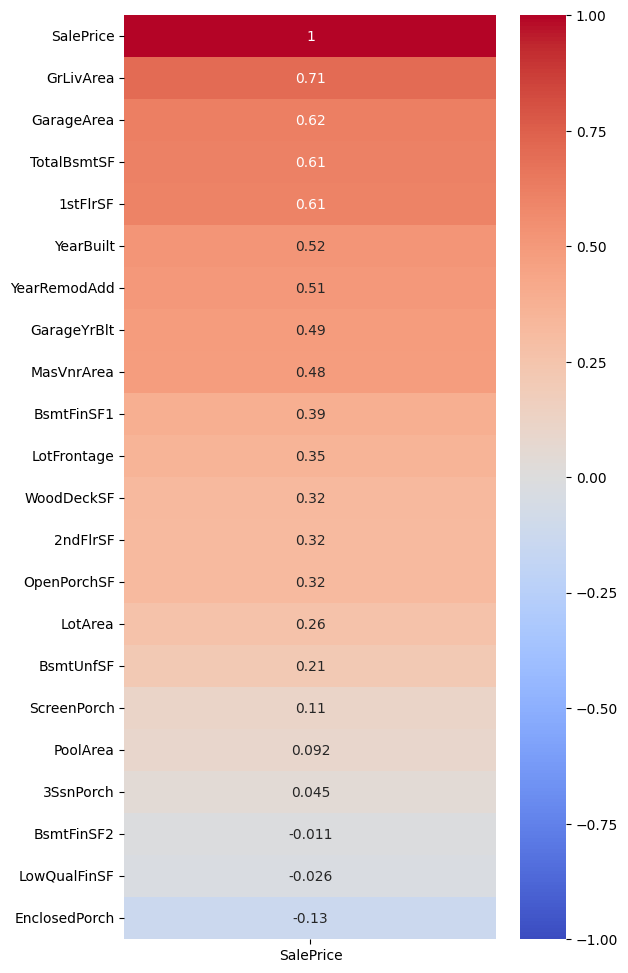

In [30]:
plt.figure(figsize=(6, 12))
sns.heatmap(cont_corr[['SalePrice']].sort_values(
                                            by='SalePrice',
                                            ascending=False
                                           ),
            cmap="coolwarm",
            annot=True,
            vmin=-1,
            vmax=1
           )
plt.show()

We can see that the numerical variables GrLivArea, GarageArea, 1stFlrSF, and YearRemodAdd are a few variables that are positively and strongly correlated with Sales Price. A scatterplot can be used to better visualize the relationship between each of these chosen three variables and SalesPrice

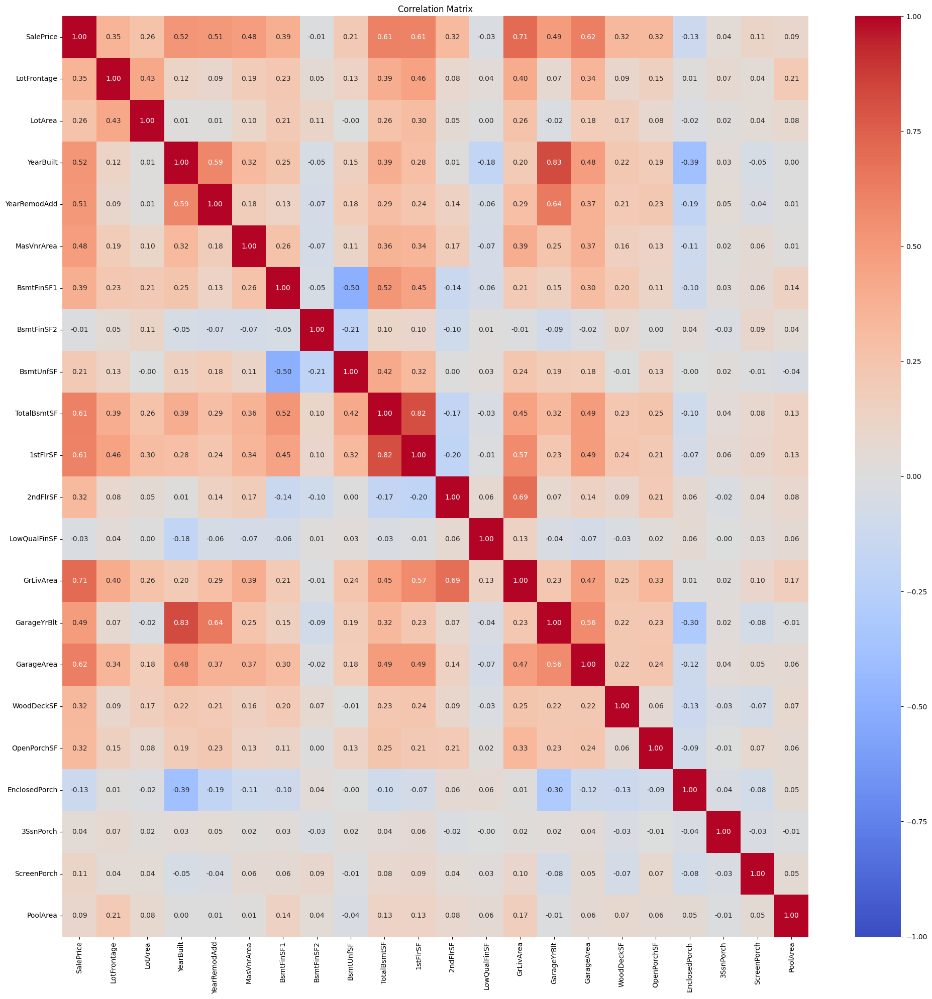

In [31]:
plt.figure(figsize=(20, 20))
sns.heatmap(cont_corr,
            annot=True,
            vmin=-1,
            vmax=1 ,
            cmap='coolwarm',
            fmt=".2f")
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

## Outlier Analysis

### Continous Variables

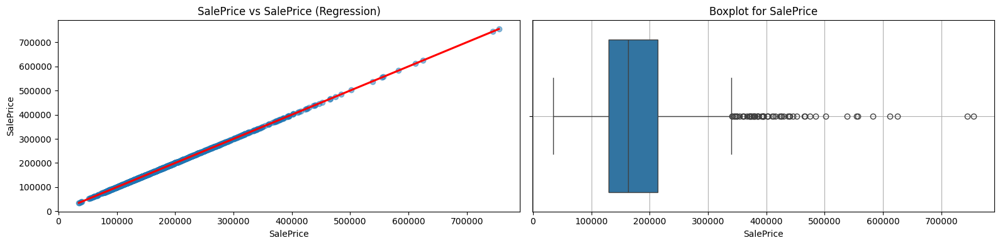

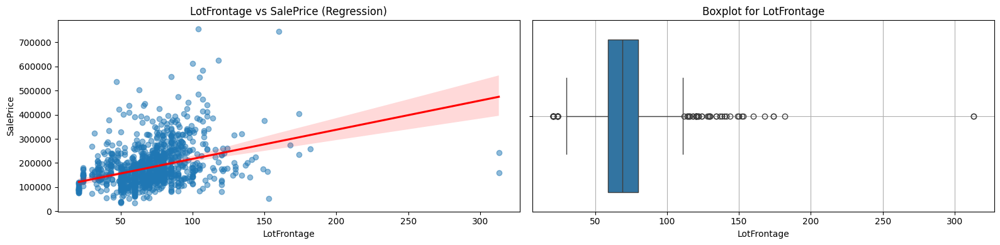

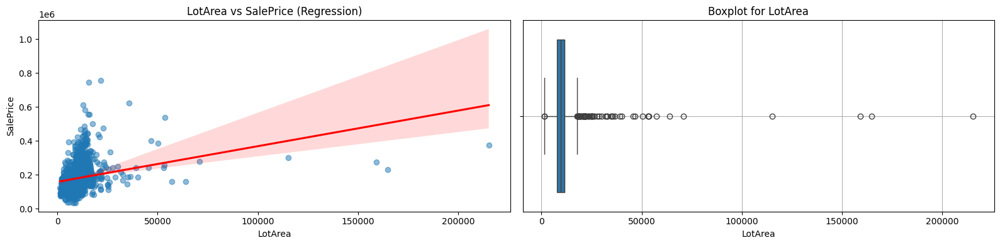

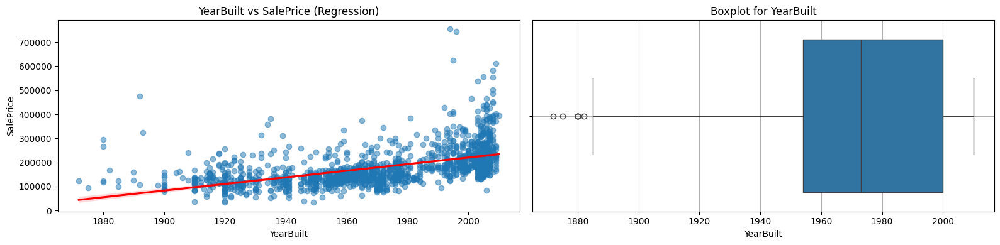

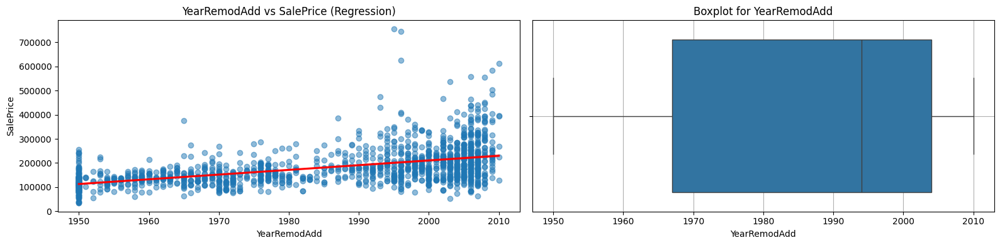

...

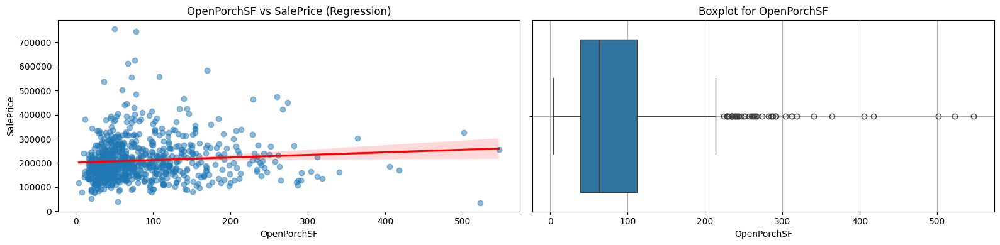

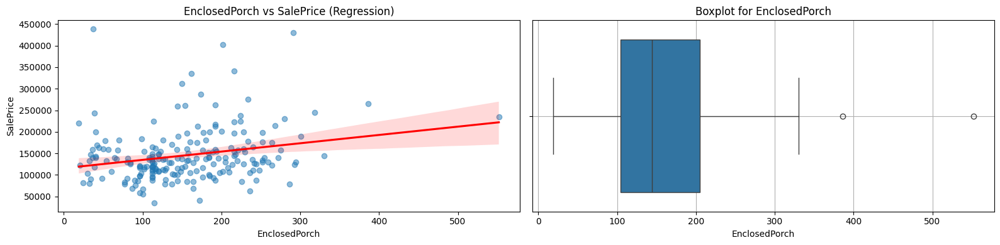

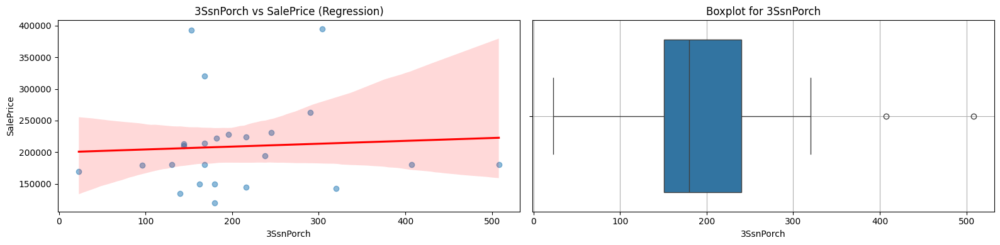

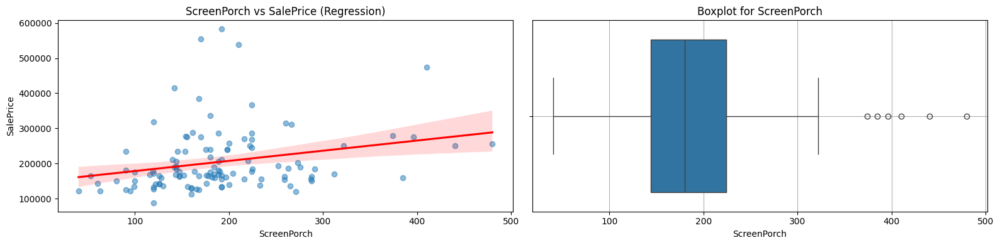

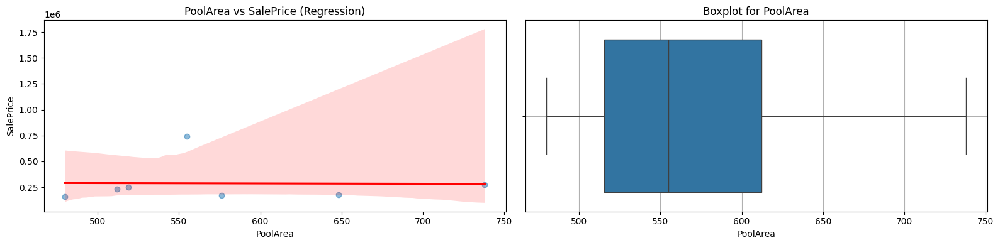

In [32]:
for col in continous_vars:
    # Filter out rows where the column is 0 or null
    filtered_df = train_df[(train_df[col] != 0) & (train_df[col].notnull()) & (train_df['SalePrice'].notnull())]

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))

    # Regression Plot
    sns.regplot(data=filtered_df,
                x=col,
                y='SalePrice',
                ax=axes[0],
                scatter_kws={'alpha': 0.5},
                line_kws={'color': 'red'})
    axes[0].set_title(f'{col} vs SalePrice (Regression)')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')

    # Boxplot
    sns.boxplot(x=filtered_df[col],
                ax=axes[1])
    axes[1].set_title(f'Boxplot for {col}')
    axes[1].set_xlabel(col)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


### Discrete Variables

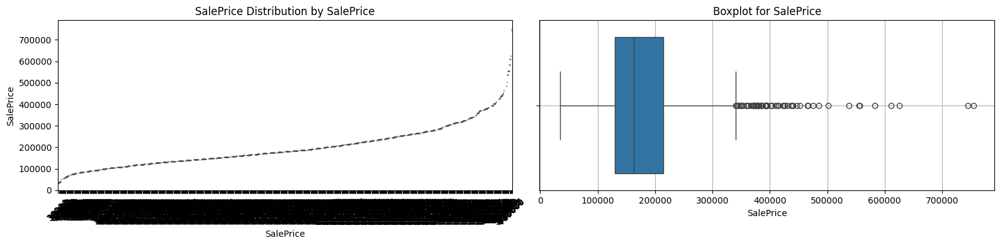

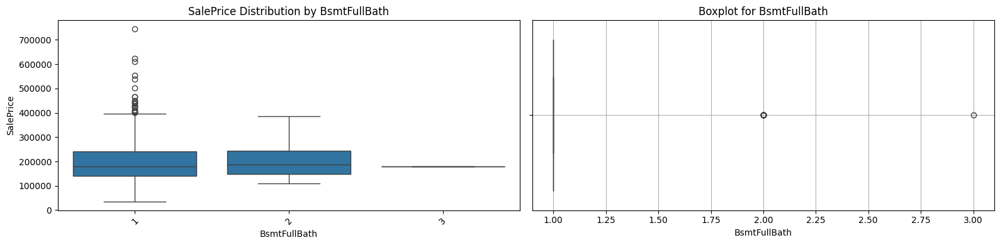

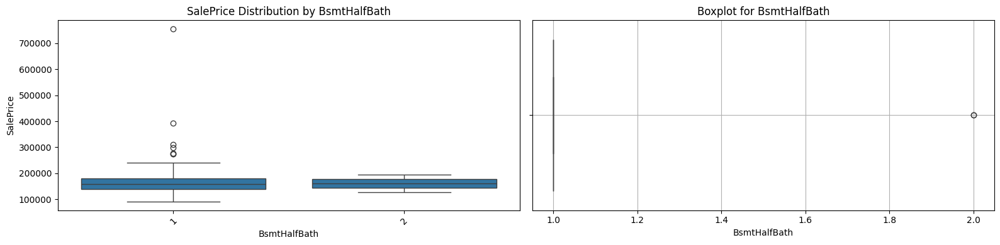

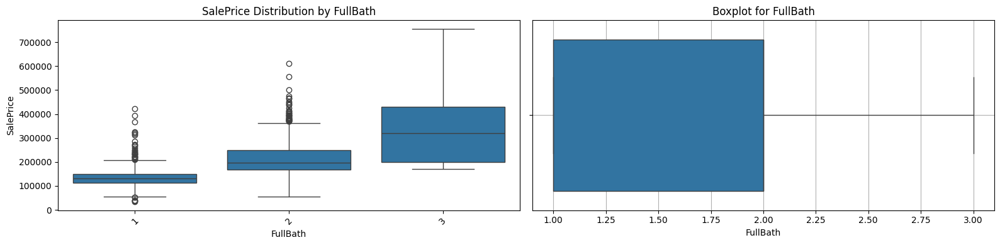

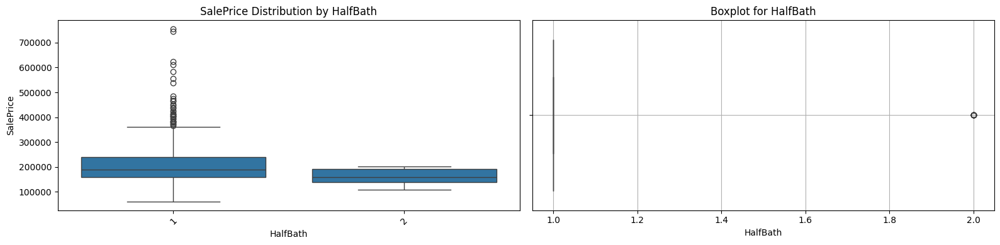

...

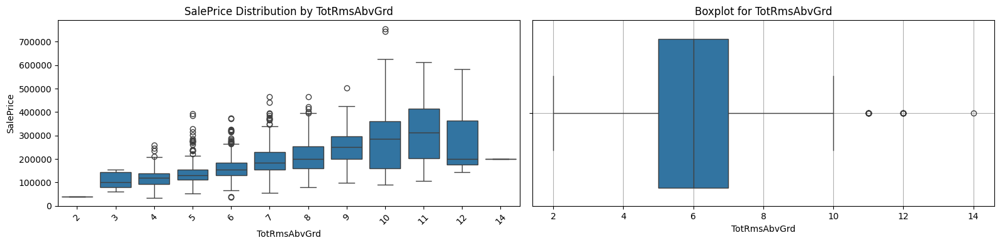

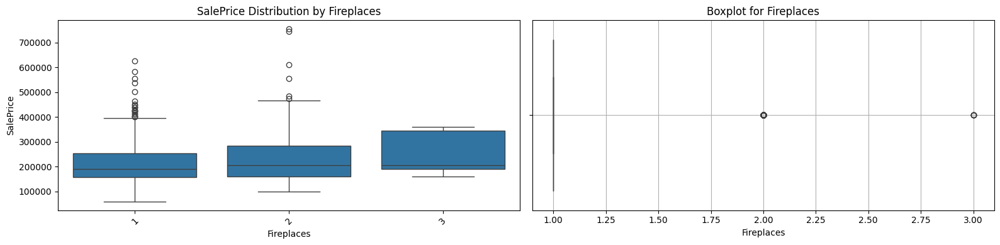

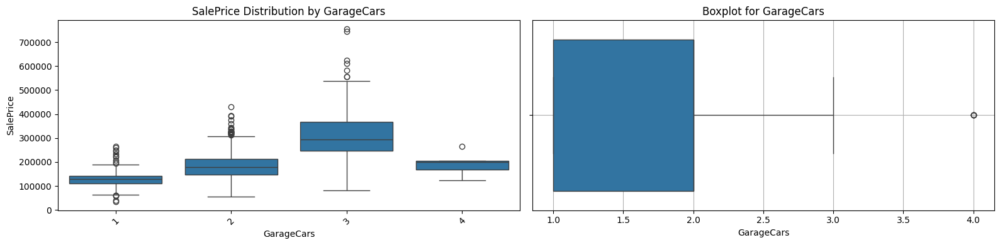

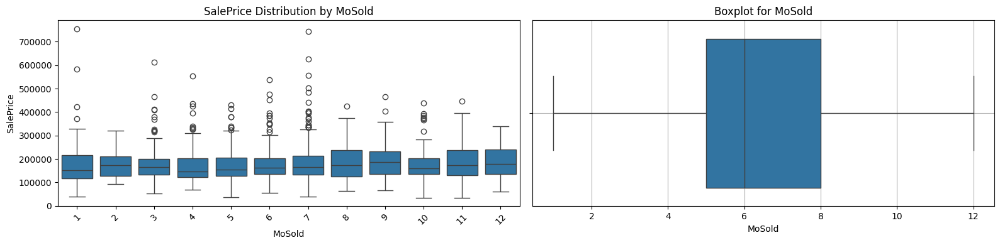

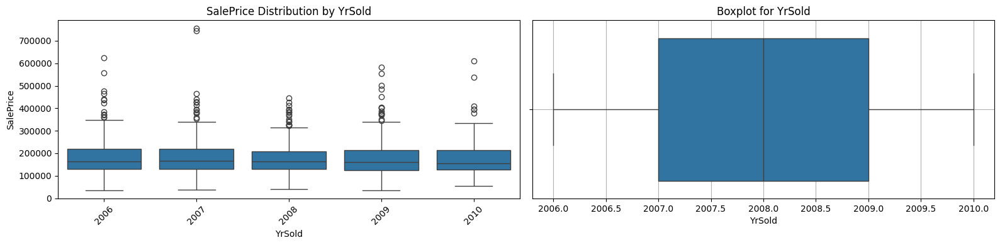

In [33]:
for col in discrete_vars:
    # Drop rows where 'col' or 'SalePrice' is NaN or where 'col' is 0
    filtered_df = train_df[
        (train_df[col].notnull()) & (train_df[col] != 0) &
        (train_df['SalePrice'].notnull())
    ]

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Boxplot of SalePrice for each category in col
    sns.boxplot(data=filtered_df, x=col, y='SalePrice', ax=axes[0])
    axes[0].set_title(f'SalePrice Distribution by {col}')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')
    axes[0].tick_params(axis='x', rotation=45)

    # Boxplot of the variable itself (distribution/frequency)
    sns.boxplot(x=filtered_df[col], ax=axes[1])
    axes[1].set_title(f'Boxplot for {col}')
    axes[1].set_xlabel(col)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


### Categorical Variables

In [34]:
for col in categorical_vars:

    # Get category order based on average SalePrice (ascending)
    ordered_categories = train_df.groupby(col)['SalePrice'].mean().sort_values().index

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Left: Boxplot of SalePrice by category
    sns.boxplot(data=train_df, x=col, y='SalePrice', ax=axes[0], order=ordered_categories)
    axes[0].set_title(f'SalePrice Distribution by {col}')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')
    axes[0].tick_params(axis='x', rotation=45)

    # Right: Frequency distribution (countplot is more intuitive than boxplot here)
    sns.countplot(data=train_df, x=col, ax=axes[1], order=ordered_categories)
    axes[1].set_title(f'Frequency of {col}')
    axes[1].set_xlabel(col)
    axes[1].set_ylabel('Count')
    axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

## Regression Review

In [35]:
f_scores_list = []
p_values_list = []
valid_vars = []

X_all = train_df[continous_vars].select_dtypes(include=[float, int]).drop(columns=['SalePrice'])
y = train_df['SalePrice']

for col in X_all.columns:
    X_col = X_all[[col]].dropna()
    y_col = y.loc[X_col.index]

    if X_col[col].nunique() < 2 or y_col.nunique() < 2:
        print(f"Skipping {col} (constant or invalid values)")
        continue

    try:
        f_score, p_val = f_regression(X_col, y_col)
        f_scores_list.append(f_score[0])
        p_values_list.append(p_val[0])
        valid_vars.append(col)
    except Exception as e:
        print(f"Skipping {col} due to error: {e}")

eval_table = pd.DataFrame({
    "variable": valid_vars,
    "f_scores": f_scores_list,
    "p_values": p_values_list
}).sort_values(by="p_values", ascending=True)

display(eval_table)

,variable,f_scores,p_values
12,GrLivArea,1470.585010,4.518034e-223
14,GarageArea,926.951287,5.265038e-158
8,TotalBsmtSF,880.341282,9.484229e-152
9,1stFlrSF,845.524488,5.394711e-147
2,YearBuilt,548.665821,2.990229e-103
3,YearRemodAdd,504.714855,3.164948e-96
4,MasVnrArea,428.237393,1.458509e-83
13,GarageYrBlt,426.648985,8.705128e-83
5,BsmtFinSF1,255.923517,3.394110e-53
15,WoodDeckSF,171.494673,3.972217e-37


# Variables of Interest

In [36]:
eval_var = ["SalePrice","GrLivArea","GarageArea","1stFlrSF","YearRemodAdd"]

## Descriptive Statistics - With Selected Variables

In [37]:
train_df[eval_var]

,SalePrice,GrLivArea,GarageArea,1stFlrSF,YearRemodAdd
0,208500,1710,548,856,2003
1,181500,1262,460,1262,1976
2,223500,1786,608,920,2002
3,140000,1717,642,961,1970
4,250000,2198,836,1145,2000
...,...,...,...,...,...
1455,175000,1647,460,953,2000
1456,210000,2073,500,2073,1988
1457,266500,2340,252,1188,2006
1458,142125,1078,240,1078,1996


In [38]:
for var in eval_var:
    print(var)
    print(train_df[var].head())

SalePrice
0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64
GrLivArea
0    1710
1    1262
2    1786
3    1717
4    2198
Name: GrLivArea, dtype: int64
GarageArea
0    548
1    460
2    608
3    642
4    836
Name: GarageArea, dtype: int64
1stFlrSF
0     856
1    1262
2     920
3     961
4    1145
Name: 1stFlrSF, dtype: int64
YearRemodAdd
0    2003
1    1976
2    2002
3    1970
4    2000
Name: YearRemodAdd, dtype: int64


In [39]:
for var in eval_var:
    print(var)
    print(train_df[var].info())

SalePrice
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: SalePrice
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
GrLivArea
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: GrLivArea
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
GarageArea
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: GarageArea
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
1stFlrSF
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: 1stFlrSF
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
YearRemodAdd
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: YearRemodAdd
Non-Null Count  Dtype
-------

In [40]:
for var in eval_var:
    print(var)
    print(train_df[var].describe())

SalePrice
count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64
GrLivArea
count    1460.000000
mean     1515.463699
std       525.480383
min       334.000000
25%      1129.500000
50%      1464.000000
75%      1776.750000
max      5642.000000
Name: GrLivArea, dtype: float64
GarageArea
count    1460.000000
mean      472.980137
std       213.804841
min         0.000000
25%       334.500000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64
1stFlrSF
count    1460.000000
mean     1162.626712
std       386.587738
min       334.000000
25%       882.000000
50%      1087.000000
75%      1391.250000
max      4692.000000
Name: 1stFlrSF, dtype: float64
YearRemodAdd
count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%  

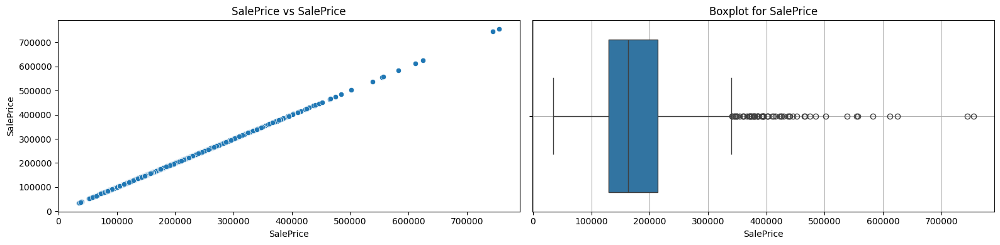

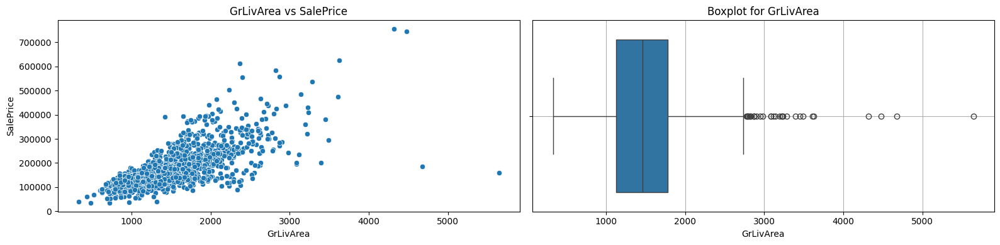

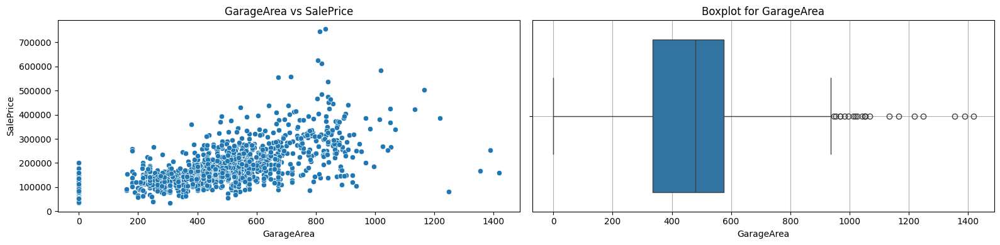

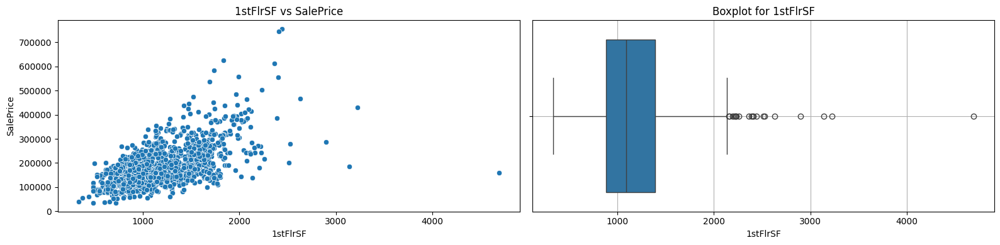

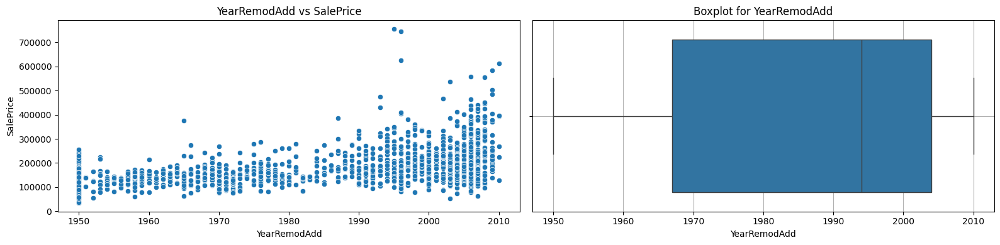

In [41]:
for var in eval_var:
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Scatterplot of var vs SalePrice
    sns.scatterplot(data=train_df, x=var, y='SalePrice', ax=axes[0])
    axes[0].set_title(f'{var} vs SalePrice')
    axes[0].set_xlabel(var)
    axes[0].set_ylabel('SalePrice')

    # Boxplot of var
    sns.boxplot(x=train_df[var], ax=axes[1])
    axes[1].set_title(f'Boxplot for {var}')
    axes[1].set_xlabel(var)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

## Correlation Investigation

In [42]:
corr_subset = train_df[eval_var].corr()

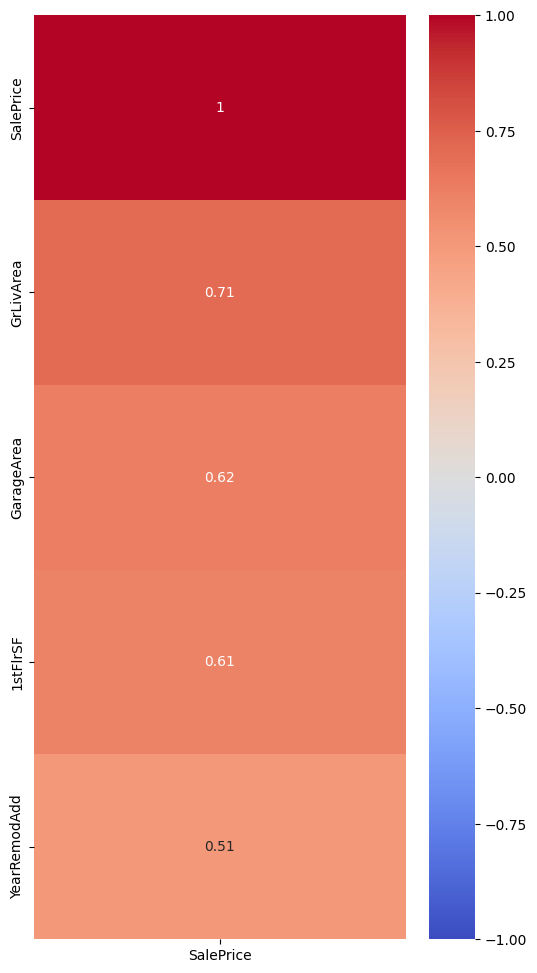

In [43]:
plt.figure(figsize=(6, 12))
sns.heatmap(corr_subset[['SalePrice']].sort_values(
                                                   by='SalePrice',
                                                   ascending=False
                                                  ),
            cmap="coolwarm",
            annot=True,
            vmin=-1,
            vmax=1
           )
plt.show()

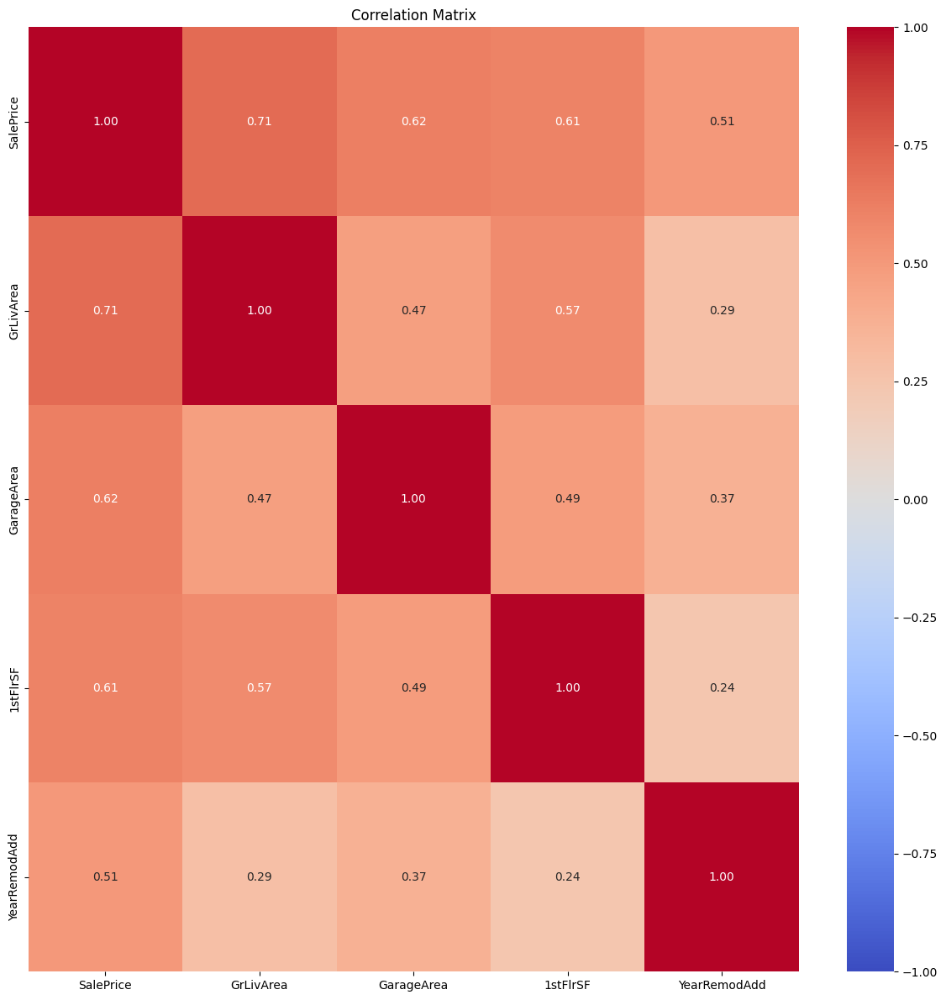

In [44]:
plt.figure(figsize=(12, 12))
sns.heatmap(corr_subset,
            annot=True,
            vmin=-1,
            vmax=1 ,
            cmap='coolwarm',
            fmt=".2f")
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

## Outlier Analysis

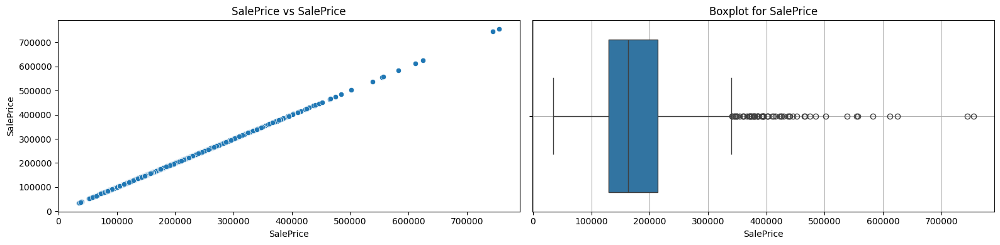

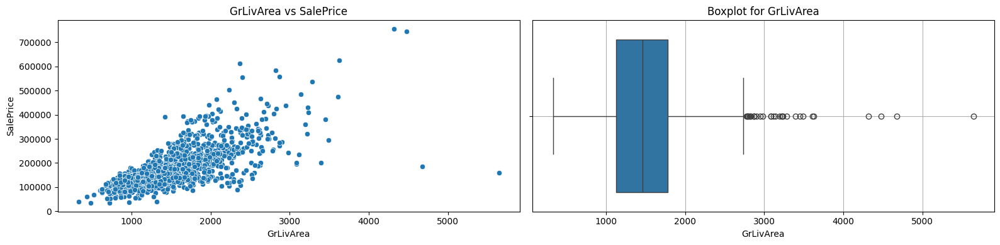

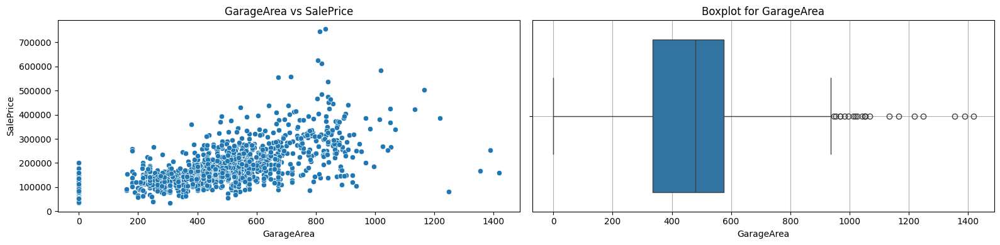

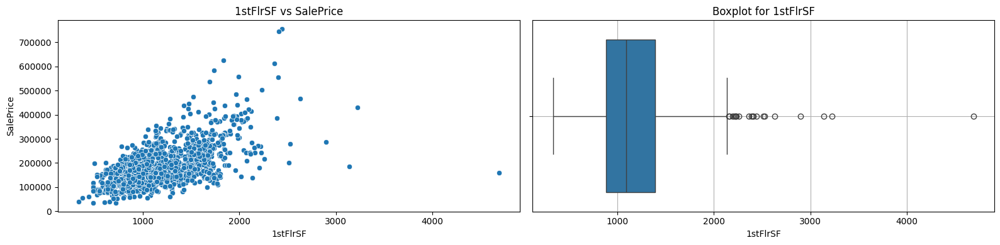

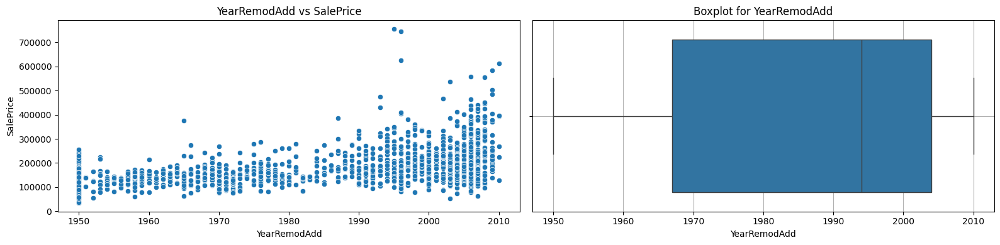

In [45]:
for col in eval_var:
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Scatterplot of col vs SalePrice
    sns.scatterplot(data=train_df, x=col, y='SalePrice', ax=axes[0])
    axes[0].set_title(f'{col} vs SalePrice')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')

    # Boxplot of col
    sns.boxplot(x=train_df[col], ax=axes[1])
    axes[1].set_title(f'Boxplot for {col}')
    axes[1].set_xlabel(col)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

## Regression Review

In [46]:
f_scores_list = []
p_values_list = []
valid_vars = []

X_all = train_df[eval_var].select_dtypes(include=[float, int]).drop(columns=['SalePrice'])
y = train_df['SalePrice']

for col in X_all.columns:
    X_col = X_all[[col]].dropna()
    y_col = y.loc[X_col.index]

    if X_col[col].nunique() < 2 or y_col.nunique() < 2:
        print(f"Skipping {col} (constant or invalid values)")
        continue

    try:
        f_score, p_val = f_regression(X_col, y_col)
        f_scores_list.append(f_score[0])
        p_values_list.append(p_val[0])
        valid_vars.append(col)
    except Exception as e:
        print(f"Skipping {col} due to error: {e}")

eval_table = pd.DataFrame({
    "variable": valid_vars,
    "f_scores": f_scores_list,
    "p_values": p_values_list
}).sort_values(by="p_values", ascending=True)

display(eval_table)

,variable,f_scores,p_values
0,GrLivArea,1470.585010,4.518034e-223
1,GarageArea,926.951287,5.265038e-158
2,1stFlrSF,845.524488,5.394711e-147
3,YearRemodAdd,504.714855,3.164948e-96


Using this multiple regression model, we can see that the p values for our potential predictors are very small, so we would identify these variables as potentially significant predictors. The p value provides evidence for whether the affect of potential predictors on SalesPrice could have been produced by chance, and since all p values are very small, we can conclude that these variables do affect SalesPrice in an important way.

 We will continue our analysis of these four variables. We can generate a linear regression model to determine the p-values of potential predictors and evaluate their potential for further use.

# Feature Exploration & Creation

We will create new features to improve our regression model. These features are based on simple ideas, like the age of a house and whether it has a pool. We will:  
- Make three new variables: `AgeOfHouse`, `Remodeled`, and `HasPool`  
- Check their values  
- Show their distributions in a graph  

In [47]:
df_features = train_df.copy()
df_features.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [48]:
# How old the house was when sold
df_features['AgeOfHouse'] = df_features['YrSold'] - df_features['YearBuilt']
print("Age of House (first 5 values):")
print(df_features['AgeOfHouse'].head())


Age of House (first 5 values):
0     5
1    31
2     7
3    91
4     8
Name: AgeOfHouse, dtype: int64


In [49]:
#  Remodeled or not(1 if remodeled, 0 otherwise)
df_features['Remodeled'] = (df_features['YearRemodAdd'] != df_features['YearBuilt']).astype(int)
print("Remodeled Value Counts:")
print(df_features['Remodeled'].value_counts())


Remodeled Value Counts:
Remodeled
0    764
1    696
Name: count, dtype: int64


In [50]:
# HasPool or not (1 if PoolArea > 0, else 0)
df_features['HasPool'] = df_features['PoolArea'].apply(lambda x: 1 if x > 0 else 0)

print("Has Pool Value Counts:")
print(df_features['HasPool'].value_counts())

Has Pool Value Counts:
HasPool
0    1453
1       7
Name: count, dtype: int64


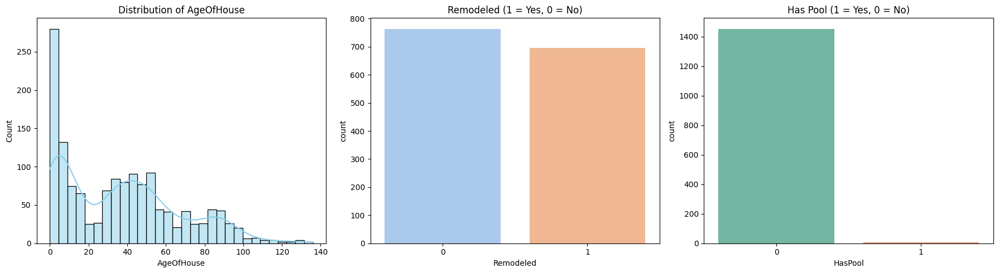

In [51]:
plt.figure(figsize=(18, 5))

# AgeOfHouse
plt.subplot(1, 3, 1)
sns.histplot(df_features['AgeOfHouse'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of AgeOfHouse')

# Remodeled
plt.subplot(1, 3, 2)
sns.countplot(x='Remodeled', hue='Remodeled', data=df_features, palette='pastel', legend=False)
plt.title('Remodeled (1 = Yes, 0 = No)')

# HasPool
plt.subplot(1, 3, 3)
sns.countplot(x='HasPool',hue='HasPool', data=df_features, palette='Set2',legend=False)
plt.title('Has Pool (1 = Yes, 0 = No)')

plt.tight_layout()
plt.show()

In [52]:
# Creating more features like 'TotalSqFeet' by adding basement, 1st and 2nd floor areas
df_features['TotalSqFeet'] = df_features['TotalBsmtSF'] + df_features['1stFlrSF'] + df_features['2ndFlrSF']

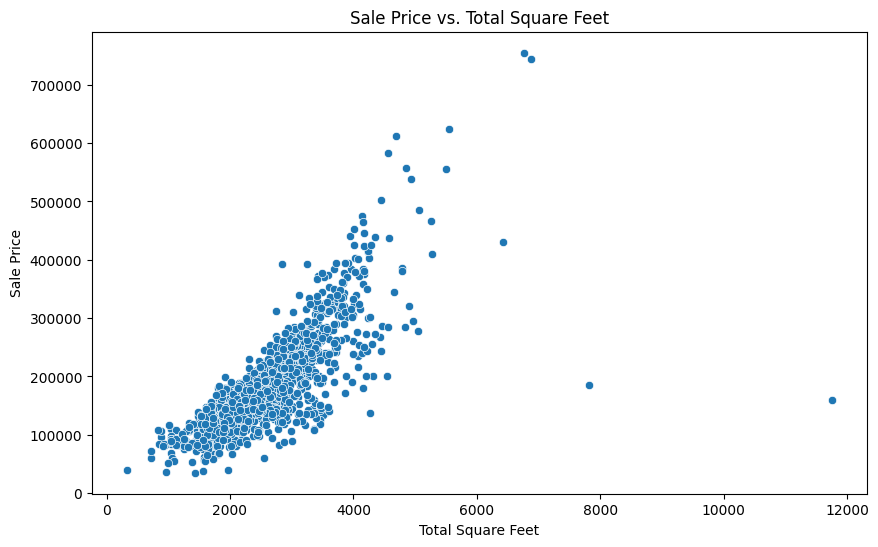

In [53]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_features['TotalSqFeet'], y=df_features['SalePrice'])
plt.title('Sale Price vs. Total Square Feet')
plt.xlabel('Total Square Feet')
plt.ylabel('Sale Price')
plt.show()

- **Age of House:** Most homes sold are relatively new, under 30 years old, with a few older properties. This shows that newer homes are more common in the market.

- **Remodeled:** There is a nearly equal number of remodeled homes (696) and homes that have not been remodeled (764). Remodeling may suggest updates or repairs that can affect how buyers see the home and its price.

- **Has Pool:** Only 7 homes have pools, making this a rare luxury feature. It serves as a simple indicator that helps identify unusual pricing.

- **Total Square Feet vs. Sale Price:** Bigger homes usually sell for higher prices, which confirms what we expect. However, there is a lot of price variation, especially among larger homes, indicating that other factors like location, condition, or features also play a role in pricing.

# Scaling: MinMax

In [54]:
# Numeric columns
columns = ['SalePrice','AgeOfHouse', 'TotalSqFeet', 'GarageArea', 'YearRemodAdd',
           'OverallQual', 'OverallCond',
           'LotArea',
           'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
           '1stFlrSF', '2ndFlrSF',
           'GrLivArea',
           'BsmtFullBath', 'BsmtHalfBath',
           'FullBath', 'HalfBath',
           'BedroomAbvGr', 'TotRmsAbvGrd',
           'Fireplaces', 'MasVnrArea',
           'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch',
           'GarageYrBlt', 'GarageCars', 'GarageArea'
]
# Initialize MinMaxScaler
minmax_scalar = MinMaxScaler()

# Fit and transform the data
df_scaled_minmax = pd.DataFrame(minmax_scalar.fit_transform(df_features[columns]), columns=columns)
print("Min-Max Scaled Data:")
df_scaled_minmax.head()

Min-Max Scaled Data:


,SalePrice,AgeOfHouse,TotalSqFeet,GarageArea,YearRemodAdd,OverallQual,OverallCond,LotArea,BsmtFinSF1,BsmtFinSF2,...,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,MasVnrArea,WoodDeckSF,OpenPorchSF,ScreenPorch,GarageYrBlt,GarageCars,GarageArea
0,0.241078,0.036765,0.195481,0.386460,0.883333,0.666667,0.500,0.033420,0.125089,0.0,...,0.375,0.500000,0.000000,0.12250,0.000000,0.111517,0.0,0.936364,0.50,0.386460
1,0.203583,0.227941,0.191802,0.324401,0.433333,0.555556,0.875,0.038795,0.173281,0.0,...,0.375,0.333333,0.333333,0.00000,0.347725,0.000000,0.0,0.690909,0.50,0.324401
2,0.261908,0.051471,0.207742,0.428773,0.866667,0.666667,0.500,0.046507,0.086109,0.0,...,0.375,0.333333,0.333333,0.10125,0.000000,0.076782,0.0,0.918182,0.50,0.428773
3,0.145952,0.669118,0.187336,0.452750,0.333333,0.666667,0.500,0.038561,0.038271,0.0,...,0.375,0.416667,0.333333,0.00000,0.000000,0.063985,0.0,0.890909,0.75,0.452750
4,0.298709,0.058824,0.263531,0.589563,0.833333,0.777778,0.500,0.060576,0.116052,0.0,...,0.500,0.583333,0.333333,0.21875,0.224037,0.153565,0.0,0.909091,0.75,0.589563


In [55]:
# get range over all values
print("Overall Max:", df_scaled_minmax.max().max())
print("Overall Min:", df_scaled_minmax.min().min())

Overall Max: 1.0
Overall Min: 0.0


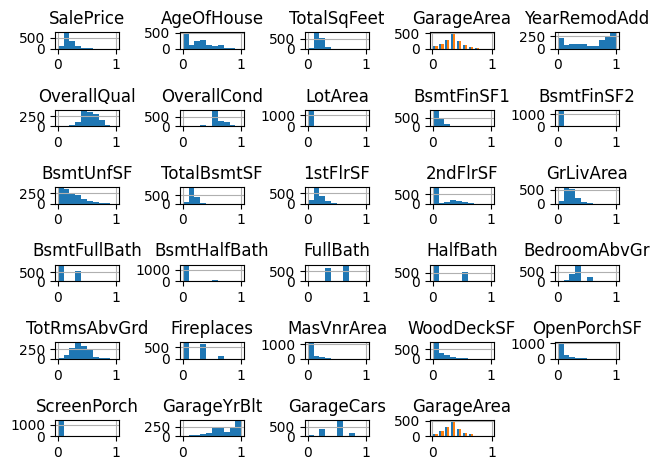

In [56]:
df_scaled_minmax.hist()
plt.tight_layout()
plt.show()

# Scaling: Standardization

In [57]:
# Initialize StandardScaler
standard_scaler = StandardScaler()

# Fit and transform the data
df_scaled_standard = pd.DataFrame(standard_scaler.fit_transform(df_features[columns]), columns=columns)
print("Standard Scaled Data:")
df_scaled_standard.head()

Standard Scaled Data:


,SalePrice,AgeOfHouse,TotalSqFeet,GarageArea,YearRemodAdd,OverallQual,OverallCond,LotArea,BsmtFinSF1,BsmtFinSF2,...,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,MasVnrArea,WoodDeckSF,OpenPorchSF,ScreenPorch,GarageYrBlt,GarageCars,GarageArea
0,0.347273,-1.043259,-0.001277,0.351000,0.878668,0.651479,-0.517200,-0.207142,0.575425,-0.288653,...,0.163779,0.912210,-0.951226,0.510015,-0.752176,0.216503,-0.270208,0.992426,0.311725,0.351000
1,0.007288,-0.183465,-0.052407,-0.060731,-0.429577,-0.071836,2.179628,-0.091886,1.171992,-0.288653,...,0.163779,-0.318683,0.600495,-0.572835,1.626195,-0.704483,-0.270208,-0.101543,0.311725,-0.060731
2,0.536154,-0.977121,0.169157,0.631726,0.830215,0.651479,-0.517200,0.073480,0.092907,-0.288653,...,0.163779,-0.318683,0.600495,0.322174,-0.752176,-0.070361,-0.270208,0.911391,0.311725,0.631726
3,-0.515281,1.800676,-0.114493,0.790804,-0.720298,0.651479,-0.517200,-0.096897,-0.499274,-0.288653,...,0.163779,0.296763,0.600495,-0.572835,-0.752176,-0.176048,-0.270208,0.789839,1.650307,0.790804
4,0.869843,-0.944052,0.944631,1.698485,0.733308,1.374795,-0.517200,0.375148,0.463568,-0.288653,...,1.390023,1.527656,0.600495,1.360826,0.780197,0.563760,-0.270208,0.870874,1.650307,1.698485


In [58]:
# get range over all values
print("Overall Max:", df_scaled_standard.max().max())
print("Overall Min:", df_scaled_standard.min().min())

Overall Max: 20.51827315777325
Overall Min: -4.112969893342749


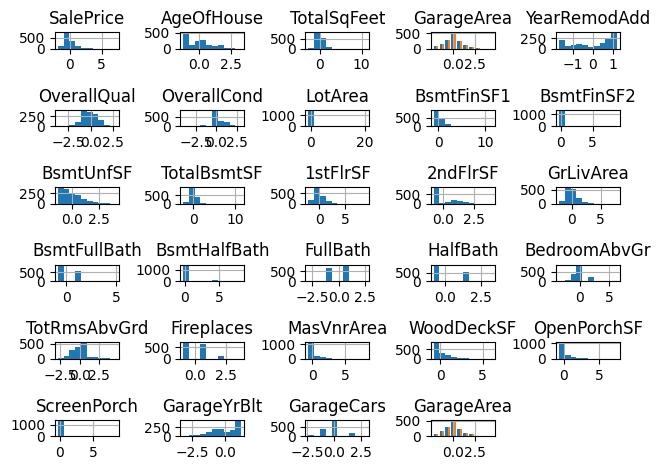

In [59]:
df_scaled_standard.hist()
plt.tight_layout()
plt.show()

# Regression Modelling

In [60]:
# function to print VIF and return summary data
def ols_function_modeling(y, X, X_const):
  # output VIF values
  vif_data = pd.DataFrame()
  vif_data["Feature"] = X_const.columns
  vif_data["VIF"] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]
  print(vif_data)
  print()

  # fit model and output summary
  model = sm.OLS(y, X).fit()
  return model

In [61]:
# A function to train an OLS model and return predictions on test data
def return_predictions(X_train, X_test, y_train):
    # Add intercept term manually (required for statsmodels OLS)
    X_train = sm.add_constant(X_train, has_constant='add')
    X_test = sm.add_constant(X_test, has_constant='add')

    # Fit model and predict
    ols_model = sm.OLS(y_train, X_train).fit()
    preds = ols_model.predict(X_test)

    return preds, ols_model

# Cross-validation loop to get predicted and actual values across all folds
def cross_validation_predictions(X, y):
    prediction_list = []
    y_true_list = []
    model_list = []

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    for train_idx, test_idx in kf.split(X):
        # Support both NumPy arrays and pandas DataFrames
        X_train = X.iloc[train_idx] if hasattr(X, 'iloc') else X[train_idx]
        X_test = X.iloc[test_idx] if hasattr(X, 'iloc') else X[test_idx]
        y_train = y[train_idx]
        y_test = y[test_idx]

        preds, model = return_predictions(X_train, X_test, y_train)
        prediction_list.append(preds)
        y_true_list.append(y_test)
        model_list.append(model)

    return prediction_list, y_true_list, model_list

# Calculates and stores regression performance metrics
def return_cross_validation_metrics(y_test_list, prediction_list, model_list):
    metrics = {
        'r2': [],
        'mse': [],
        'rmse': [],
        'mae': [],
        'y_true': [],
        'y_pred': [],
        'residuals': [],
        'adj_r2': [],
        'aic': [],
    }

    # Model-specific metrics across folds
    for i, model in enumerate(model_list):
        preds = prediction_list[i]
        y_test = y_test_list[i]

        metrics['adj_r2'].append(model.rsquared_adj)
        metrics['aic'].append(model.aic)
        metrics['r2'].append(r2_score(y_test, preds))
        metrics['mse'].append(mean_squared_error(y_test, preds))
        metrics['rmse'].append(np.sqrt(mean_squared_error(y_test, preds)))
        metrics['mae'].append(mean_absolute_error(y_test, preds))
        metrics['y_true'].extend(y_test)
        metrics['y_pred'].extend(preds)
        metrics['residuals'].extend(y_test - preds)

    return metrics

# Print all metrics from the report
def print_cross_validation_metrics(metrics):
    print("Cross-Validated Goodness-of-Fit Summary:\n" + "-" * 50)
    for name, vals in metrics.items():
        if isinstance(vals, list) and all(isinstance(v, (int, float, np.floating)) for v in vals):
            print(f"{name:10}: {np.mean(vals):.4f}")

## Model 1
Regression modeling over a subset of chosen features, no scaling

In [62]:
X1 = df_features[['AgeOfHouse', 'TotalSqFeet', 'GarageArea', 'YearRemodAdd']]
y1 = df_features['SalePrice']
X1_const = add_constant(X1)

In [63]:
# pass to function for modeling
model_1 = ols_function_modeling(y1, X1, X1_const)
print(model_1.summary())

        Feature           VIF
0         const  14761.478637
1    AgeOfHouse      1.746000
2   TotalSqFeet      1.512370
3    GarageArea      1.695558
4  YearRemodAdd      1.590378

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.952
Model:                            OLS   Adj. R-squared (uncentered):              0.952
Method:                 Least Squares   F-statistic:                              7191.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):                        0.00
Time:                        16:05:50   Log-Likelihood:                         -17661.
No. Observations:                1460   AIC:                                  3.533e+04
Df Residuals:                    1456   BIC:                                  3.535e+04
Df Model:                           4                                                  
Covariance Type:           

In [64]:
# cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X1, y1)
model_1_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_1_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6811
mse       : 1939047817.1710
rmse      : 42883.3868
mae       : 26251.7718
y_true    : 180921.1959
y_pred    : 181020.7499
residuals : -99.5541
adj_r2    : 0.7180
aic       : 28185.8739


In [65]:
# model1 = sm.OLS(y1, X1).fit()

In [66]:
# vif_data1 = pd.DataFrame()
# vif_data1["Feature"] = X1_const.columns
# vif_data1["VIF"] = [variance_inflation_factor(X1_const.values, i) for i in range(X1_const.shape[1])]

In [67]:
# print(vif_data1)

In [68]:
# print(model1.summary())

## Model 2
Regression modeling over a separate subset of chosen features, no scaling

In [69]:
X2 = df_features[['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']]
y2 = df_features['SalePrice']
X2_const = add_constant(X2)

In [70]:
# pass to function for modeling
model_2 = ols_function_modeling(y2, X2, X2_const)
print(model_2.summary())

        Feature           VIF
0         const  13619.776384
1   TotalBsmtSF      1.558372
2     GrLivArea      2.114247
3      FullBath      1.932370
4    GarageArea      1.634378
5   OverallQual      2.462756
6  YearRemodAdd      1.548478

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.961
Model:                            OLS   Adj. R-squared (uncentered):              0.960
Method:                 Least Squares   F-statistic:                              5896.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):                        0.00
Time:                        16:05:50   Log-Likelihood:                         -17515.
No. Observations:                1460   AIC:                                  3.504e+04
Df Residuals:                    1454   BIC:                                  3.507e+04
Df Model:                           6                  

In [71]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X2, y2)
model_2_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_2_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7339
mse       : 1623559188.5505
rmse      : 39355.4940
mae       : 24438.2108
y_true    : 180921.1959
y_pred    : 180977.2067
residuals : -56.0108
adj_r2    : 0.7661
aic       : 27971.0865


In [72]:
# model2 = sm.OLS(y2, X2).fit()

In [73]:
# vif_data2 = pd.DataFrame()
# vif_data2["Feature"] = X2_const.columns
# vif_data2["VIF"] = [variance_inflation_factor(X2_const.values, i) for i in range(X2_const.shape[1])]

In [74]:
# print(vif_data2)

In [75]:
# print(model2.summary())

## Model 3
Regression modeling over a subset of chosen features, standard scaling.
Use variables from Model 2 to attempt to address multicollinearity

In [76]:
x_scaler = StandardScaler()
y_scaler = StandardScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X3 = pd.DataFrame(x_scaler.fit_transform(df_features[columns]), columns=columns)
y3 = pd.DataFrame(y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]
X3_const = add_constant(X3)

In [77]:
# pass to function for modeling
model_3 = ols_function_modeling(y3, X3, X3_const)
print(model_3.summary())

        Feature       VIF
0         const  1.000000
1   TotalBsmtSF  1.558372
2     GrLivArea  2.114247
3      FullBath  1.932370
4    GarageArea  1.634378
5   OverallQual  2.462756
6  YearRemodAdd  1.548478

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.765
Model:                            OLS   Adj. R-squared (uncentered):              0.764
Method:                 Least Squares   F-statistic:                              790.6
Date:                Sun, 13 Jul 2025   Prob (F-statistic):                        0.00
Time:                        16:05:50   Log-Likelihood:                         -1013.3
No. Observations:                1460   AIC:                                      2039.
Df Residuals:                    1454   BIC:                                      2070.
Df Model:                           6                                                  

In [78]:
# cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X3, y3)

# need to inverse scale predictions and y_test
predictions = [y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in predictions]
y_test = [y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_test]


# obtain metrics
model_3_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_3_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7339
mse       : 1623559188.5505
rmse      : 39355.4940
mae       : 24438.2108
y_true    : 180921.1959
y_pred    : 180977.2067
residuals : -56.0108
adj_r2    : 0.7661
aic       : 1615.2921


## Model 4
Regression modeling over a subset of chosen features, MinMax scaling, again to see improvement over metrics while mitigating multicollinearity


In [79]:
min_max_x_scaler = MinMaxScaler()
min_max_y_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X4 = pd.DataFrame(min_max_x_scaler.fit_transform(df_features[columns]), columns=columns)
y4 = pd.DataFrame(min_max_y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]
X4_const = add_constant(X4)

In [80]:
# pass to function for modeling
model_4 = ols_function_modeling(y4, X4, X4_const)
print(model_4.summary())

        Feature        VIF
0         const  16.521068
1   TotalBsmtSF   1.558372
2     GrLivArea   2.114247
3      FullBath   1.932370
4    GarageArea   1.634378
5   OverallQual   2.462756
6  YearRemodAdd   1.548478

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.928
Model:                            OLS   Adj. R-squared (uncentered):              0.928
Method:                 Least Squares   F-statistic:                              3133.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):                        0.00
Time:                        16:05:50   Log-Likelihood:                          1991.5
No. Observations:                1460   AIC:                                     -3971.
Df Residuals:                    1454   BIC:                                     -3939.
Df Model:                           6                                          

In [81]:
# cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X4, y4)

# need to inverse scale predictions and y_test
predictions = [min_max_y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in predictions]
y_test = [min_max_y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_test]


# obtain metrics
model_4_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_4_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7339
mse       : 1623559188.5505
rmse      : 39355.4940
mae       : 24438.2108
y_true    : 180921.1959
y_pred    : 180977.2067
residuals : -56.0108
adj_r2    : 0.7661
aic       : -3534.8851


In [82]:
# vif_data2 = pd.DataFrame()
# vif_data2["Feature"] = X2_const.columns
# vif_data2["VIF"] = [variance_inflation_factor(X2_const.values, i) for i in range(X2_const.shape[1])]

## Model 5
Linear regression utilizing Foward feature selection, another way to perform regression while potentially mitigating multicollinarity

In [83]:
# confirming feature selection of numericfal with forward selection
y = df_features.SalePrice
X= df_features[['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd','AgeOfHouse', 'TotalSqFeet']]

linearreg = LinearRegression()
forwad = SequentialFeatureSelector(
linearreg,
k_features=4,
forward=True,
verbose=1,
scoring="neg_mean_squared_error"
)
sf = forwad.fit(X,y)

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished
Features: 1/4[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s finished
Features: 2/4[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s finished
Features: 3/4[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished
Features: 4/4

In [84]:
# outputting the selected best 4 features
feat_names = list(sf.k_feature_names_)
print(feat_names)

print(sf.k_feature_idx_)

['GarageArea', 'OverallQual', 'YearRemodAdd', 'TotalSqFeet']
(3, 4, 5, 7)


In [85]:
# model with selected features
X5 = df_features[feat_names]
y5 = df_features['SalePrice']
X5_const = add_constant(X5)

In [86]:
# pass to function for modeling
model_5 = ols_function_modeling(y5, X5, X5_const)
print(model_5.summary())

        Feature           VIF
0         const  12814.298095
1    GarageArea      1.631435
2   OverallQual      2.415773
3  YearRemodAdd      1.454402
4   TotalSqFeet      2.003170

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.960
Model:                            OLS   Adj. R-squared (uncentered):              0.960
Method:                 Least Squares   F-statistic:                              8787.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):                        0.00
Time:                        16:05:51   Log-Likelihood:                         -17521.
No. Observations:                1460   AIC:                                  3.505e+04
Df Residuals:                    1456   BIC:                                  3.507e+04
Df Model:                           4                                                  
Covariance Type:           

In [87]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X5, y5)
model_5_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_5_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7323
mse       : 1632503182.3843
rmse      : 39443.2008
mae       : 24370.6726
y_true    : 180921.1959
y_pred    : 180988.3851
residuals : -67.1892
adj_r2    : 0.7645
aic       : 27976.9082


## Model 6
Polynomial Regression over a subset of features,  employing MinMax scaling to attempt to optimize on Model 3


In [88]:
mod_6_x_scaler = MinMaxScaler()
mod_6_y_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X6 = pd.DataFrame(mod_6_x_scaler.fit_transform(df_features[columns]), columns=columns)
y6 = pd.DataFrame(mod_6_y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]
X6_const = add_constant(X6)

In [89]:
polynomial_features= PolynomialFeatures(degree=3)
xp = polynomial_features.fit_transform(X6)
xp.shape

(1460, 84)

In [90]:
# pass to function for modeling
model_6 = ols_function_modeling(y6, xp, X6_const)
print(model_6.summary())

        Feature        VIF
0         const  16.521068
1   TotalBsmtSF   1.558372
2     GrLivArea   2.114247
3      FullBath   1.932370
4    GarageArea   1.634378
5   OverallQual   2.462756
6  YearRemodAdd   1.548478

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     120.3
Date:                Sun, 13 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:05:51   Log-Likelihood:                 2688.3
No. Observations:                1460   AIC:                            -5209.
Df Residuals:                    1376   BIC:                            -4765.
Df Model:                          83                                         
Covariance Type:            nonrobust                                   

In [91]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(xp, y6)

# need to inverse scale predictions and y_test
predictions = [mod_6_y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in predictions]
y_test = [mod_6_y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_test]


model_6_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_6_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6921
mse       : 1842552225.8063
rmse      : 40595.3691
mae       : 22350.9330
y_true    : 180921.1959
y_pred    : 182282.0659
residuals : -1360.8700
adj_r2    : 0.8762
aic       : -4198.6067


## Model 7
Generative Additive Model for chosen subset of features

In [92]:
mod_7_x_scaler = MinMaxScaler()
mod_7_y_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X7 = pd.DataFrame(mod_7_x_scaler.fit_transform(df_features[columns]), columns=columns)
y7 = pd.DataFrame(mod_7_y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]

In [93]:
!pip install pygam

In [94]:
# Fit a GAM with automatic smoothing selection
# grid search implemented to choose the optimal amount of smoothing
model_7 = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5)).gridsearch(X7.values, y7)

# Print summary
model_7.summary()

100% (11 of 11) |########################| Elapsed Time: 0:00:05 Time:  0:00:05


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     74.4054
Link Function:                     IdentityLink Log Likelihood:                               -440660.7952
Number of Samples:                         1460 AIC:                                           881472.4012
                                                AICc:                                          881480.7293
                                                GCV:                                                0.0017
                                                Scale:                                              0.0015
                                                Pseudo R-Squared:                                   0.8795
Feature Function                  Lam

/tmp/ipython-input-94-4212504894.py:6: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  model_7.summary()


In [95]:
# need to evaluate w cross validation differently
# applying smoothing logic to each split
kf = KFold(n_splits=5, shuffle=True, random_state=42)

prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X7):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X7.iloc[train_idx] if hasattr(X7, 'iloc') else X7[train_idx]
    X_test = X7.iloc[test_idx] if hasattr(X7, 'iloc') else X7[test_idx]
    y_train = y7[train_idx]
    y_test = y7[test_idx]

    model = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5)).gridsearch(X_train.values, y_train)
    preds = model.predict(X_test)

    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (11 of 11) |########################| Elapsed Time: 0:00:03 Time:  0:00:03
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:05 Time:  0:00:05


In [96]:
# need to inverse scale predictions and y_test
prediction_list = [mod_7_y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in prediction_list]
y_true_list = [mod_7_y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_true_list]



In [97]:
# now get metrics
model_7_metrics = {
        'r2': [],
        'mse': [],
        'rmse': [],
        'mae': [],
        'y_true': [],
        'y_pred': [],
        'residuals': [],
        'adj_r2': [],
        'aic': [],
    }


# Get degrees of freedom (p) and number of observations (n)
for i, model in enumerate(model_list):
  p = model.statistics_['edof']            # effective degrees of freedom

  # get AIC
  model_7_metrics['aic'].append(model.statistics_['AIC'])

  # get remaining metrics
  preds = prediction_list[i]
  y_test = y_true_list[i]
  n = len(y_test)                        # number of observations

  # Compute Adjusted R²
  r2 = r2_score(y_test, preds)
  adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
  model_7_metrics['adj_r2'].append(adj_r2)

  model_7_metrics['r2'].append(r2)
  model_7_metrics['mse'].append(mean_squared_error(y_test, preds))
  model_7_metrics['rmse'].append(np.sqrt(mean_squared_error(y_test, preds)))
  model_7_metrics['mae'].append(mean_absolute_error(y_test, preds))
  model_7_metrics['y_true'].extend(y_test)
  model_7_metrics['y_pred'].extend(preds)
  model_7_metrics['residuals'].extend(y_test - preds)

In [98]:
print_cross_validation_metrics(model_7_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7142
mse       : 1726624747.7922
rmse      : 40105.0712
mae       : 22862.7535
y_true    : 180921.1959
y_pred    : 182467.5475
residuals : -1546.3516
adj_r2    : 0.6463
aic       : 713062.5515


# Goodness of Fit and Model Evaluation

## Residual Analysis

In [99]:
# list of our metrics results
all_metrics_dict = {
    'Model 1': model_1_metrics,
    'Model 2': model_2_metrics,
    'Model 3': model_3_metrics,
    'Model 4': model_4_metrics,
    'Model 5': model_5_metrics,
    'Model 6': model_6_metrics,
    'Model 7': model_7_metrics
}

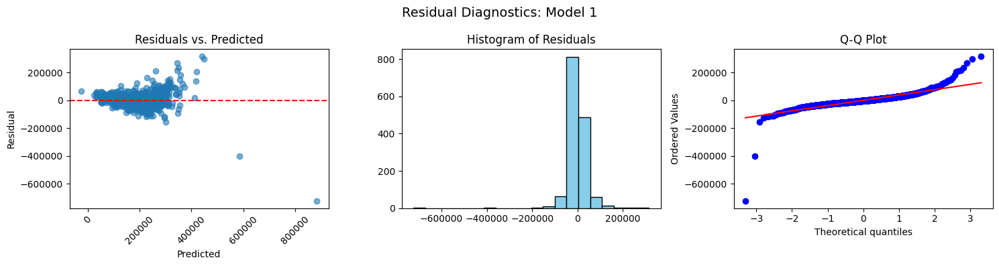

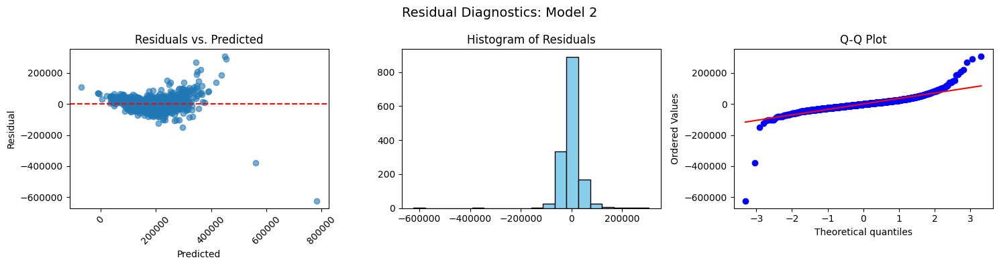

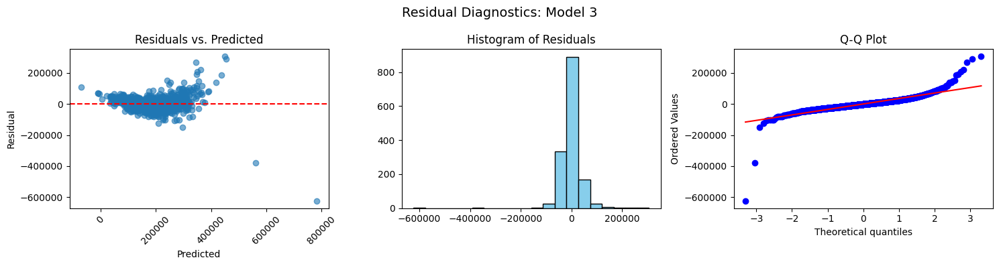

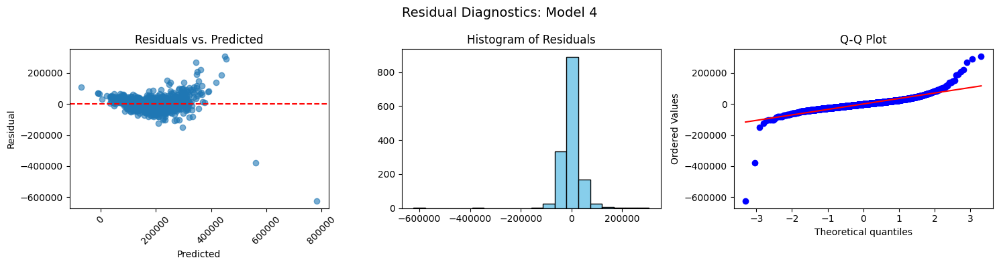

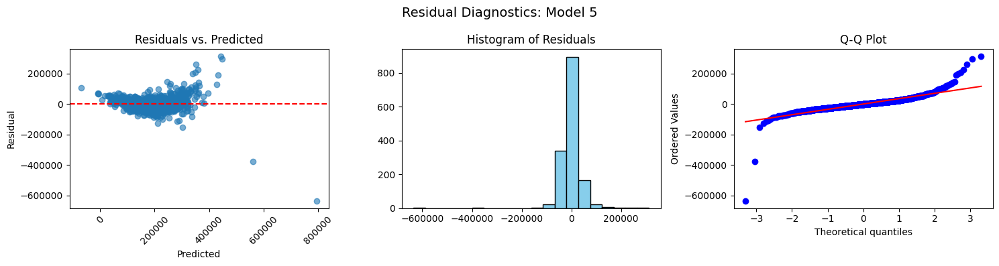

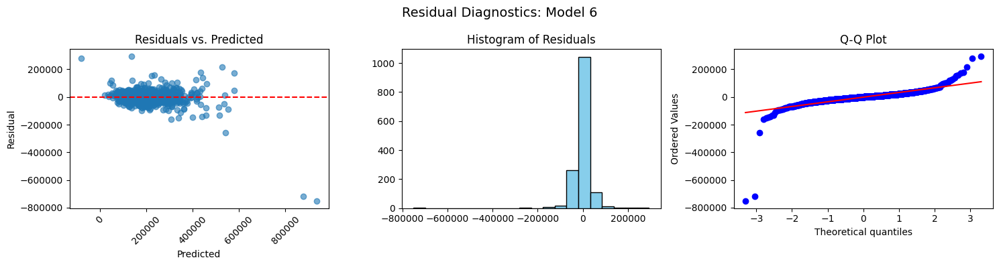

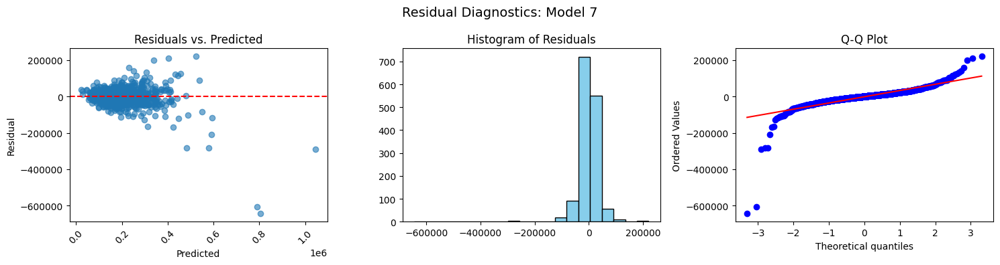

In [100]:
# plotting residual analysis


for model, metrics in all_metrics_dict.items():
      y_true = np.array(metrics['y_true'])
      y_pred = np.array(metrics['y_pred'])
      residuals = np.array(metrics['residuals'])

      fig, axs = plt.subplots(1, 3, figsize=(15, 4))
      fig.suptitle(f'Residual Diagnostics: {model}', fontsize=14)

      # Residuals vs Predictions
      axs[0].scatter(y_pred, residuals, alpha=0.6)
      axs[0].axhline(0, color='red', linestyle='--')
      axs[0].set_title('Residuals vs. Predicted')
      axs[0].set_xlabel('Predicted')
      axs[0].set_ylabel('Residual')
      # adjust axis rotate
      axs[0].tick_params(axis='x', labelrotation = 45)

      # Histogram
      axs[1].hist(residuals, bins=20, color='skyblue', edgecolor='black')
      axs[1].set_title('Histogram of Residuals')

      # Q-Q plot
      stats.probplot(residuals, dist="norm", plot=axs[2])
      axs[2].set_title('Q-Q Plot')

      plt.tight_layout()
      plt.show()

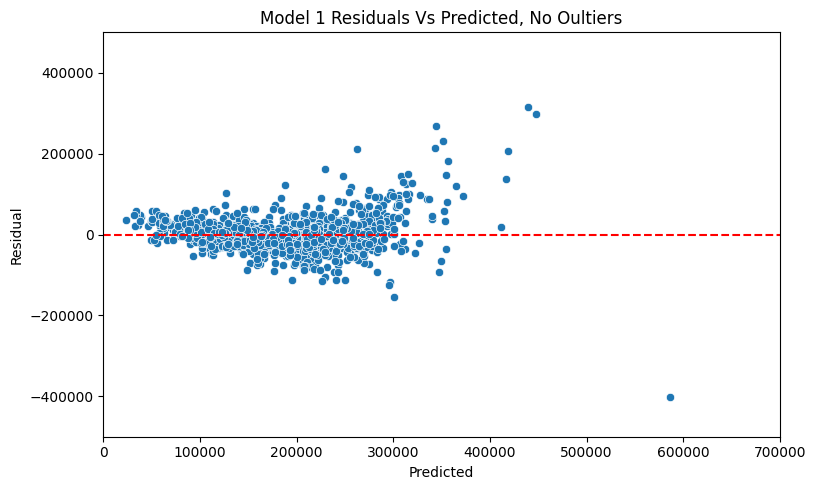

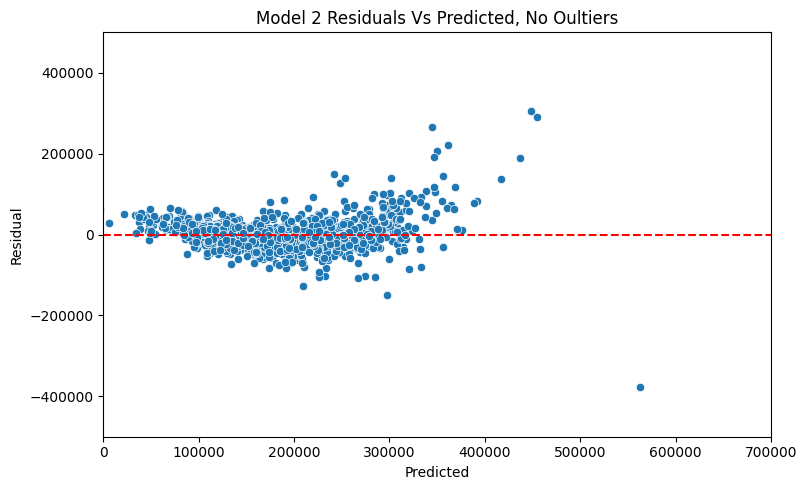

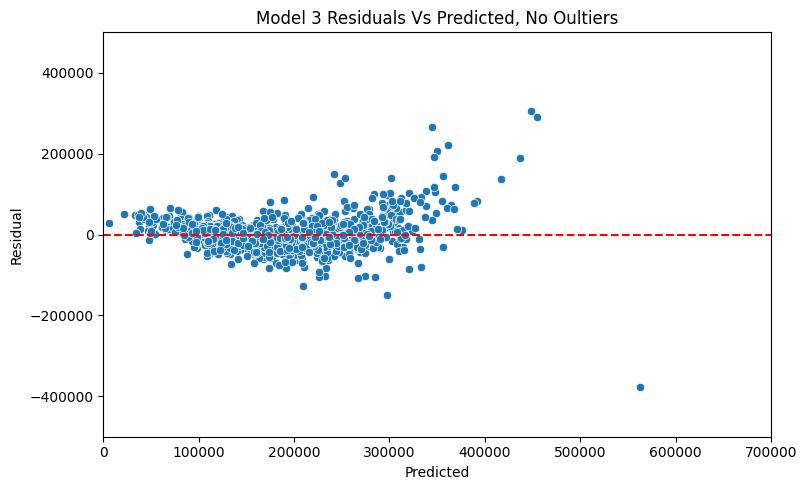

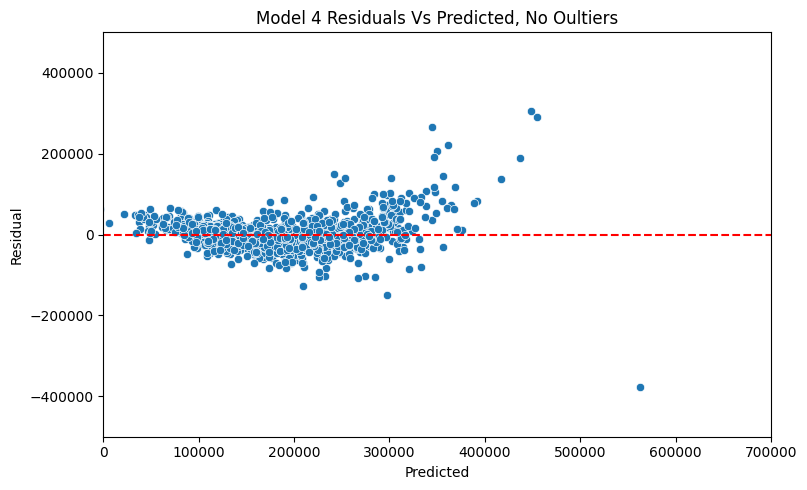

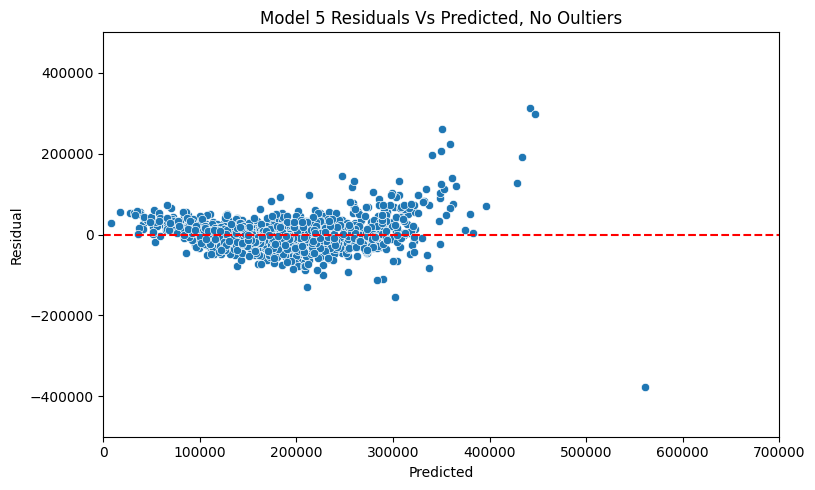

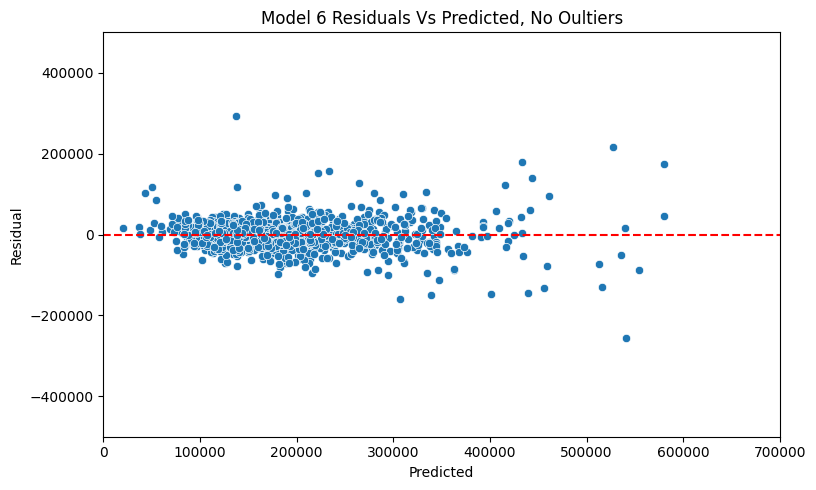

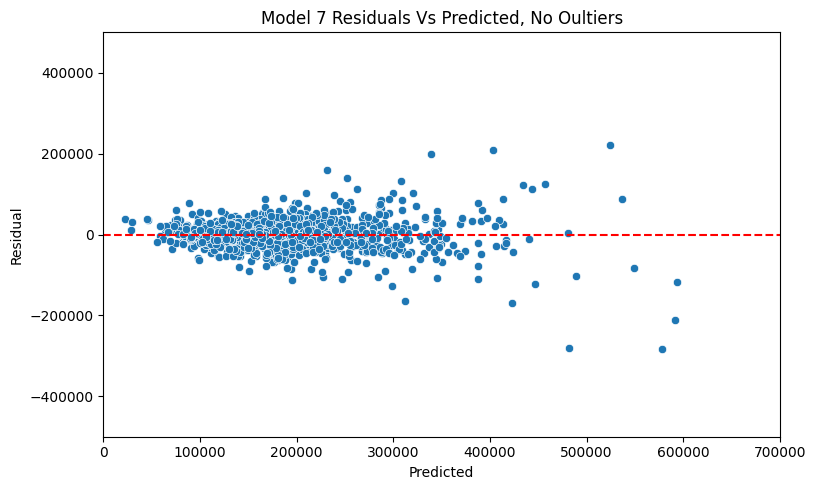

In [101]:
# taking another look at the scatterplots, adjsuted axes


for model, metrics in all_metrics_dict.items():
      # y_true = np.array(metrics['y_true'])
      y_pred = np.array(metrics['y_pred'])
      residuals = np.array(metrics['residuals'])

      plt.figure(figsize=(8, 5))
      sns.scatterplot(x=y_pred, y=residuals)
      plt.axhline(0, color='red', linestyle='--')
      plt.title(f'{model} Residuals Vs Predicted, No Oultiers')
      plt.ylabel("Residual")
      plt.xlabel('Predicted')
      plt.tight_layout()
      plt.ylim(-500000, 500000)
      plt.xlim(0, 700000)
      plt.show()

## Metrics Comparison Across Cross-Validation Folds

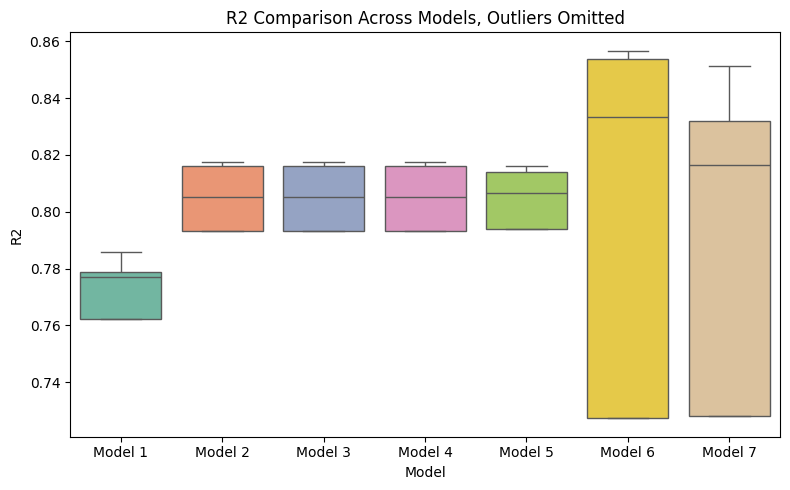

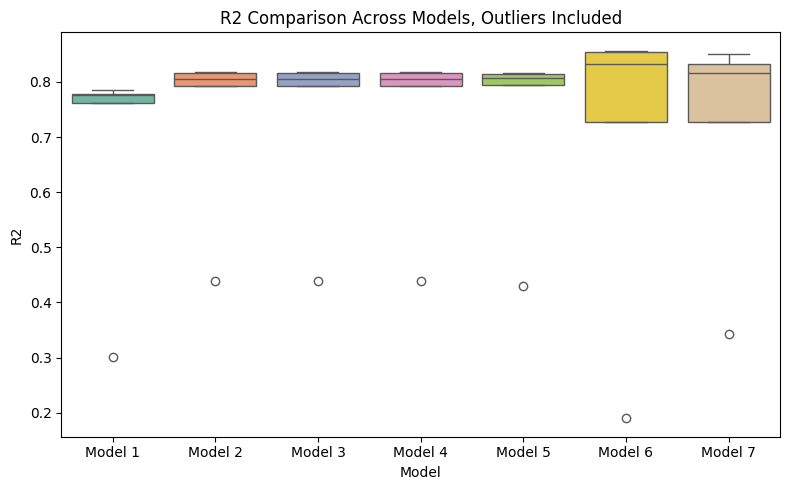

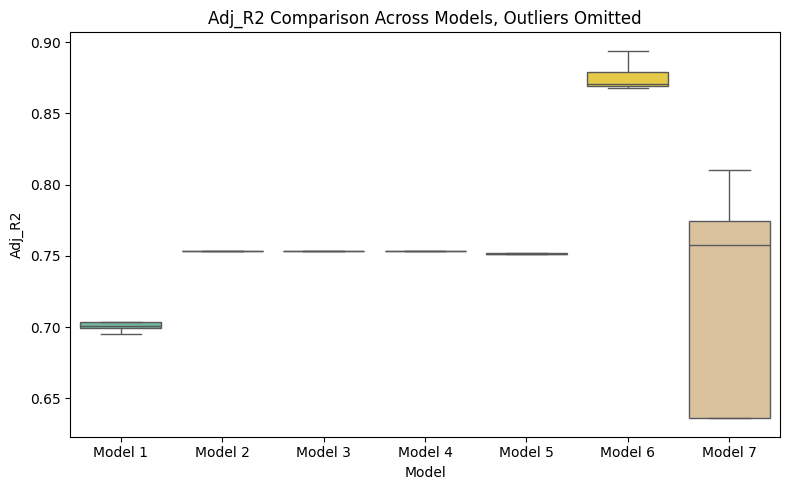

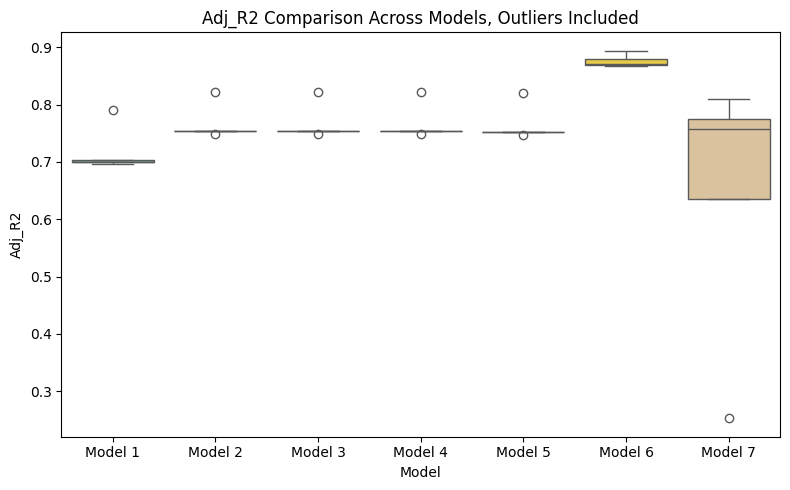

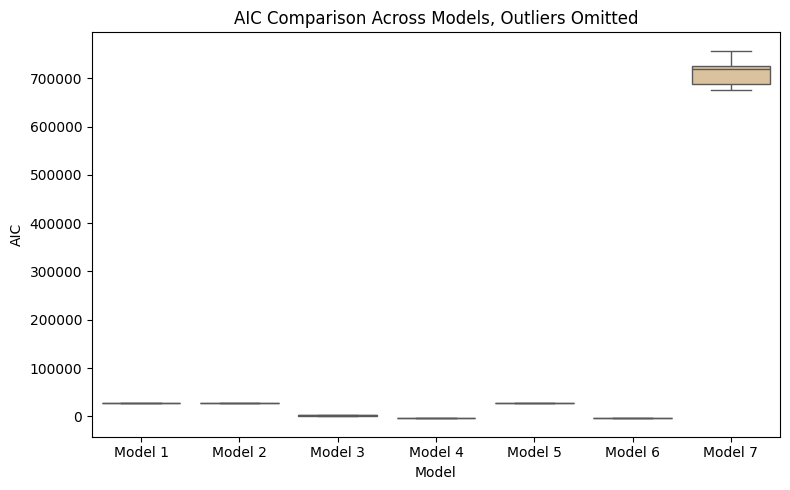

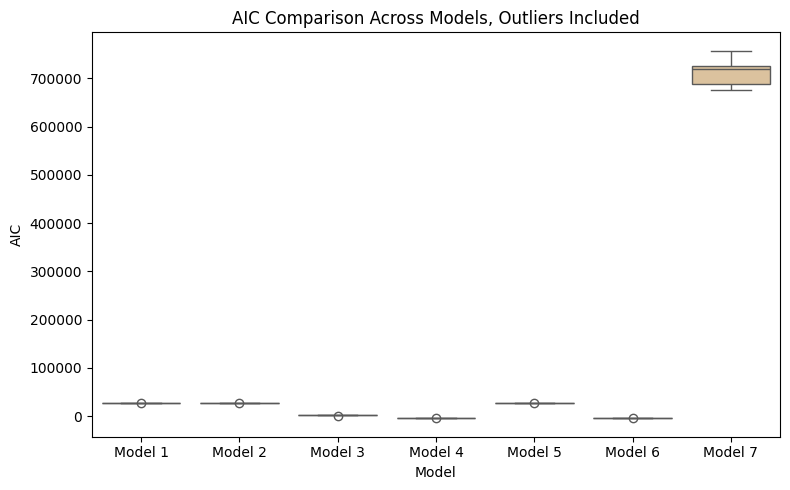

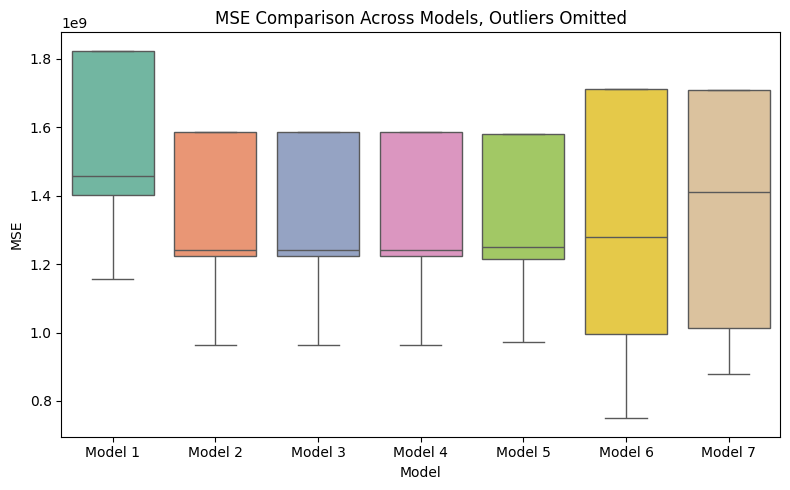

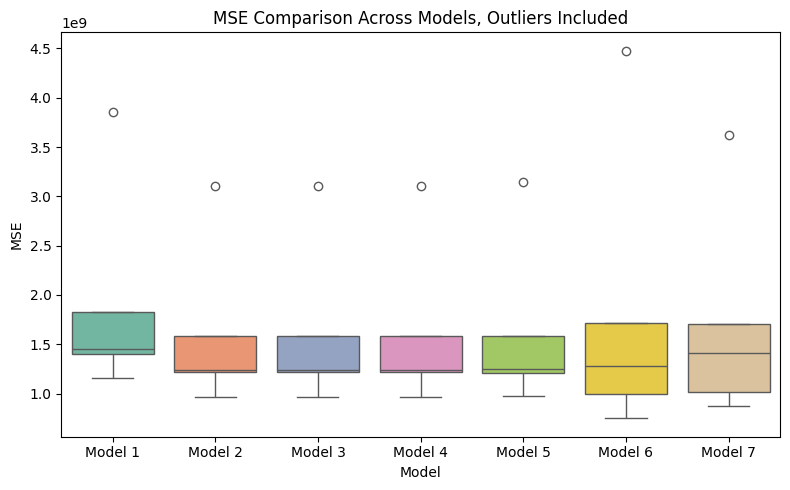

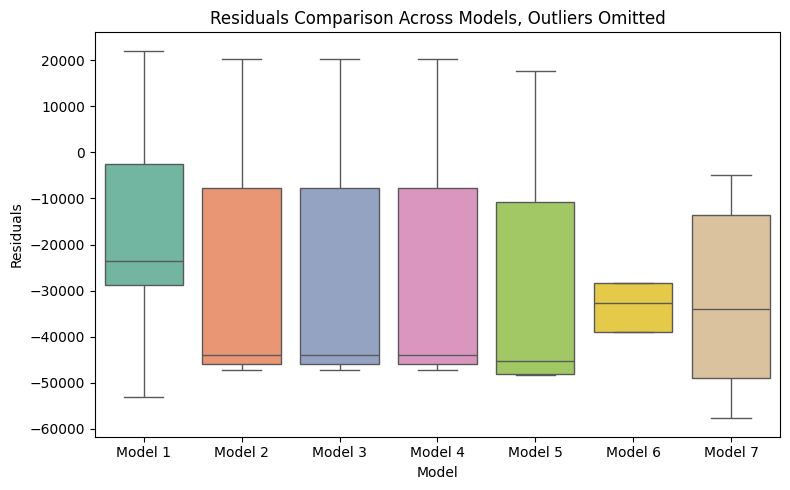

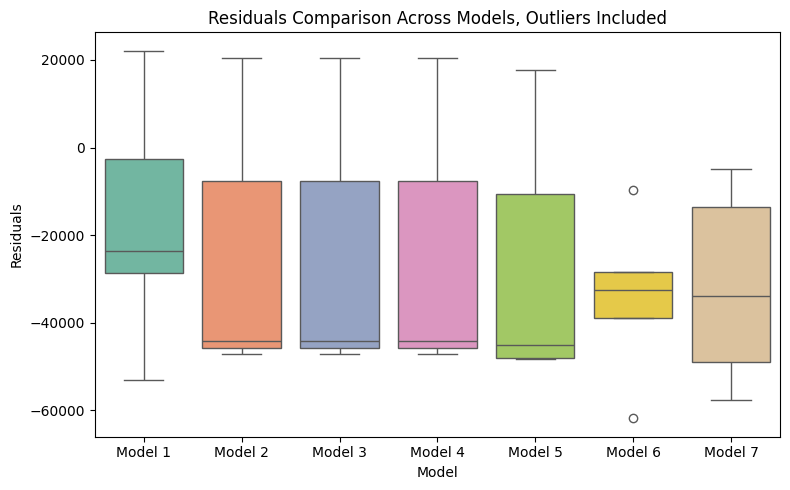

In [102]:
# Suppose this is your cross-validation metrics structure flattened:
# Replace this with your real data
records = []
for model, metrics in all_metrics_dict.items():  # all_metrics is your metrics dict
    for i in range(len(metrics['r2'])):
        records.append({
            'Model': model,
            'R2': metrics['r2'][i],
            'Adj_R2': metrics['adj_r2'][i],
            'AIC': metrics['aic'][i],
            'MSE': metrics['mse'][i],
            "Residuals": metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Models, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Models, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


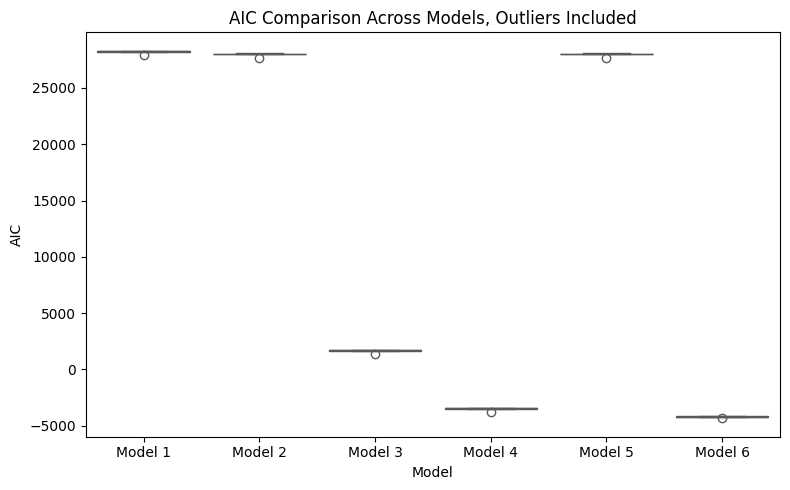

In [103]:
# a look at AIC just for model 1-6
view_1_6 = df_cv[df_cv["Model"]!="Model 7"]

plt.figure(figsize=(8, 5))
subset = view_1_6[view_1_6['Metric'] == "AIC"]
sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
plt.title(f'AIC Comparison Across Models, Outliers Included')
plt.ylabel("AIC")
plt.xlabel('Model')
plt.tight_layout()
plt.show()

# Chosing a model

The seven models tested ranged widely in their cross-validation metrics, and it's aevident that further work would be needed to confidently chose a model for predictions.

## R2 and Adjusted R2 Evaluation
While Model 7 (MinMax + GAM) had the greatest median R2 and the overall spread landed higher, the model also had the greatest outlying negative R2, indicating that model did not fit well across different folds of the dataset. While this could indicate that a specific fold had outlying data, it can also mean that the GAM model requires more attention to parameter tuning. Model 6 (Polynomial Regression) similarly had a high median R2 and outlying negative R2 values.

Model 2 (Linear Regression), Model 3 (Standard Scale + Regression), Model 4 (MinMax Scale + Regression), and Model 5 (Forward Selection + Linear Regression) had the next highest R2 values, a measure that the predictors reliably explain the output Y, and did not have any outlying values which could indicate poor fit.

The Adjusted R2 values followed similar trends as for R2, as mentioned above.

## AIC Evaluation
The AIC for Model 4 (Linear Regression + MinMax Scaling) had the lowest spread of AIC values, followed by Model 3 (Linear Regression + Standard Scaling). This could be attributed to the scaling measures, which reduced instability caused by features on different numeric scales. These models differed from Model 1 only by scaling, so it is possible that scaling is a necessary transformation over this dataset, given the dramatic difference in AIC.

## MSE Evaluation
Model 2, 3, 4  and Model 5 nearly tied for the lowest median MSE value. While Model 6 and 7 had lower 25th quartile MSE values, these models also had the widest spread into the positive values.  Models 2 through 5 better fit the data across folds, and gives evidence that the models neither underfit or overfit given unseen data.

# Residual Plot Analysis and Boxplot Evaluation
All residual scatterplots indicate some pattern which casts doubt on the ability to ensure model assumptions are met. In evaluating the scatterplots with outliers omitted, Model 6 (Polynomial Regression) had the most patternless scatterplot. The points clustered around 0 with no shape, indicating less heteroscadacity or variance among residuals, giving more reliability to regression analysis. Model 7 (GAM) scatterplot looks similar, but suffered more extreme outliers when the full set of residuals are included.

The majority of the models held a cone-like shape, indicating that there is non-constant variance among errors and so less confidence can be given to standard errors and conclusions about the model fit. These models potentially may benefit from require another layer of transformation, or a weighted regression fit.

The boxplots are anotherway to visualize the variance in residuals, where model 6 and 7 have less spread and median residual values closer to 0 than the remaining models.

# Next Steps
While no one model excells at all metrics atttempted, models 2 through 5 showed the most balance in measures of fit. Before running the final model through the test set, the Y values for these four models will be Log transformed to address funnel shaped residuals.

## Log Transformed Model 2

In [104]:
# Original residuals show funnel
X2 = df_features[['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']]
y2 = df_features['SalePrice']
X2_const = add_constant(X2)

# Log-transform Y
y_2_log = np.log(y2)

# Refit
model_log_2 = sm.OLS(y_2_log, X2_const).fit()
model_log_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     1004.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:06:48   Log-Likelihood:                 464.69
No. Observations:                1460   AIC:                            -915.4
Df Residuals:                    1453   BIC:                            -878.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            4.5760      0.539      8.492      0.000       3.519       5.633
TotalBsmtSF      0.0001   1.31e-05     10.323      0.000       0.000       0.000
GrLivArea        0.0002   1.28e-05     15.519      0.000       0.000       0.000
FullBath         0.0245      0.012      2.101      0.036       0.002       0.047
GarageArea       0.0003   2.76e-05     11.424      0.000       0.000       0.000
OverallQual      0.1100      0.005     20.977      0.000       0.100       0.120
YearRemodAdd     0.0031      0.000     11.122      0.000       0.003       0.004
==============================================================================
Omnibus:                     1012.245   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44850.205
Skew:                          -2.669   Prob(JB):                         0.00
Kurtosis:                      29.623   Cond. No.                     3.25e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.25e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [105]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X2):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X2.iloc[train_idx] if hasattr(X2, 'iloc') else X2[train_idx]
    X_test = X2.iloc[test_idx] if hasattr(X2, 'iloc') else X2[test_idx]
    y_train = np.log(y2[train_idx])
    y_test = np.log(y2[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [106]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_2_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_2_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : -0.0908
mse       : 6131036804.4413
rmse      : 57111.7119
mae       : 22862.3458
y_true    : 180921.1959
y_pred    : 179663.1594
residuals : 1258.0365
adj_r2    : 0.8063
aic       : -748.1339


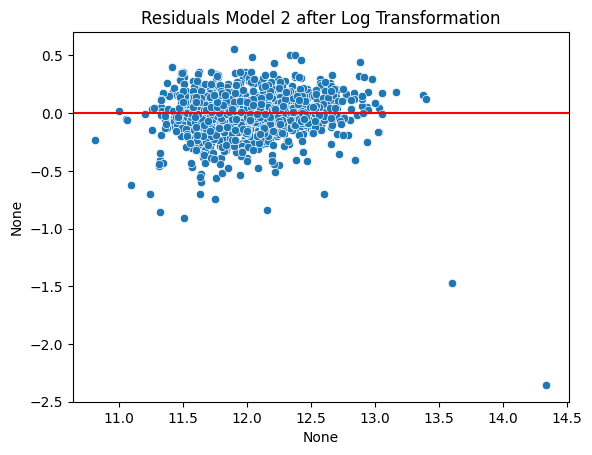

In [107]:
residuals_log = model_log_2.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_2.fittedvalues, y=residuals_log)
plt.title("Residuals Model 2 after Log Transformation")
plt.axhline(0, color='red')

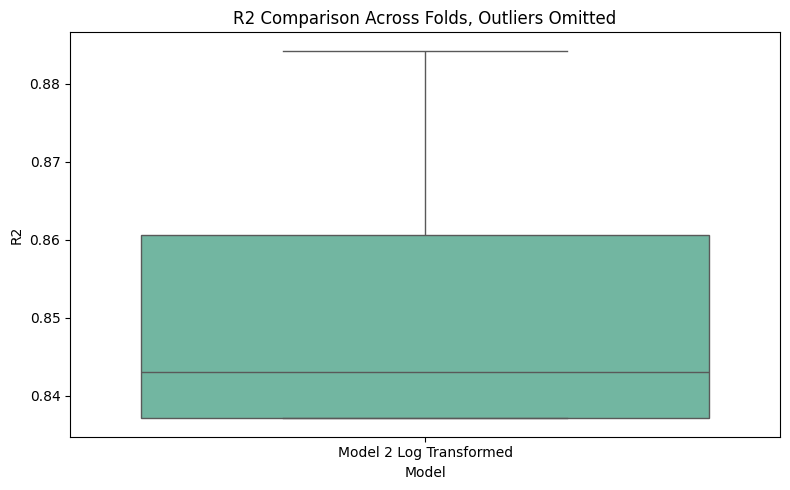

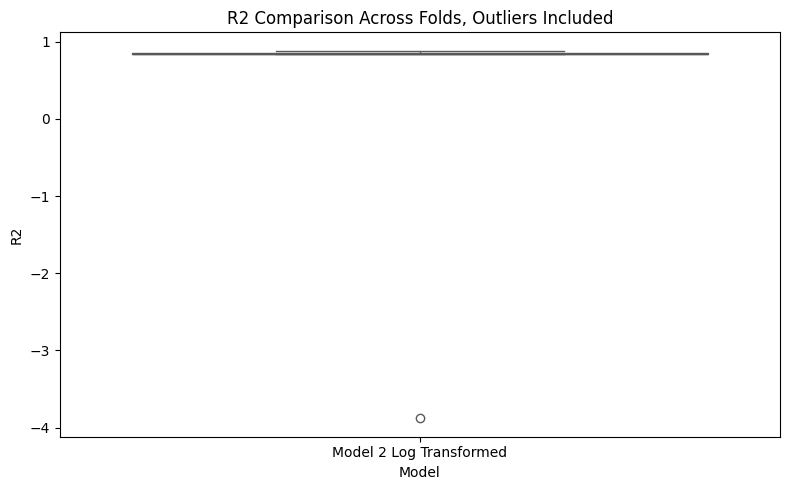

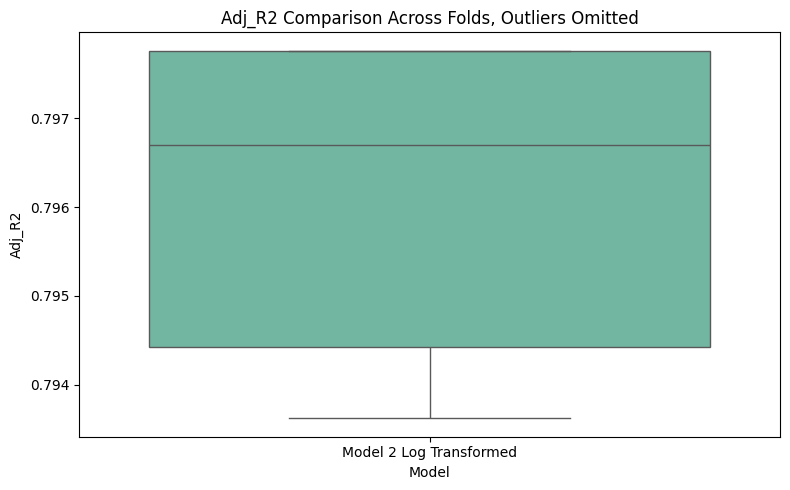

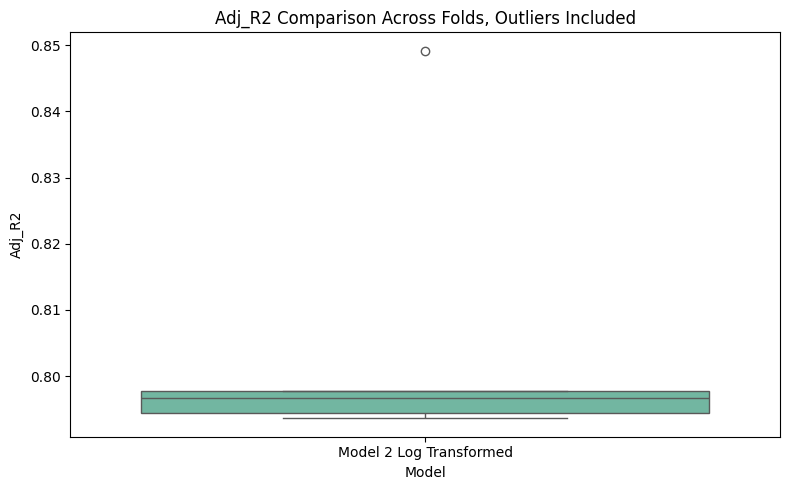

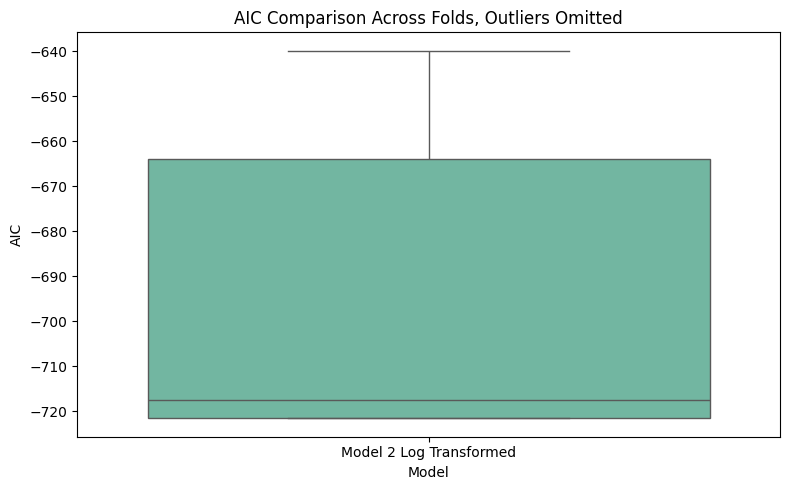

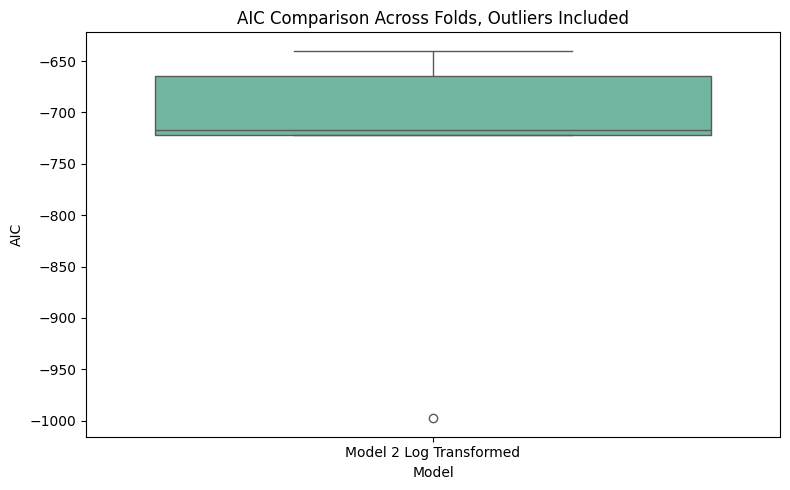

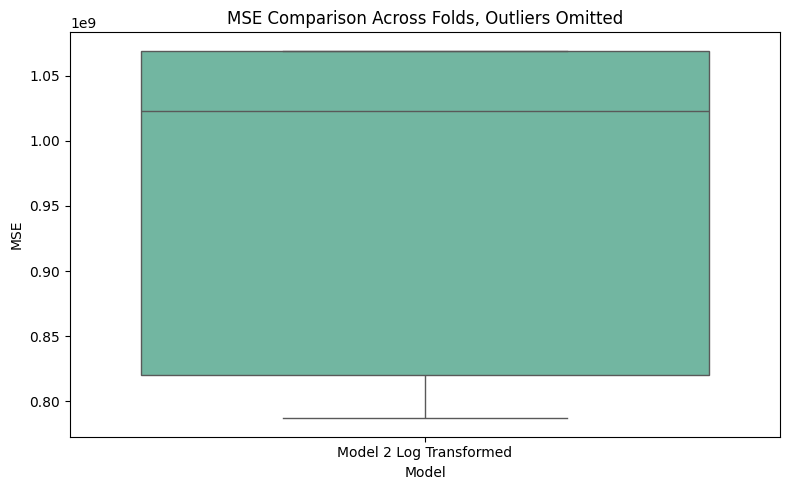

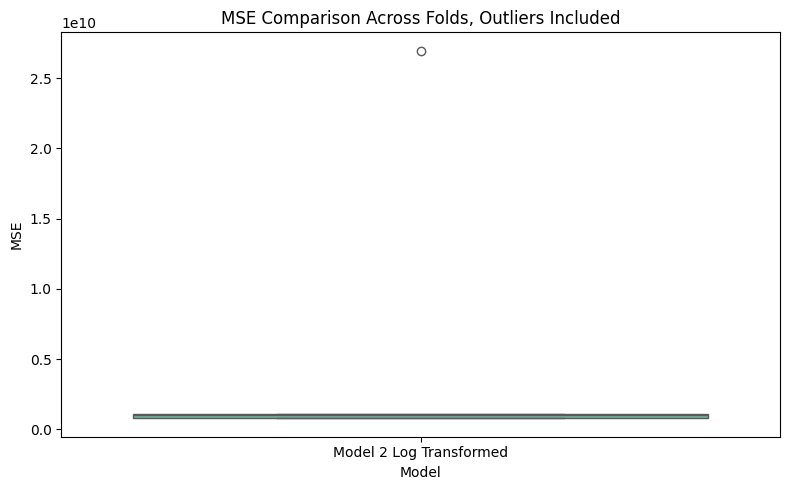

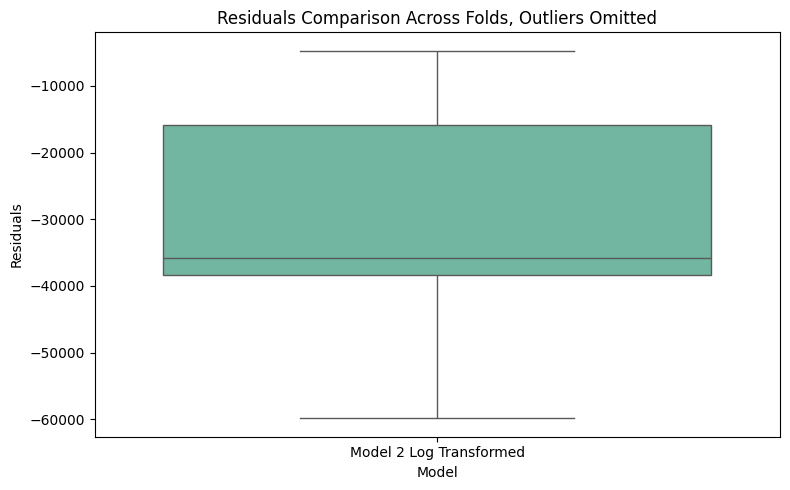

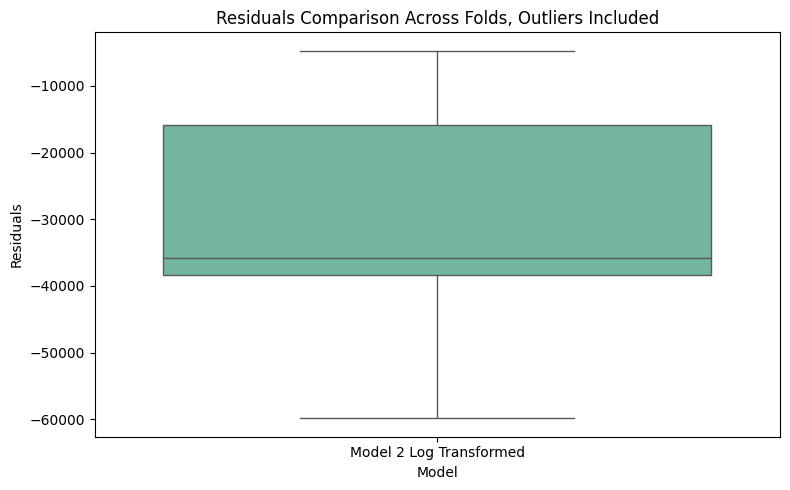

In [108]:
records = []
for i in range(len(model_2_log_metrics['r2'])):
        records.append({
            'Model': 'Model 2 Log Transformed',
            'R2': model_2_log_metrics['r2'][i],
            'Adj_R2': model_2_log_metrics['adj_r2'][i],
            'AIC': model_2_log_metrics['aic'][i],
            'MSE': model_2_log_metrics['mse'][i],
            "Residuals": model_2_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Log Transformed Model 3

In [109]:
X3_scaler = StandardScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X3 = pd.DataFrame(X3_scaler.fit_transform(df_features[columns]), columns=columns)
X3_const = add_constant(X3)

# Log-transform Y
y3 = df_features['SalePrice']
y_3_log = np.log(y3)

# Refit
model_log_3 = sm.OLS(y_3_log, X3_const).fit()
model_log_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     1004.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:06:51   Log-Likelihood:                 464.69
No. Observations:                1460   AIC:                            -915.4
Df Residuals:                    1453   BIC:                            -878.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           12.0241      0.005   2604.036      0.000      12.015      12.033
TotalBsmtSF      0.0595      0.006     10.323      0.000       0.048       0.071
GrLivArea        0.1042      0.007     15.519      0.000       0.091       0.117
FullBath         0.0135      0.006      2.101      0.036       0.001       0.026
GarageArea       0.0674      0.006     11.424      0.000       0.056       0.079
OverallQual      0.1520      0.007     20.977      0.000       0.138       0.166
YearRemodAdd     0.0639      0.006     11.122      0.000       0.053       0.075
==============================================================================
Omnibus:                     1012.245   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44850.205
Skew:                          -2.669   Prob(JB):                         0.00
Kurtosis:                      29.623   Cond. No.                         3.41
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [110]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X3):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X3.iloc[train_idx] if hasattr(X3, 'iloc') else X3[train_idx]
    X_test = X3.iloc[test_idx] if hasattr(X3, 'iloc') else X3[test_idx]
    y_train = np.log(y3[train_idx])
    y_test = np.log(y3[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [111]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_3_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_3_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : -0.0908
mse       : 6131036804.4408
rmse      : 57111.7119
mae       : 22862.3458
y_true    : 180921.1959
y_pred    : 179663.1594
residuals : 1258.0365
adj_r2    : 0.8063
aic       : -748.1339


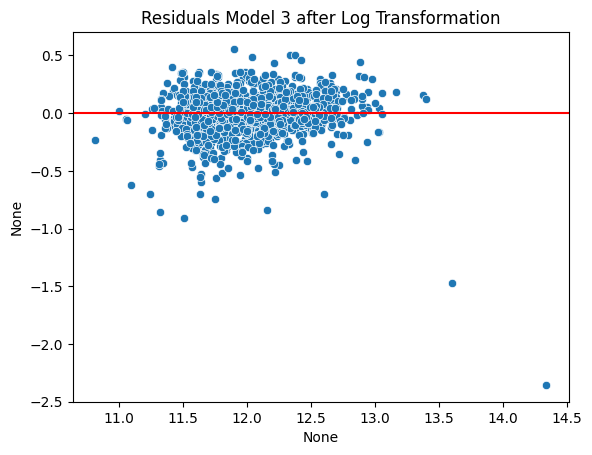

In [112]:
residuals_log = model_log_3.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_3.fittedvalues, y=residuals_log)
plt.title("Residuals Model 3 after Log Transformation")
plt.axhline(0, color='red')

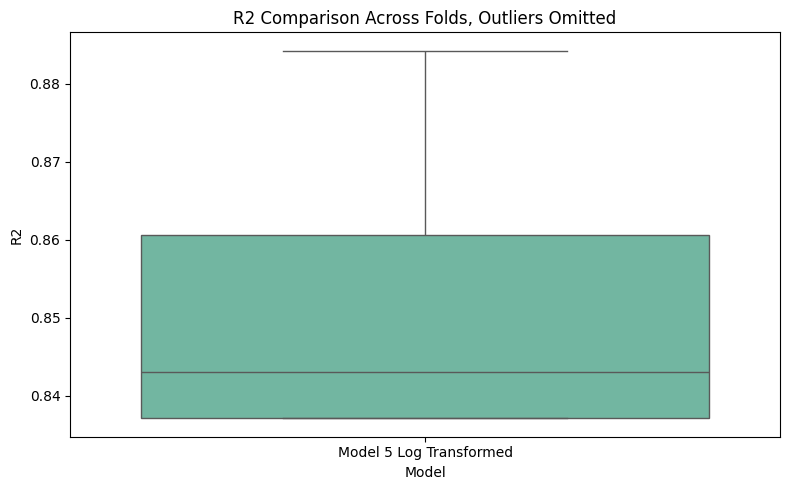

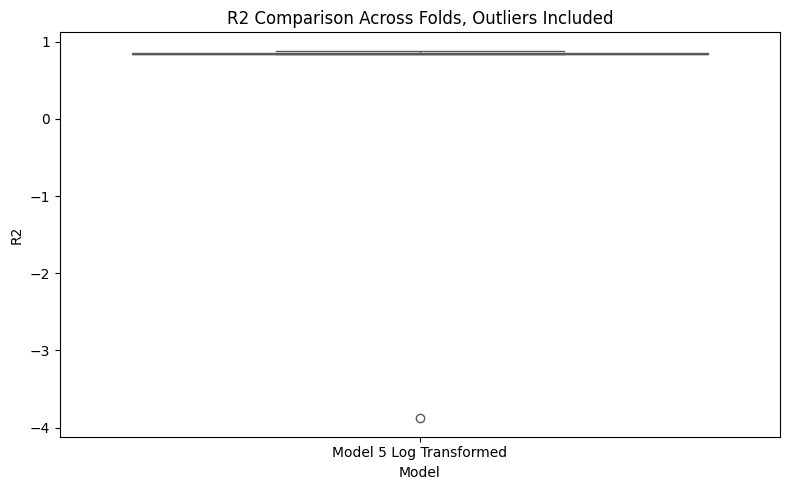

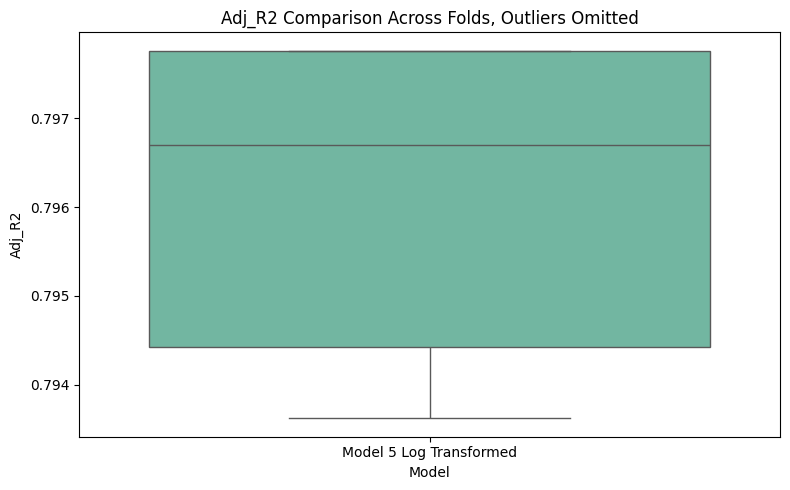

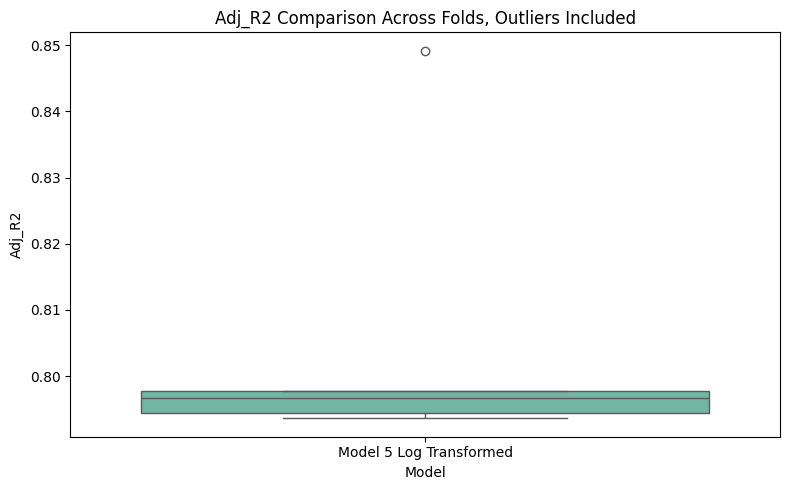

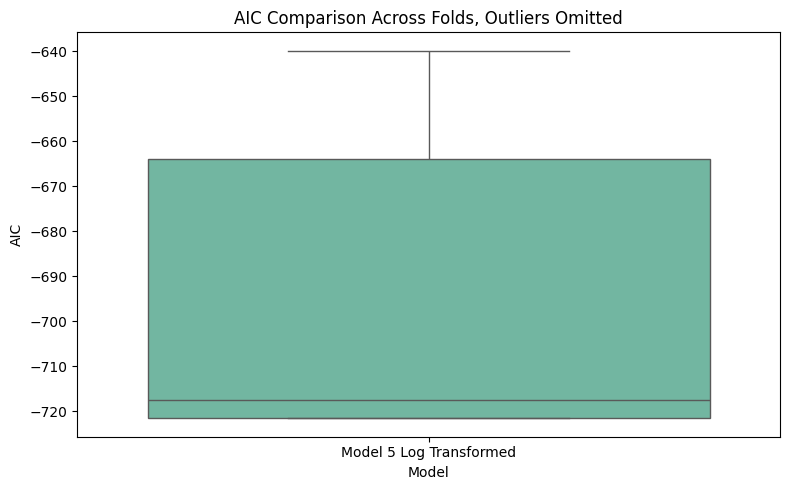

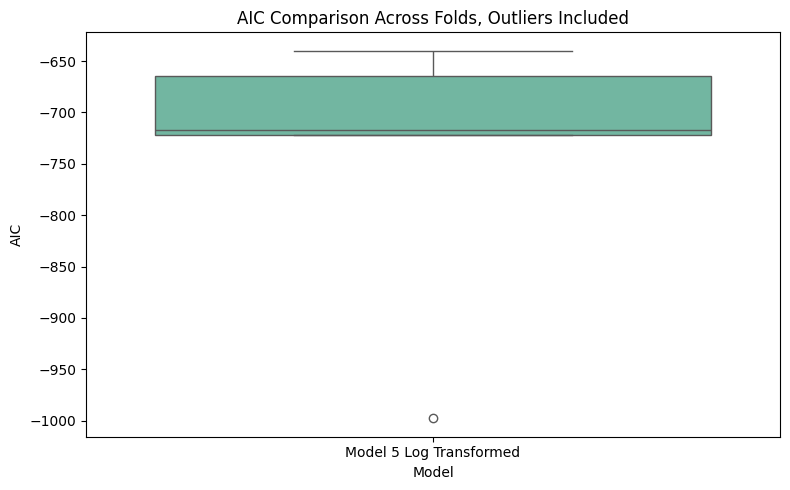

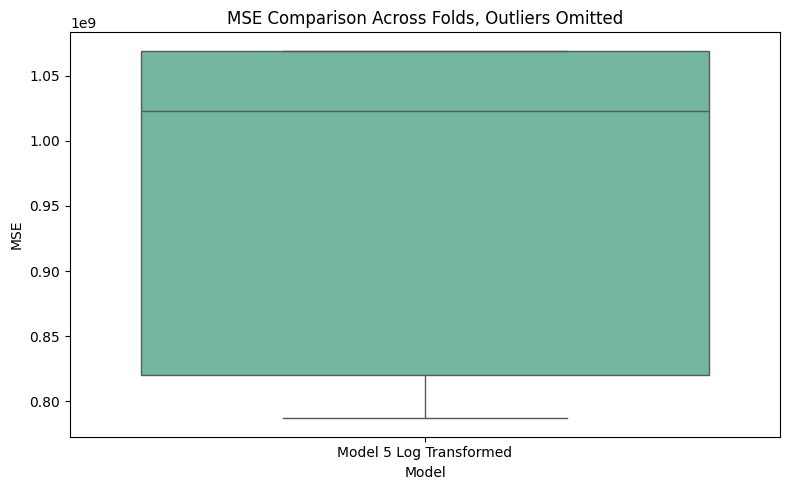

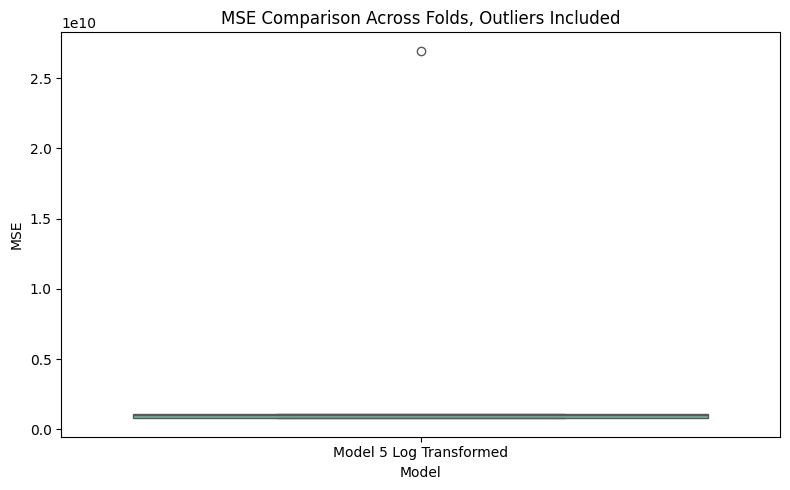

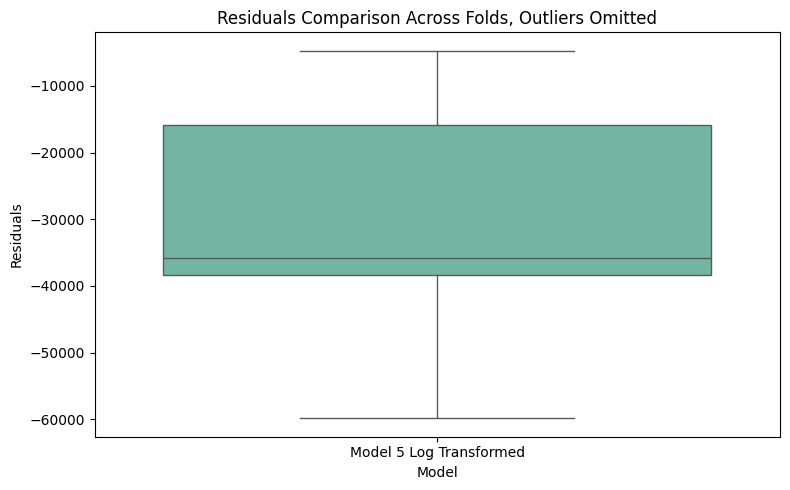

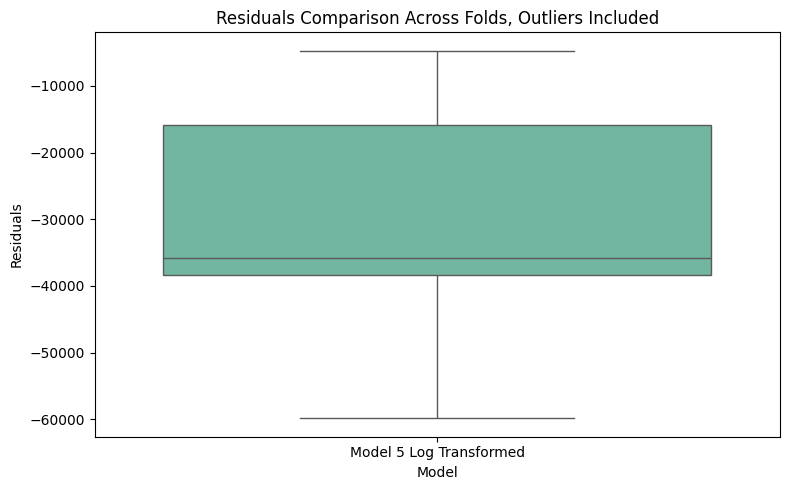

In [113]:
# replotting our boxplots for log transformed Model 5
records = []
for i in range(len(model_3_log_metrics['r2'])):
        records.append({
            'Model': 'Model 5 Log Transformed',
            'R2': model_3_log_metrics['r2'][i],
            'Adj_R2': model_3_log_metrics['adj_r2'][i],
            'AIC': model_3_log_metrics['aic'][i],
            'MSE': model_3_log_metrics['mse'][i],
            "Residuals": model_3_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Log Transformed Model 4

In [114]:
min_max_x_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X4 = pd.DataFrame(min_max_x_scaler.fit_transform(df_features[columns]), columns=columns)
X4_const = add_constant(X4)

# Log-transform Y\
y4 = df_features['SalePrice']
y_4_log = np.log(y4)

# Refit
model_log_4 = sm.OLS(y_4_log, X4_const).fit()
model_log_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     1004.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:06:53   Log-Likelihood:                 464.69
No. Observations:                1460   AIC:                            -915.4
Df Residuals:                    1453   BIC:                            -878.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           10.7900      0.019    574.911      0.000      10.753      10.827
TotalBsmtSF      0.8290      0.080     10.323      0.000       0.671       0.987
GrLivArea        1.0528      0.068     15.519      0.000       0.920       1.186
FullBath         0.0735      0.035      2.101      0.036       0.005       0.142
GarageArea       0.4474      0.039     11.424      0.000       0.371       0.524
OverallQual      0.9896      0.047     20.977      0.000       0.897       1.082
YearRemodAdd     0.1858      0.017     11.122      0.000       0.153       0.219
==============================================================================
Omnibus:                     1012.245   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44850.205
Skew:                          -2.669   Prob(JB):                         0.00
Kurtosis:                      29.623   Cond. No.                         26.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [115]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X4):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X4.iloc[train_idx] if hasattr(X4, 'iloc') else X4[train_idx]
    X_test = X4.iloc[test_idx] if hasattr(X4, 'iloc') else X4[test_idx]
    y_train = np.log(y4[train_idx])
    y_test = np.log(y4[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [116]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_4_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_4_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : -0.0908
mse       : 6131036804.4409
rmse      : 57111.7119
mae       : 22862.3458
y_true    : 180921.1959
y_pred    : 179663.1594
residuals : 1258.0365
adj_r2    : 0.8063
aic       : -748.1339


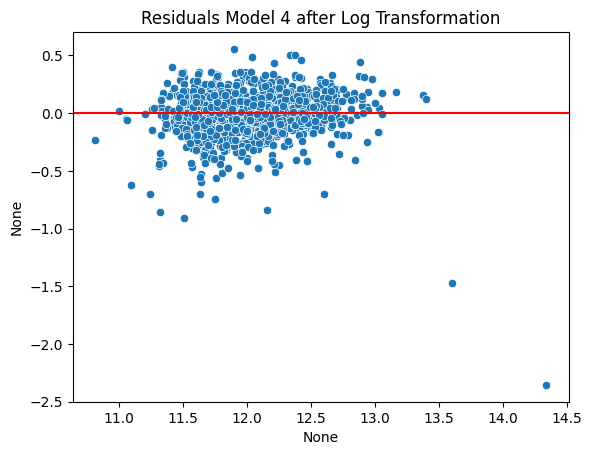

In [117]:
residuals_log = model_log_4.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_4.fittedvalues, y=residuals_log)
plt.title("Residuals Model 4 after Log Transformation")
plt.axhline(0, color='red')

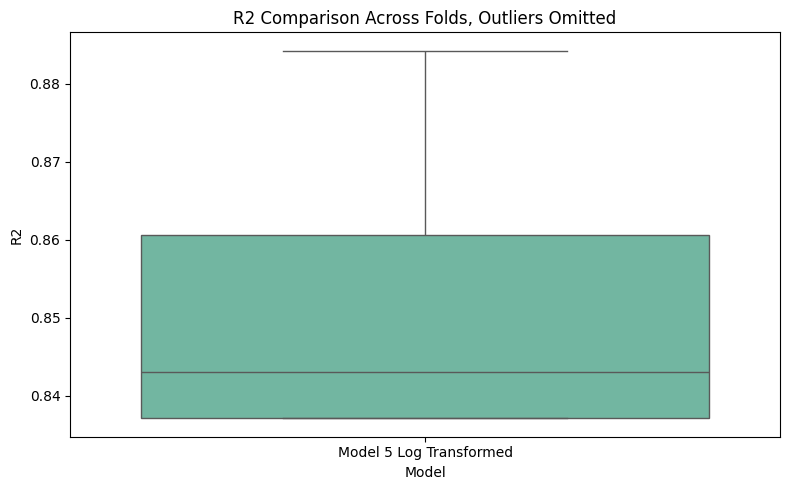

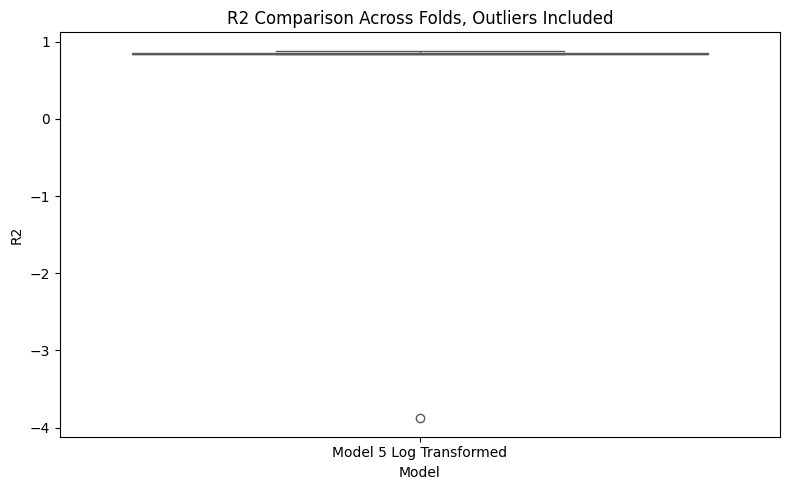

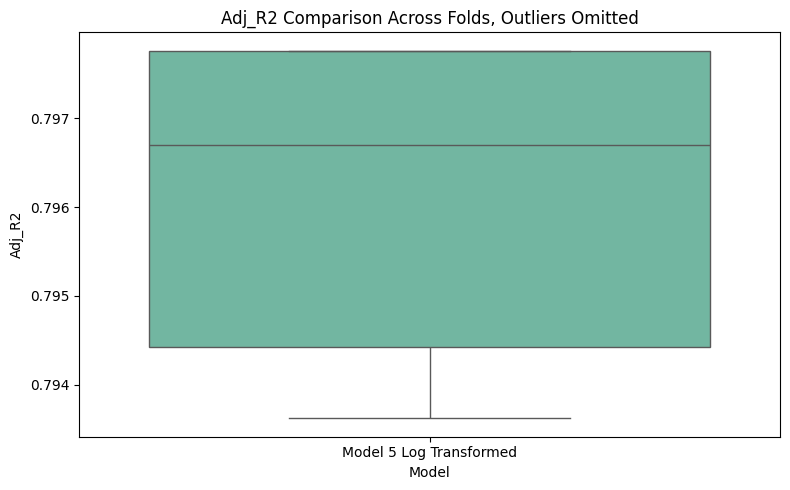

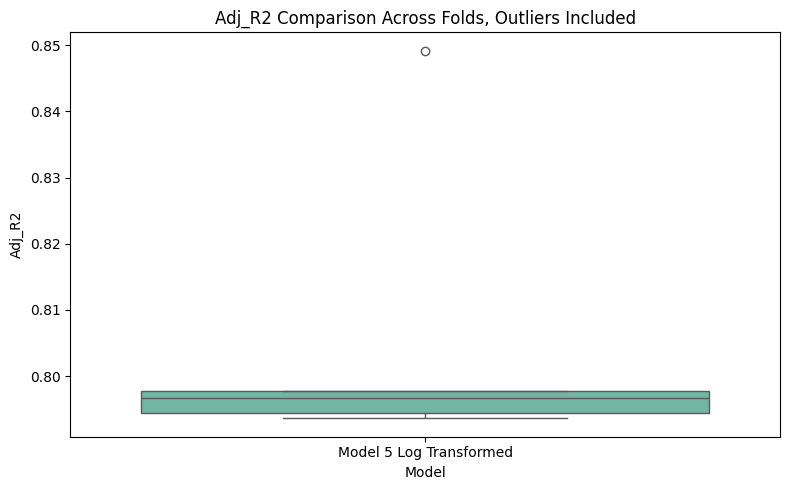

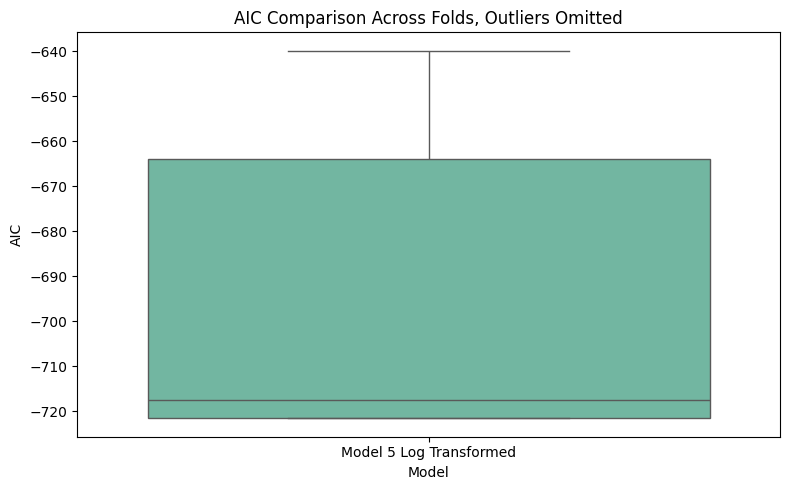

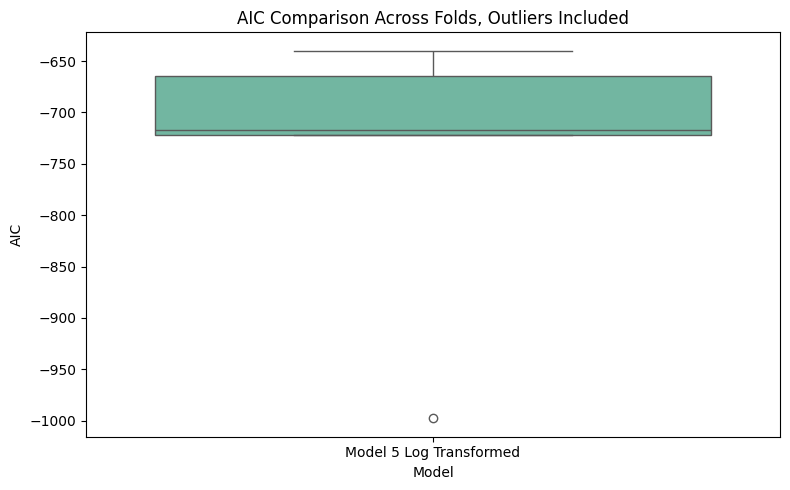

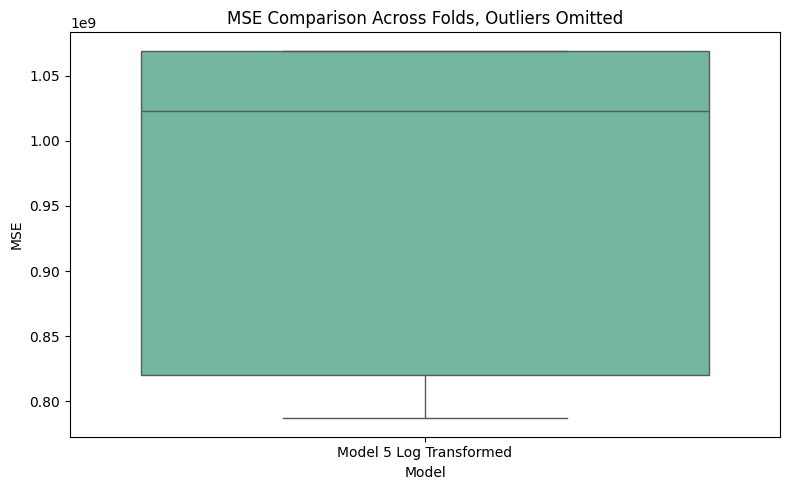

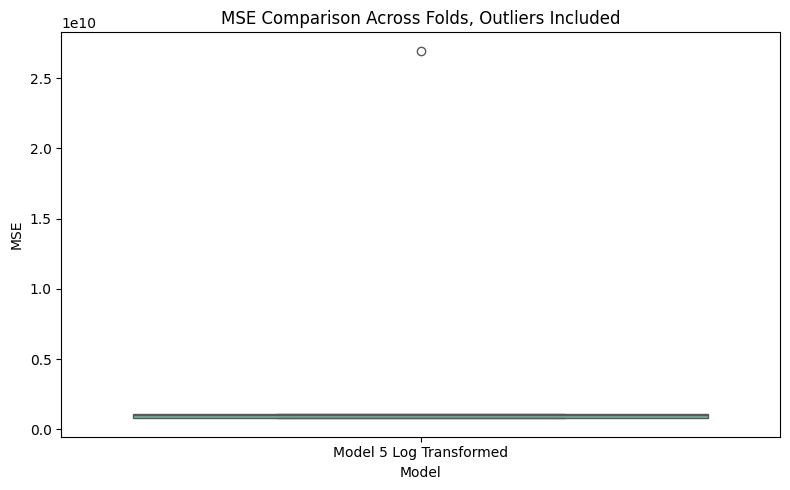

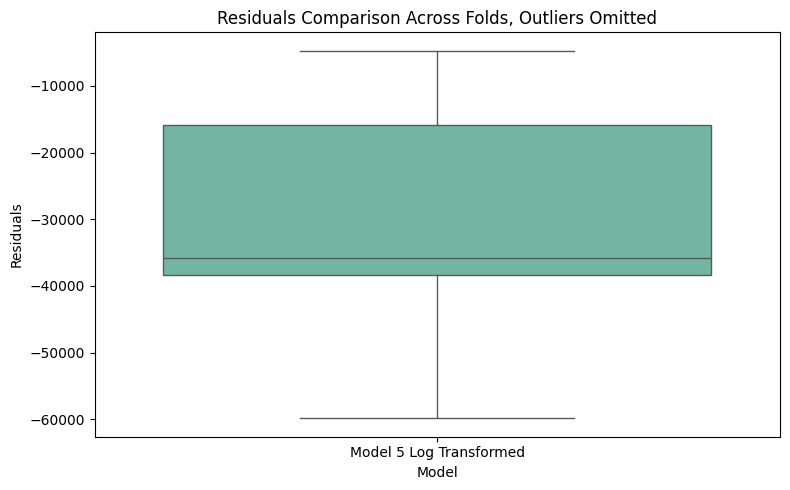

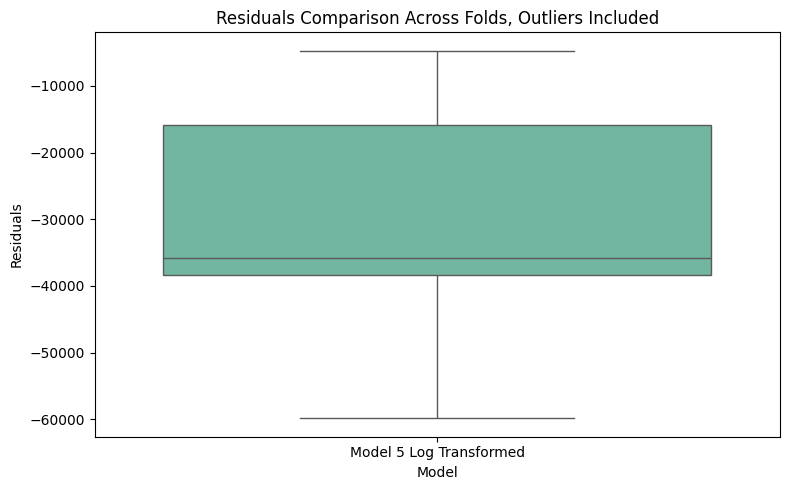

In [118]:
# replotting our boxplots for log transformed Model 5
records = []
for i in range(len(model_4_log_metrics['r2'])):
        records.append({
            'Model': 'Model 5 Log Transformed',
            'R2': model_4_log_metrics['r2'][i],
            'Adj_R2': model_4_log_metrics['adj_r2'][i],
            'AIC': model_4_log_metrics['aic'][i],
            'MSE': model_4_log_metrics['mse'][i],
            "Residuals": model_4_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Log Transformed Model 5

In [119]:
# model with selected features
X5 = df_features[feat_names]
y5 = df_features['SalePrice']
X5_const = add_constant(X5)

# Log-transform Y
y_5_log = np.log(y5)

# Refit
model_log_5 = sm.OLS(y_5_log, X5_const).fit()
model_log_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.803
Method:                 Least Squares   F-statistic:                     1489.
Date:                Sun, 13 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:06:56   Log-Likelihood:                 456.95
No. Observations:                1460   AIC:                            -903.9
Df Residuals:                    1455   BIC:                            -877.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            4.4124      0.525      8.403      0.000       3.382       5.442
GarageArea       0.0003   2.77e-05     11.013      0.000       0.000       0.000
OverallQual      0.1120      0.005     21.470      0.000       0.102       0.122
YearRemodAdd     0.0032      0.000     11.752      0.000       0.003       0.004
TotalSqFeet      0.0002   7.99e-06     22.486      0.000       0.000       0.000
==============================================================================
Omnibus:                     1095.668   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            62479.145
Skew:                          -2.933   Prob(JB):                         0.00
Kurtosis:                      34.506   Cond. No.                     3.79e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.79e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [120]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X5):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X5.iloc[train_idx] if hasattr(X5, 'iloc') else X5[train_idx]
    X_test = X5.iloc[test_idx] if hasattr(X5, 'iloc') else X5[test_idx]
    y_train = np.log(y5[train_idx])
    y_test = np.log(y5[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [121]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_5_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_5_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : -0.3192
mse       : 7394934284.1595
rmse      : 60823.3581
mae       : 23064.9877
y_true    : 180921.1959
y_pred    : 179834.8729
residuals : 1086.3230
adj_r2    : 0.8046
aic       : -740.3677


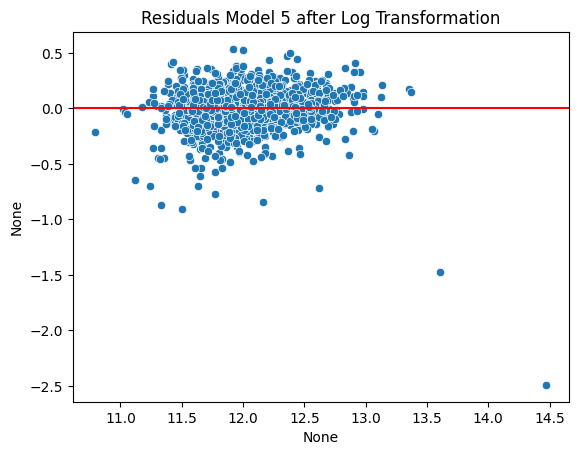

In [122]:
residuals_log = model_log_5.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_5.fittedvalues, y=residuals_log)
plt.title("Residuals Model 5 after Log Transformation")
plt.axhline(0, color='red')

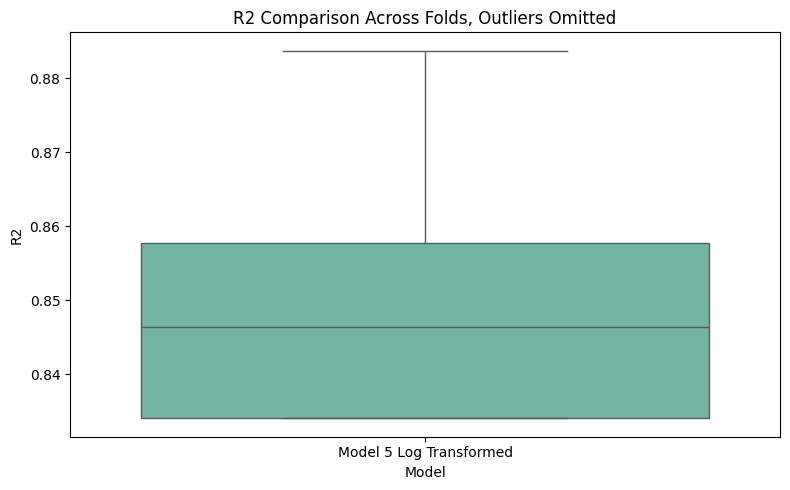

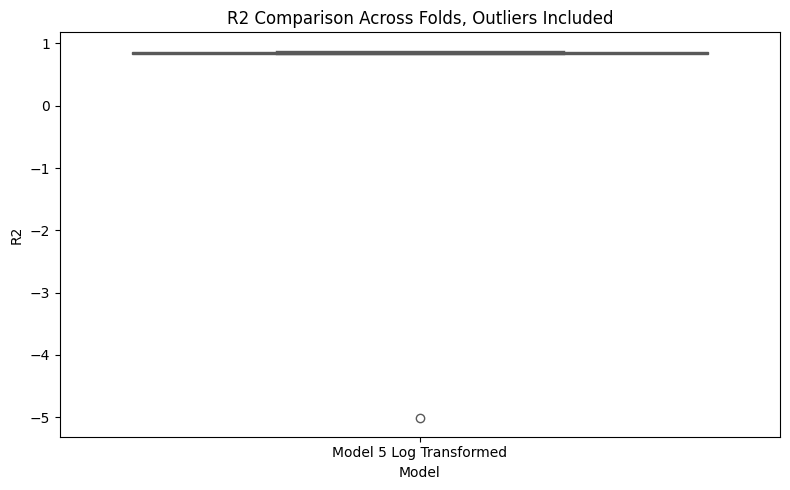

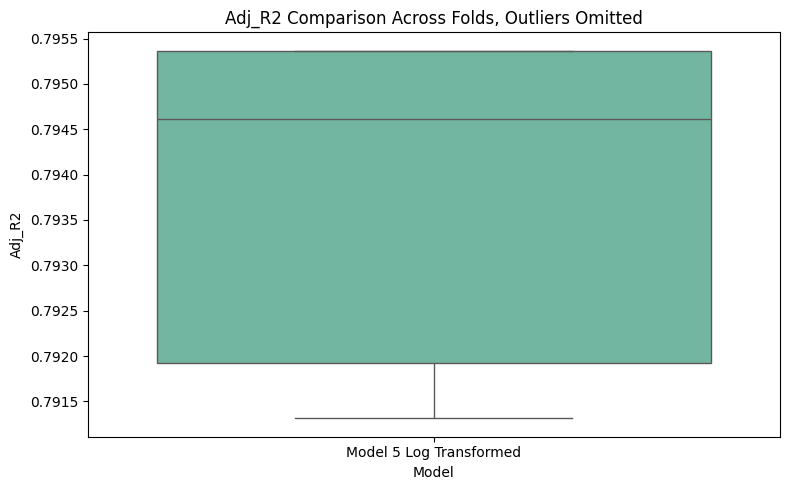

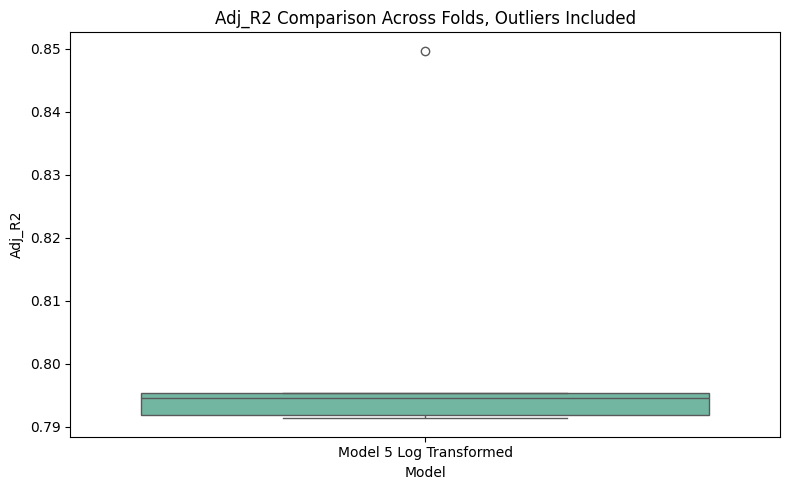

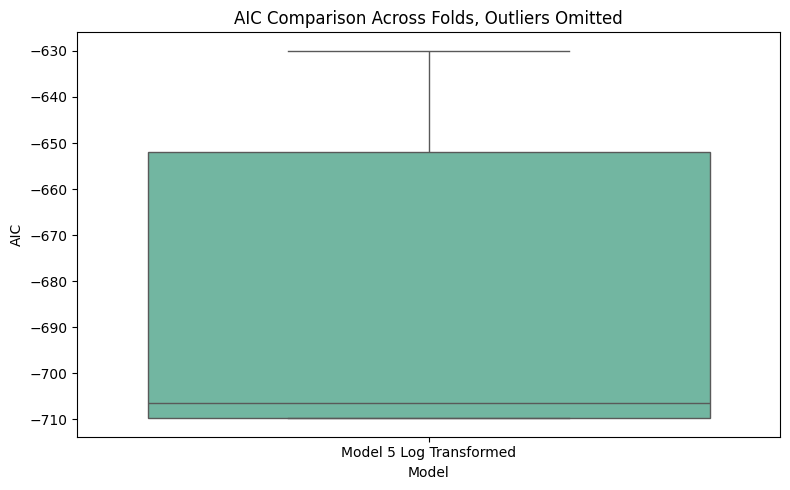

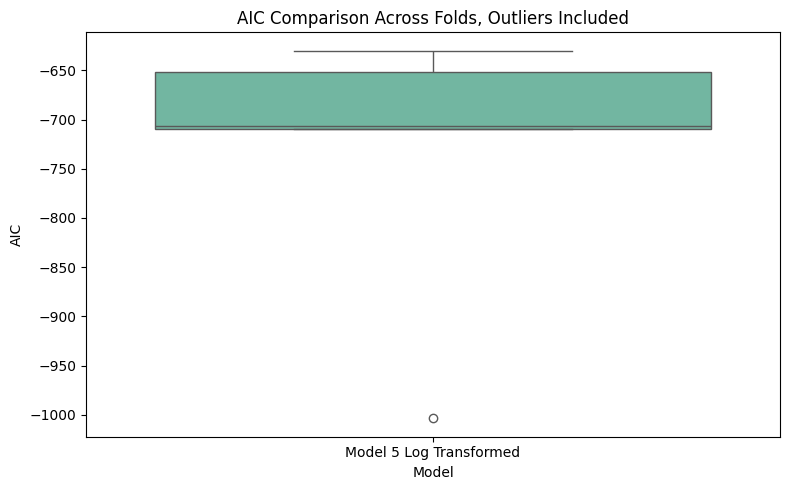

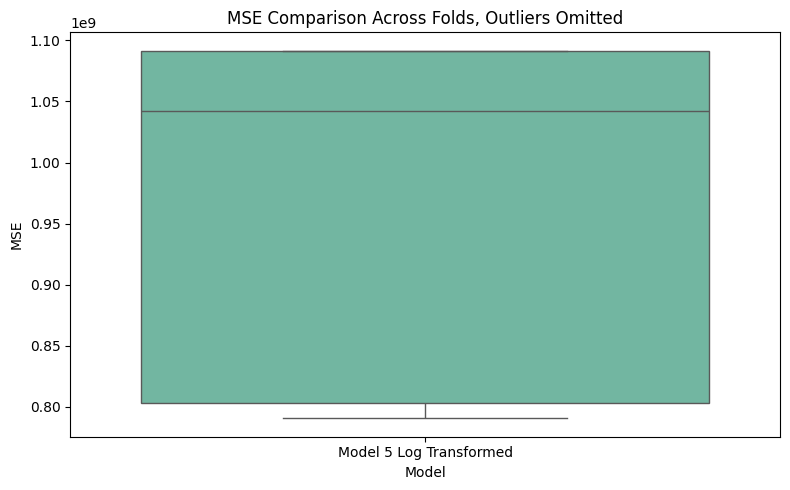

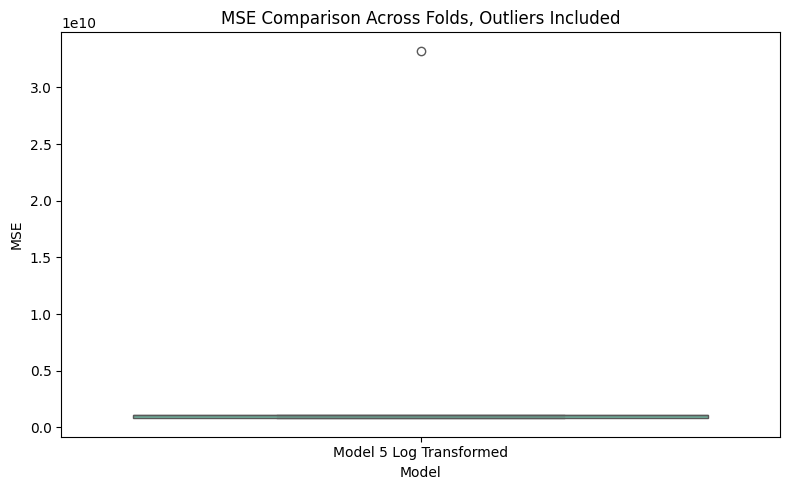

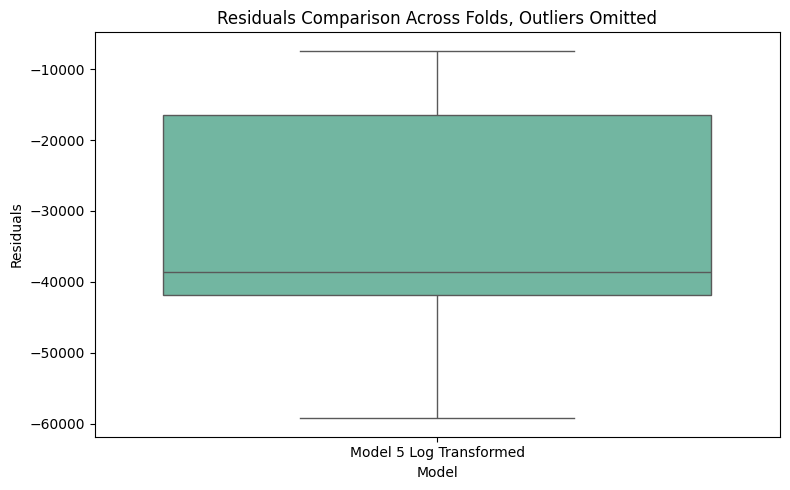

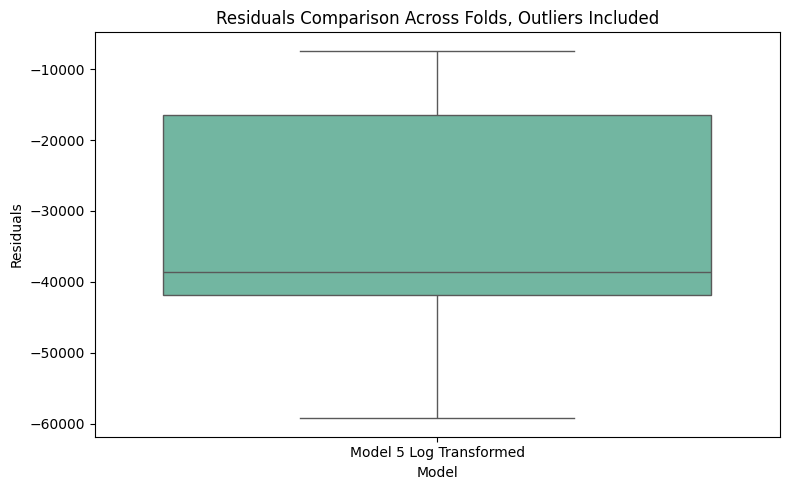

In [123]:
# replotting our boxplots for log transformed Model 5
records = []
for i in range(len(model_5_log_metrics['r2'])):
        records.append({
            'Model': 'Model 5 Log Transformed',
            'R2': model_5_log_metrics['r2'][i],
            'Adj_R2': model_5_log_metrics['adj_r2'][i],
            'AIC': model_5_log_metrics['aic'][i],
            'MSE': model_5_log_metrics['mse'][i],
            "Residuals": model_5_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Final Model
The Log Transformed Model 2 through 5 had positive effects for many aspects of these models. AIC for all models except Model 4 decreased dramatically across folds, indicating that the models are better suited to predict unseen data now. Residual plots have lost their funnel shape, and remaining outlier residuals may require a deeper look at leverage or outliers in the dataset. Thanks to the log scaling, differences MinMax or Standard scaling on certain regression metrics like R2 and AIC between Models 2-4 are gone.

While all log transformed Models were very similar in all metrics, Model 2 and 5 still show signs of multicollinearity and so will be avoided in the final run. Model 4 will be chosen as the final model, although Model 3 would likely return identical if not very similar results.


# Predictions for Test Dataset - Original Linear Regression

In [124]:
# pulling in the test dataset
test_file_path = project_path + "test.csv"
test_df = pd.read_csv(test_file_path)
print("Full train dataset shape is {}".format(test_df.shape))

Full train dataset shape is (1459, 80)


In [125]:
# get log transformed MinMax
cols = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']
X_test = test_df[cols]
X_test = pd.DataFrame(min_max_x_scaler.transform(X_test), columns=cols)
X_test = sm.add_constant(X_test, has_constant='add')

# our chosen final model
predictions = model_log_4.predict(X_test)

# since the model is log transformed, need to invert
predictions = np.exp(predictions)

In [126]:
len(predictions)

1459

## Visual Analysis of Predictions

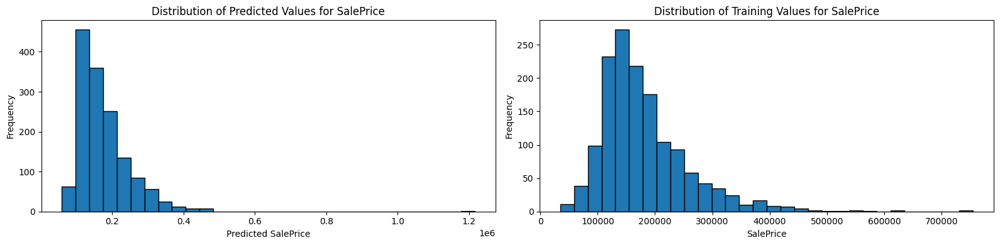

In [127]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# hist of predicted values
axes[0].hist(predictions, bins=30, edgecolor='k')
axes[0].set_title("Distribution of Predicted Values for SalePrice")
axes[0].set_xlabel("Predicted SalePrice")
axes[0].set_ylabel("Frequency")

# hist of training values
axes[1].hist(train_df["SalePrice"], bins=30, edgecolor='k')
axes[1].set_title("Distribution of Training Values for SalePrice")
axes[1].set_xlabel("SalePrice")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


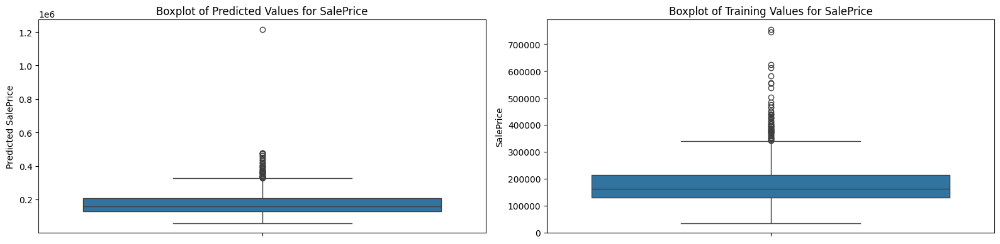

In [128]:
# boxplot
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# boxplot of predicted values
sns.boxplot(y=predictions, ax=axes[0])
axes[0].set_title("Boxplot of Predicted Values for SalePrice")
axes[0].set_ylabel("Predicted SalePrice")

# boxplot of training values
sns.boxplot(y=train_df["SalePrice"], ax=axes[1])
axes[1].set_title("Boxplot of Training Values for SalePrice")
axes[1].set_ylabel("SalePrice")

plt.tight_layout()
plt.show()


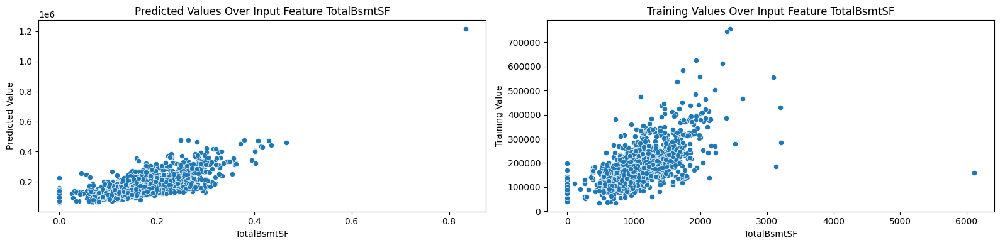

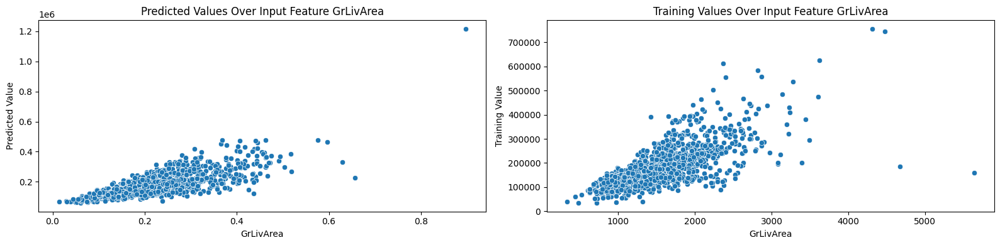

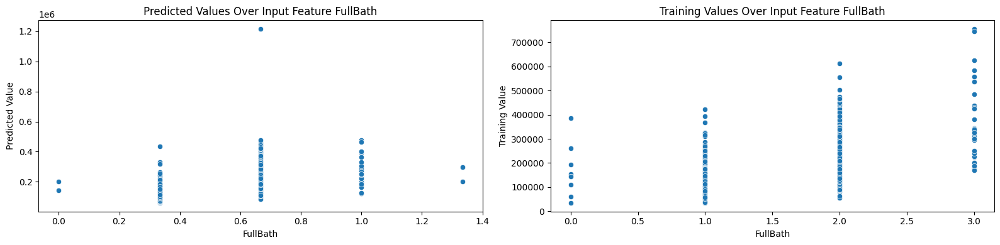

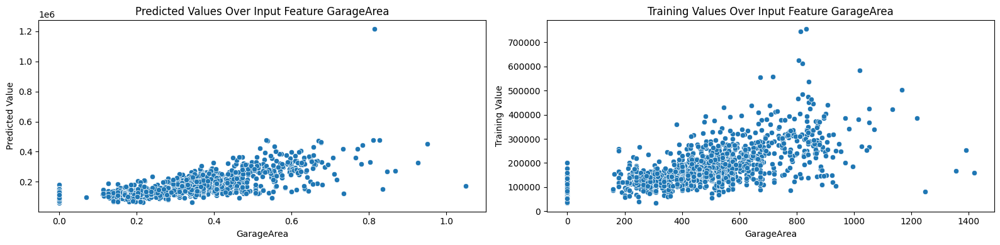

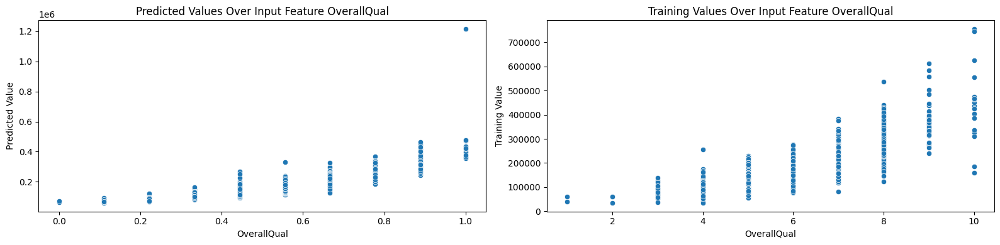

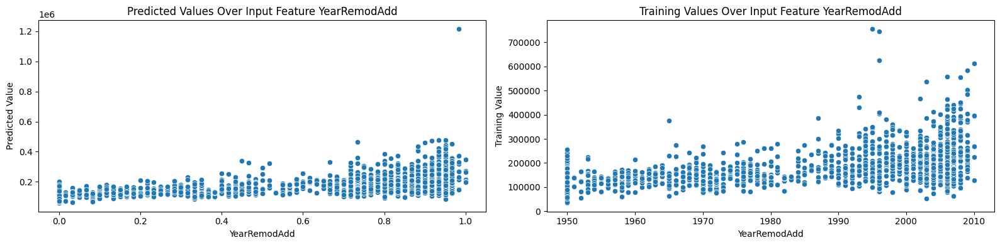

In [129]:
# feature wise analysis

for col in X_test.drop(columns="const").columns:
  fig, axes = plt.subplots(1, 2, figsize=(16, 4))

  sns.scatterplot(data=X_test, x=col, y=predictions, ax=axes[0])
  axes[0].set_title(f"Predicted Values Over Input Feature {col}")
  axes[0].set_xlabel(col)
  axes[0].set_ylabel("Predicted Value")

  sns.scatterplot(data=train_df, x=col, y='SalePrice', ax=axes[1])
  axes[1].set_title(f"Training Values Over Input Feature {col}")
  axes[1].set_xlabel(col)
  axes[1].set_ylabel("Training Value")

  plt.tight_layout()
  plt.show()


  The predictions roughly follow the same patterns across features as with the training data set. The test dataset appears to have one outlying datapoint, both in terms of predictor values and the predicted SalePrice. The test dataset altogether shows less variance of SalePrice across features, which could indicate that the model potentially overfitted from the training data. Predictions are to be submitted to Kaggle for an evaluation by MSE to the true values of SalePrice by the dataset.

# Additional Variables

In [130]:
eval_target_vars = ['SalePrice']

In [131]:
eval_vars = ['TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd', 'YearBuilt']

In [132]:
eval_train_df = train_df[eval_target_vars + eval_vars]
eval_train_df

,SalePrice,TotalBsmtSF,1stFlrSF,2ndFlrSF,FullBath,GarageArea,OverallQual,YearRemodAdd,YearBuilt
0,208500,856,856,854,2,548,7,2003,2003
1,181500,1262,1262,0,2,460,6,1976,1976
2,223500,920,920,866,2,608,7,2002,2001
3,140000,756,961,756,1,642,7,1970,1915
4,250000,1145,1145,1053,2,836,8,2000,2000
...,...,...,...,...,...,...,...,...,...
1455,175000,953,953,694,2,460,6,2000,1999
1456,210000,1542,2073,0,2,500,6,1988,1978
1457,266500,1152,1188,1152,2,252,7,2006,1941
1458,142125,1078,1078,0,1,240,5,1996,1950


# LASSO Regression

`Lasso regression` was applied to `eval_train_df`, which includes engineered and selected predictors of SalePrice. LassoCV performed variable selection by assigning zero coefficients to less influential features, while retaining the most predictive ones. The plot below will visualize the contribution of each feature after regularization.


In [133]:
# Prepare X and y
X_eval = eval_train_df.drop('SalePrice', axis=1)
y_eval = eval_train_df['SalePrice']

In [134]:
#Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_eval)


In [135]:
# Train Lasso Regression with cross-validation
lasso_cv = LassoCV(cv=12, random_state=42)
lasso_cv.fit(X_scaled, y_eval)

LassoCV(cv=12, random_state=42)

In [136]:
# Predict and evaluate
y_pred_lasso = lasso_cv.predict(X_scaled)

# Create coefficients
lasso_results = pd.DataFrame({
    'Feature': X_eval.columns,
    'Coefficient': lasso_cv.coef_
})
lasso_results['abs_coef'] = lasso_results['Coefficient'].abs()
lasso_results = lasso_results.sort_values(by='abs_coef', ascending=False)


In [137]:
y_pred = lasso_cv.predict(X_scaled)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"Best alpha: {lasso_cv.alpha_:.4f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R² Score: {r2:.4f}")


Best alpha: 1177.0578
Mean Squared Error: 1444949600.19
R² Score: 0.7709


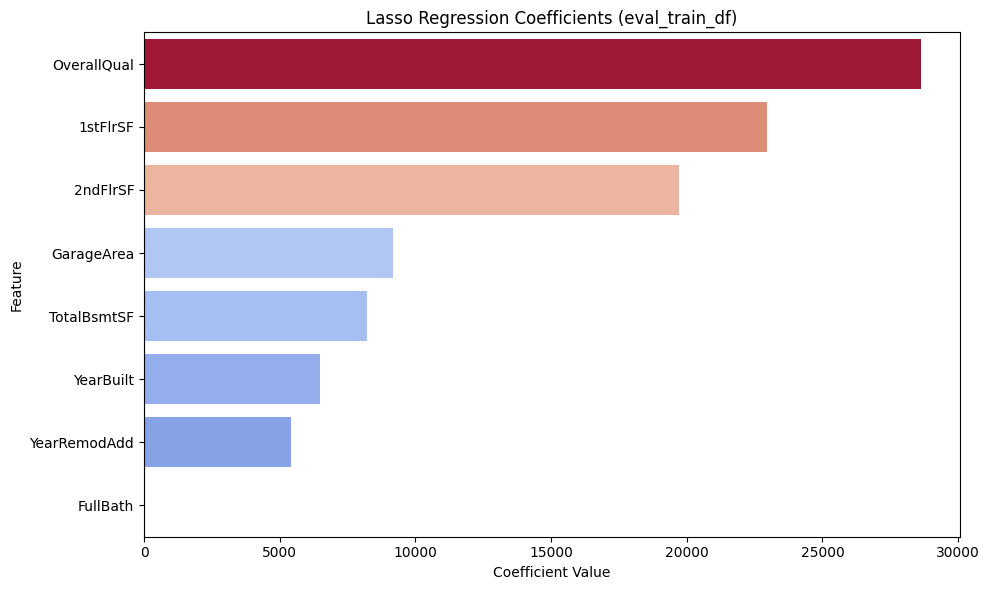

In [138]:
#Visual
plt.figure(figsize=(10, 6))
sns.barplot(data=lasso_results, x='Coefficient', y='Feature',hue='Coefficient', palette='coolwarm', legend= False)
plt.axvline(0, color='black', linestyle='--')
plt.title("Lasso Regression Coefficients (eval_train_df)")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

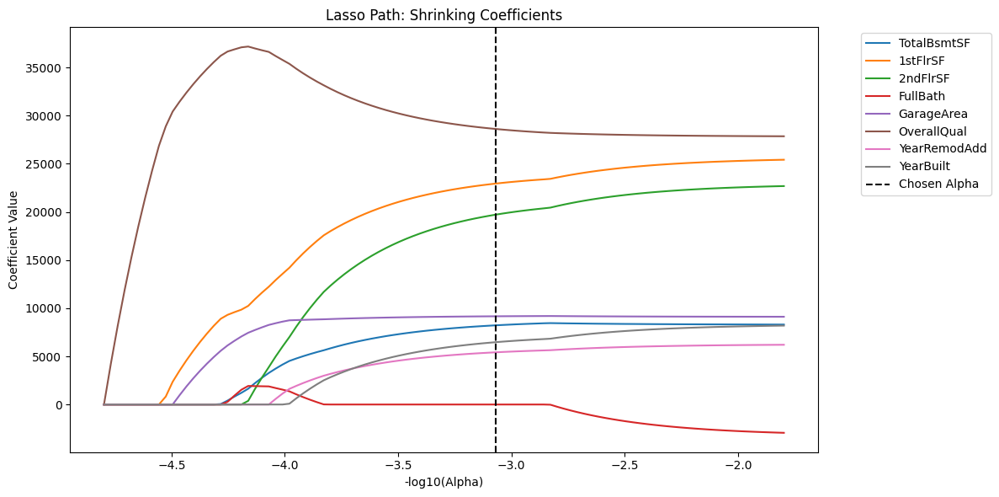

In [139]:
alphas_lasso, coefs_lasso, _ = lasso_path(X_scaled, y_eval)

plt.figure(figsize=(12, 6))
for i, feature in enumerate(X_eval.columns):
    plt.plot(-np.log10(alphas_lasso), coefs_lasso[i], label=feature)

plt.axvline(-np.log10(lasso_cv.alpha_), linestyle='--', color='black', label='Chosen Alpha')
plt.xlabel("-log10(Alpha)")
plt.ylabel("Coefficient Value")
plt.title("Lasso Path: Shrinking Coefficients")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


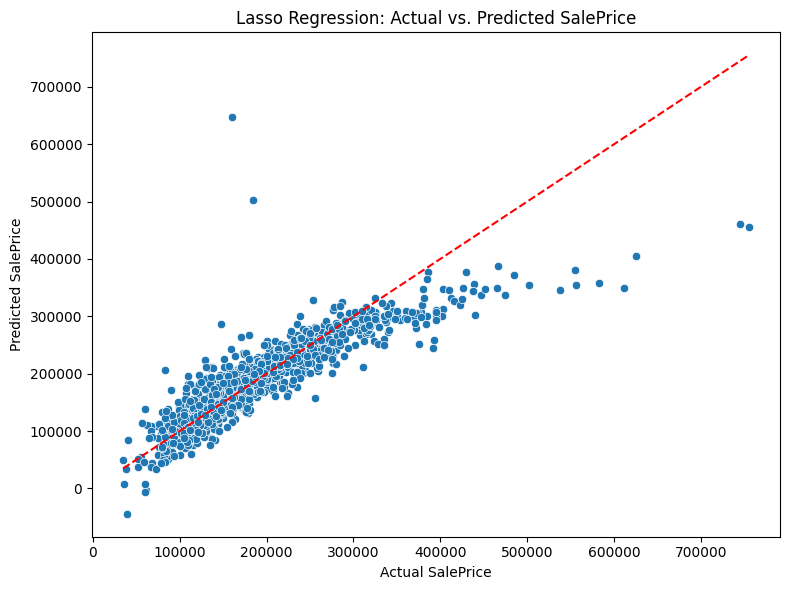

In [140]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y, y=y_pred)
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # perfect prediction line
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Lasso Regression: Actual vs. Predicted SalePrice')
plt.tight_layout()
plt.show()


This scatterplot displays the predicted sale prices from our Lasso model alongside the actual prices. The red dashed line indicates where predicted prices match actual prices. Most points are near this line, suggesting that the model is effective; however, a few outliers indicate that some high-value homes are more challenging to predict.


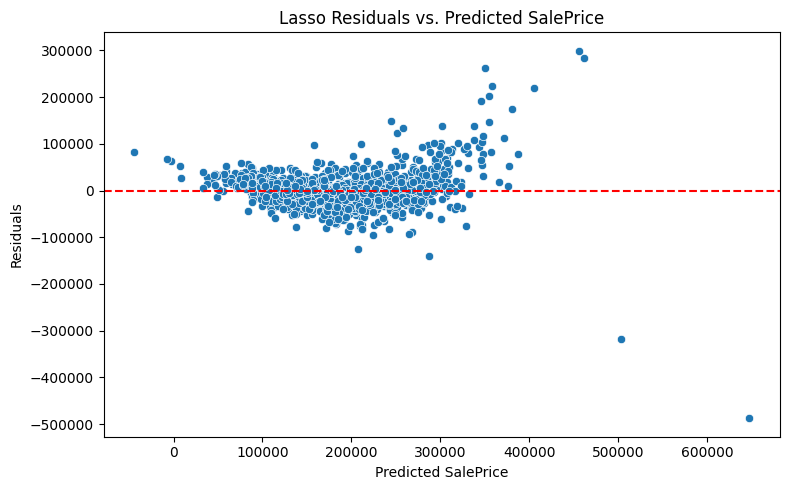

In [141]:
# Residual Plot
residuals = y_eval - y_pred_lasso
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_pred_lasso, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title("Lasso Residuals vs. Predicted SalePrice")
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals")
plt.tight_layout()
plt.show()


In [142]:
# Top features summary (table)
top_features = lasso_results[['Feature', 'Coefficient']].head(5)
print("Top 5 Influential Features (Lasso):")
display(top_features)


Top 5 Influential Features (Lasso):


,Feature,Coefficient
5,OverallQual,28624.415083
1,1stFlrSF,22946.094468
2,2ndFlrSF,19716.175694
4,GarageArea,9164.372540
0,TotalBsmtSF,8222.535935


In [143]:
test_df[eval_vars].isnull().sum().sort_values(ascending=False).head(10)

,0
TotalBsmtSF,1
GarageArea,1
1stFlrSF,0
2ndFlrSF,0
FullBath,0
OverallQual,0
YearRemodAdd,0
YearBuilt,0


In [144]:
# Clean up column names just in case
test_df.columns = test_df.columns.astype(str).str.strip()

test_df['TotalBsmtSF'].fillna(train_df['TotalBsmtSF'].median(), inplace=True)
test_df['GarageArea'].fillna(train_df['GarageArea'].median(), inplace=True)


/tmp/ipython-input-144-940835942.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test_df['TotalBsmtSF'].fillna(train_df['TotalBsmtSF'].median(), inplace=True)
/tmp/ipython-input-144-940835942.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].m

In [145]:
X_test_scaled = scaler.transform(test_df[eval_vars])
lasso_predictions = lasso_cv.predict(X_test_scaled)


In [146]:
lasso_prediction_df = pd.DataFrame({
    'Id': test_df['Id'],
    'SalePrice': lasso_predictions
})

In [147]:
lasso_prediction_df

,Id,SalePrice
0,1461,125914.967648
1,1462,161356.206663
2,1463,167148.649795
3,1464,186357.523526
4,1465,223471.682751
...,...,...
1454,2915,75789.897622
1455,2916,88052.990432
1456,2917,154175.894197
1457,2918,114355.817732


In [148]:
# Export test predictions to CSV
lasso_prediction_df.to_csv("/content/drive/My Drive/NU | MSDS 422 | Group 3/Assignments/Assignment 3: Housing Price Indicators/predictions_lasso.csv", index=False)

# Ridge Regression

In [149]:
# Split train_df into features and target
ridge_X = eval_train_df[eval_vars]
ridge_y = eval_train_df[eval_target_vars]

In [150]:
# Train-test split
ridge_X_train, ridge_X_valid, ridge_y_train, ridge_y_valid = train_test_split(
    ridge_X, ridge_y, test_size=0.2, random_state=42
)

In [151]:
# Log-transform SalePrice
ridge_y_train_log = np.log(ridge_y_train)
ridge_y_valid_log = np.log(ridge_y_valid)

In [152]:
# Fit MinMaxScaler on training features, transform both train and valid sets
min_max_x_scaler = MinMaxScaler()
ridge_X_train_scaled = pd.DataFrame(
    min_max_x_scaler.fit_transform(ridge_X_train), columns=eval_vars
)
ridge_X_valid_scaled = pd.DataFrame(
    min_max_x_scaler.transform(ridge_X_valid), columns=eval_vars
)

In [153]:
# Set alpha values
alphas = np.unique(np.concatenate([
    np.arange(0, 2.5, 0.01),
]))

In [154]:
# Train RidgeCV model
ridge_cv_model = RidgeCV(alphas=alphas, cv=12, scoring='neg_mean_squared_error')
ridge_cv_model.fit(ridge_X_train_scaled, ridge_y_train_log)

RidgeCV(alphas=array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
       0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
       0.66, 0...
       1.76, 1.77, 1.78, 1.79, 1.8 , 1.81, 1.82, 1.83, 1.84, 1.85, 1.86,
       1.87, 1.88, 1.89, 1.9 , 1.91, 1.92, 1.93, 1.94, 1.95, 1.96, 1.97,
       1.98, 1.99, 2.  , 2.01, 2.02, 2.03, 2.04, 2.05, 2.06, 2.07, 2.08,
       2.09, 2.1 , 2.11, 2.12, 2.13, 2.14, 2.15, 2.16, 2.17, 2.18, 2.19,
       2.2 , 2.21, 2.22, 2.23, 2.24, 2.25, 2.26, 2.27, 2.28, 2.29, 2.3 ,
       2.31, 2.32, 2.33, 2.34, 2.35, 2.36, 2.37, 2.38, 2.39, 2.4 , 2.41,
       2.42, 2.43, 2.44, 2.45, 2.46, 2.47, 2.48, 2.49]),
        cv=12, scoring='neg_mean_squared_error')

In [155]:
# Model Coefficients
ridge_coefficients = pd.DataFrame({
    'Feature': ridge_X_train.columns,
    'Coefficient': ridge_cv_model.coef_
})

/tmp/ipython-input-156-3270421705.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=ridge_coefficients, x='Coefficient', y='Feature', palette='coolwarm')


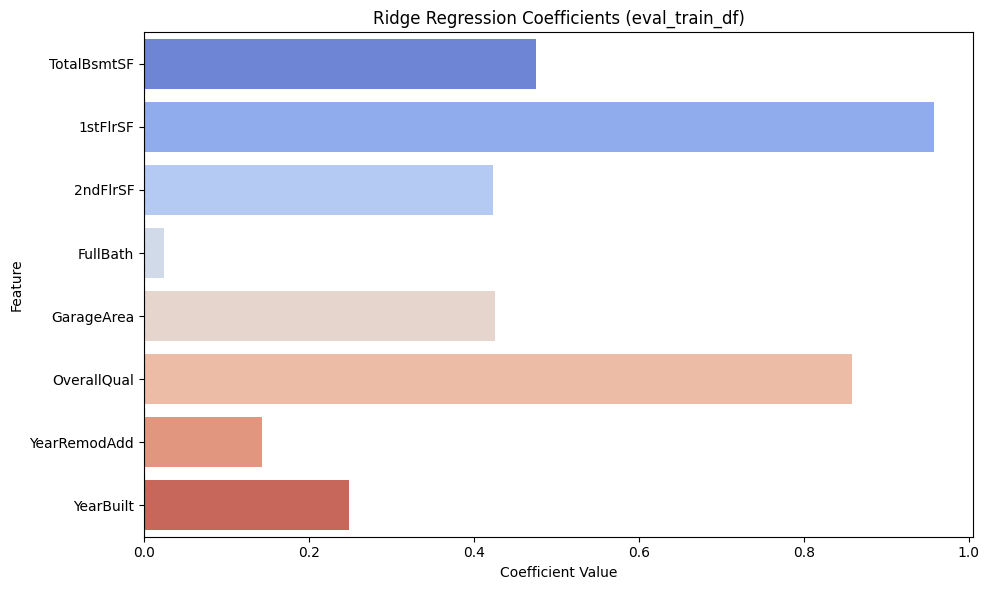

In [156]:
plt.figure(figsize=(10, 6))
sns.barplot(data=ridge_coefficients, x='Coefficient', y='Feature', palette='coolwarm')
plt.axvline(0, color='black', linestyle='--')
plt.title("Ridge Regression Coefficients (eval_train_df)")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

In [157]:
# Predict and invert log transform
ridge_log_preds_valid = ridge_cv_model.predict(ridge_X_valid_scaled)
ridge_preds_valid = np.exp(ridge_log_preds_valid)

In [158]:
# Evaluate
ridge_mae = mean_absolute_error(ridge_y_valid, ridge_preds_valid)
ridge_mse = mean_squared_error(ridge_y_valid, ridge_preds_valid)
ridge_rmse = np.sqrt(ridge_mse)
ridge_r2 = r2_score(ridge_y_valid, ridge_preds_valid)

In [159]:
# Output metrics
print("RidgeCV Regression Metrics:")
print(f"Best alpha: {ridge_cv_model.alpha_}")
print(f"MAE:  {ridge_mae:.2f}")
print(f"MSE:  {ridge_mse:.2f}")
print(f"RMSE: {ridge_rmse:.2f}")
print(f"R²:   {ridge_r2:.4f}")

RidgeCV Regression Metrics:
Best alpha: 1.42
MAE:  20878.14
MSE:  1142623411.63
RMSE: 33802.71
R²:   0.8510


In [160]:
# Predict on test set (same as validation here, replace if actual test set exists)
ridge_log_preds_test = ridge_cv_model.predict(ridge_X_valid_scaled)
ridge_preds_test = np.exp(ridge_log_preds_test)

In [161]:
# Residuals
ridge_y_valid_series = ridge_y_valid.iloc[:, 0]  # Convert df to Series
ridge_preds_valid_series = pd.Series(ridge_preds_valid, index=ridge_y_valid.index)
ridge_residuals = ridge_y_valid_series - ridge_preds_valid_series

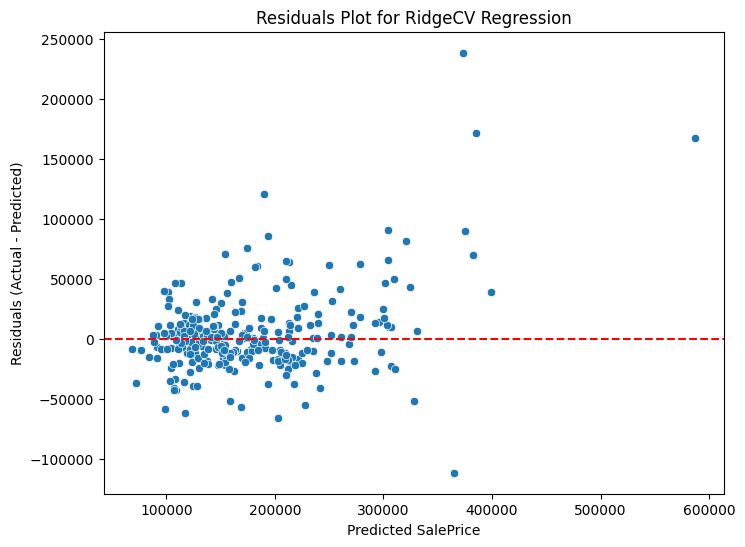

In [162]:
# Plot residuals
plt.figure(figsize=(8, 6))
sns.scatterplot(x=ridge_preds_valid, y=ridge_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Residuals (Actual - Predicted)')
plt.title('Residuals Plot for RidgeCV Regression')
plt.show()

In [163]:
# Convert values to Series
ridge_y_valid_series = ridge_y_valid.iloc[:, 0]

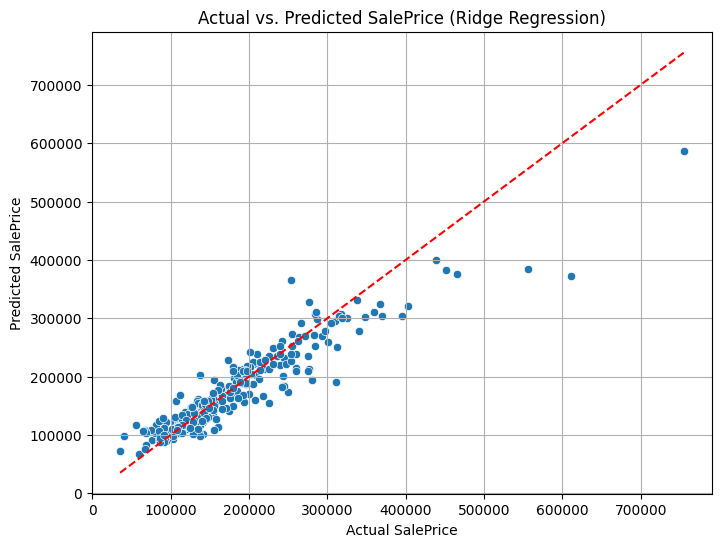

In [164]:
# Scatterplot of Actual vs. Predicted SalePrice
plt.figure(figsize=(8, 6))
sns.scatterplot(x=ridge_y_valid_series, y=ridge_preds_valid)
plt.plot([ridge_y_valid_series.min(), ridge_y_valid_series.max()],
         [ridge_y_valid_series.min(), ridge_y_valid_series.max()],
         color='red', linestyle='--')  # 45-degree reference line
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs. Predicted SalePrice (Ridge Regression)')
plt.grid(True)
plt.show()

In [165]:
# Prep for residual plot
ridge_y_valid_series = ridge_y_valid.iloc[:, 0]
ridge_preds_valid_series = pd.Series(ridge_preds_valid, index=ridge_y_valid.index)

In [166]:
# Calculate residuals
ridge_residuals = ridge_y_valid_series - ridge_preds_valid_series

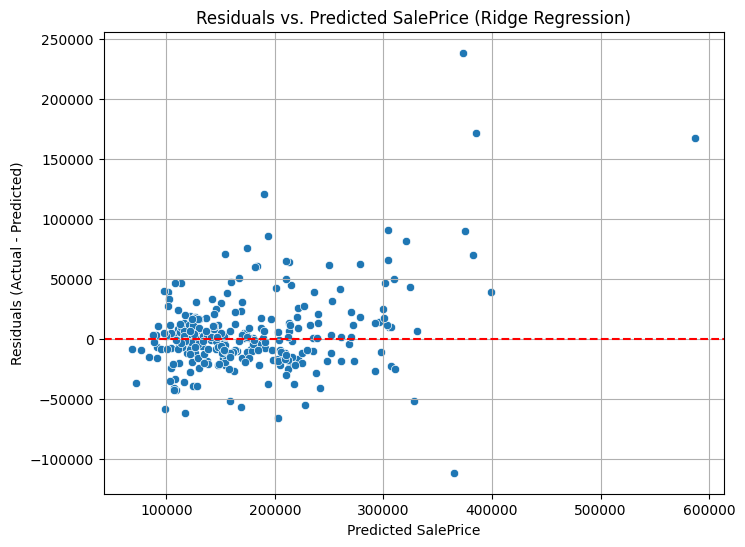

In [167]:
# Plot: Residuals vs. Predicted SalePrice
plt.figure(figsize=(8, 6))
sns.scatterplot(x=ridge_preds_valid_series, y=ridge_residuals)
plt.axhline(0, color='red', linestyle='--')  # zero residual line
plt.xlabel('Predicted SalePrice')
plt.ylabel('Residuals (Actual - Predicted)')
plt.title('Residuals vs. Predicted SalePrice (Ridge Regression)')
plt.grid(True)
plt.show()

In [168]:
# Impute missing values
imputer = SimpleImputer(strategy='mean')
ridge_X_test_imputed = pd.DataFrame(
    imputer.fit_transform(test_df[eval_vars]),
    columns=eval_vars,
    index=test_df.index
)

In [169]:
# Scale using MinMaxScaler
ridge_X_test_scaled = pd.DataFrame(
    min_max_x_scaler.transform(ridge_X_test_imputed),
    columns=eval_vars,
    index=test_df.index
)

In [170]:
# Predict log(SalePrice), then invert
ridge_log_preds_test = ridge_cv_model.predict(ridge_X_test_scaled)
ridge_preds_test = np.exp(ridge_log_preds_test)

In [171]:
# Create predictions DataFrame
ridge_predictions_df = pd.DataFrame({
    "Id": test_df['Id'],
    "SalePrice": ridge_preds_test
})

In [172]:
ridge_predictions_df

,Id,SalePrice
0,1461,129839.520591
1,1462,141664.625970
2,1463,165222.330977
3,1464,180465.224983
4,1465,208170.705962
...,...,...
1454,2915,99307.142212
1455,2916,108213.032758
1456,2917,148448.512981
1457,2918,120951.998376


In [173]:
# Export test predictions to CSV
ridge_predictions_df.to_csv("/content/drive/My Drive/NU | MSDS 422 | Group 3/Assignments/Assignment 3: Housing Price Indicators/predictions_ridge.csv", index=False)

# ElasticNet

In [174]:
X_en = eval_train_df[eval_vars]
y_en = eval_train_df['SalePrice']

# Define ElasticNetCV model
elastic_cv = ElasticNetCV(
    cv=12,
    l1_ratio=[0.1, 0.5, 0.9, 1.0],
    alphas=np.logspace(-3, 1, 30),
    random_state=42,
    max_iter=5000,
)

# Wrap in pipeline to standardize X inside CV
en_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', elastic_cv)
])

# Define scoring metrics
scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'RMSE': 'neg_root_mean_squared_error'
}

# Perform 5-fold cross-validation
en_results = cross_validate(
    en_pipeline,
    X_en, y_en,
    scoring=scoring,
    cv=5,
    return_train_score=False
)

# Compute average metrics (flip sign for neg_ metrics)
en_summary = {
    metric: np.mean(en_results[f'test_{metric}']) * (-1 if 'neg_' in scoring.get(metric, '') else 1)
    for metric in scoring
}

print("Cross-Validated Metrics:")
for metric, val in en_summary.items():
    print(f"{metric:>5}: {val:.4f}")

# Fit the full pipeline on all data to get best alpha and l1_ratio
en_pipeline.fit(X_en, y_en)
en_model = en_pipeline.named_steps['model']

print("\nBest ElasticNetCV Parameters (fit on full data):")
print(f"  Alpha     (λ): {en_model.alpha_:.6f}")
print(f"  L1 Ratio  (r): {en_model.l1_ratio_}")


Cross-Validated Metrics:
   R2: 0.7603
  MAE: 23771.4051
 RMSE: 38539.2418

Best ElasticNetCV Parameters (fit on full data):
  Alpha     (λ): 0.117210
  L1 Ratio  (r): 0.5


In [175]:
# outputting coeffients
en_model_coeff = pd.DataFrame({
    'Feature': X_en.columns,
    'Coefficient': en_model.coef_
})

en_model_coeff['abs_coef'] = en_model_coeff['Coefficient'].abs()
en_model_coeff = en_model_coeff.sort_values(by='abs_coef', ascending=False)
en_model_coeff

,Feature,Coefficient,abs_coef
5,OverallQual,26228.546835,26228.546835
1,1stFlrSF,21637.513404,21637.513404
2,2ndFlrSF,20407.107921,20407.107921
0,TotalBsmtSF,10376.624485,10376.624485
4,GarageArea,9973.431651,9973.431651
7,YearBuilt,7250.770956,7250.770956
6,YearRemodAdd,6535.697250,6535.697250
3,FullBath,-397.672965,397.672965


/tmp/ipython-input-176-1024639665.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=en_model_coeff, x='Coefficient', y='Feature', palette='coolwarm')


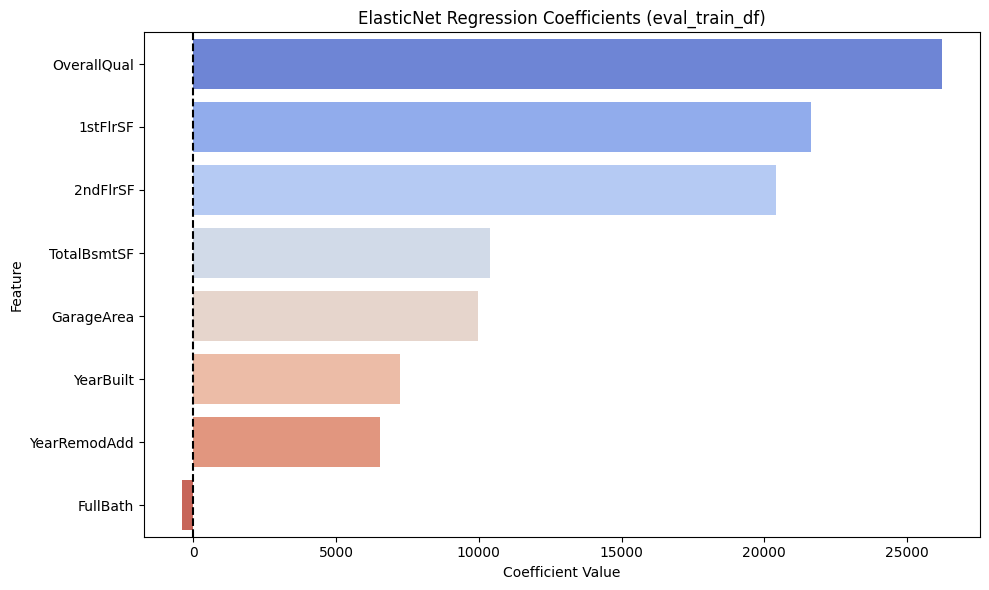

In [176]:
plt.figure(figsize=(10, 6))
sns.barplot(data=en_model_coeff, x='Coefficient', y='Feature', palette='coolwarm')
plt.axvline(0, color='black', linestyle='--')
plt.title("ElasticNet Regression Coefficients (eval_train_df)")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

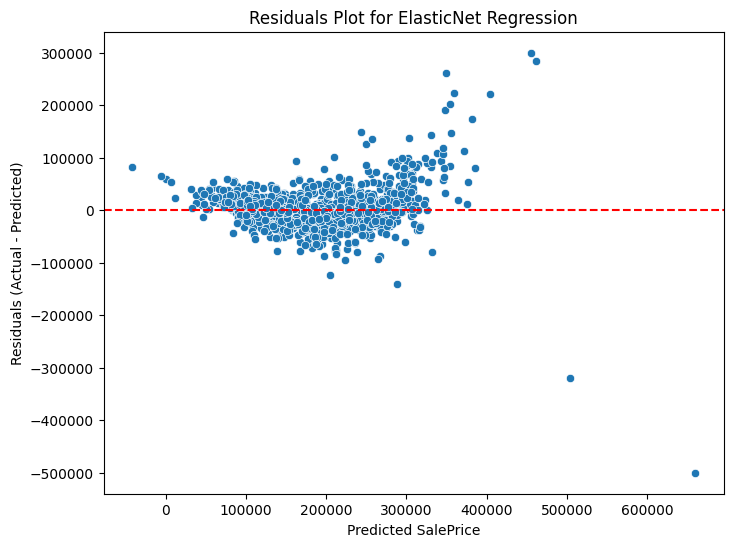

In [177]:
# Plot residuals
y_pred = en_pipeline.predict(X_en)
en_residuals = y_en - y_pred

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred, y=en_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Residuals (Actual - Predicted)')
plt.title('Residuals Plot for ElasticNet Regression')
plt.show()

In [178]:
# obtaining adjusted r2 and AIC for multi model comparison
p = np.sum(en_pipeline.named_steps['model'].coef_ != 0)
n = len(y_en)

adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
rss = np.sum((y_en - y_pred) ** 2)
aic = n * np.log(rss / n) + 2 * p

print(f"    Adjusted R²: {adj_r2:.4f}")
print(f"    AIC        : {aic:.2f}")

    Adjusted R²: 0.7696
    AIC        : 30809.12


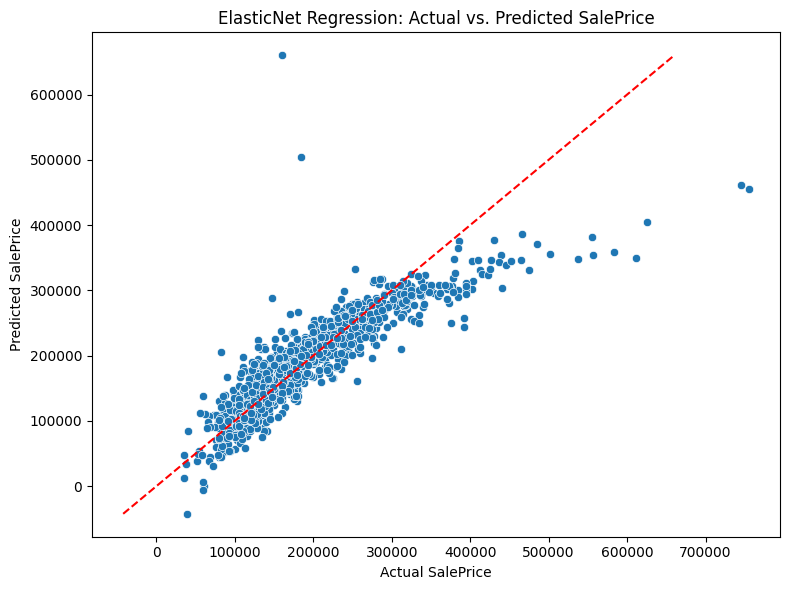

In [179]:
# another visualization
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_en, y=y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--', color='red')  # perfect prediction line
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('ElasticNet Regression: Actual vs. Predicted SalePrice')
plt.tight_layout()
plt.show()


In [180]:
# there is some heteroscadascity - will perform a log transform of y_en to correct
from sklearn.compose import TransformedTargetRegressor


# Define ElasticNetCV model
elastic_cv_log = ElasticNetCV(
    cv=5,
    l1_ratio=[0.1, 0.5, 0.9, 1.0],
    alphas=np.logspace(-3, 1, 30),
    random_state=42,
    max_iter=5000,
)

# Inner pipeline: standardize X, fit ElasticNet
inner_log_en_pipeline= Pipeline([
    ('scaler', StandardScaler()),
    ('model', elastic_cv_log)
])

# Outer wrapper: log-transform the target variable y
outer_log_en_pipeline = TransformedTargetRegressor(
    regressor=inner_log_en_pipeline,
    func=np.log1p,        # Apply log(1 + y)
    inverse_func=np.expm1 # Inverse: exp(y) - 1
)

# Perform 5-fold cross-validation
en_log_results = cross_validate(
    outer_log_en_pipeline,
    X_en, y_en,
    scoring=scoring,
    cv=5,
    return_train_score=False
)

# Compute average metrics (flip sign for neg_ metrics)
en_log_summary = {
    metric: np.mean(en_log_results[f'test_{metric}']) * (-1 if 'neg_' in scoring.get(metric, '') else 1)
    for metric in scoring
}

print("Cross-Validated Metrics (with log-transformed y):")
for metric, val in en_log_summary.items():
    print(f"{metric:>5}: {val:.4f}")

# Fit the full pipeline on all data
outer_log_en_pipeline.fit(X_en, y_en)

# Extract the ElasticNetCV model
en_log_model = outer_log_en_pipeline.regressor_.named_steps['model']

print("\nBest ElasticNetCV Parameters (fit on log-transformed y):")
print(f"  Alpha     (λ): {en_log_model.alpha_:.6f}")
print(f"  L1 Ratio  (r): {en_log_model.l1_ratio_}")


Cross-Validated Metrics (with log-transformed y):
   R2: 0.3752
  MAE: 21628.3346
 RMSE: 52460.0881

Best ElasticNetCV Parameters (fit on log-transformed y):
  Alpha     (λ): 0.017433
  L1 Ratio  (r): 0.1


In [181]:
# our metrics look worse in log transform, but comparing in Log space may be more fair
# computing RMSE or R² on the original scale (after applying the inverse transform like exp) results in small differences in log space and can translate into large absolute differences on the original scale — which can inflate RMSE and deflate R². (chatgpt)

# Predict in log space
y_log_true = np.log1p(y_en)
y_log_pred = en_log_model.predict(StandardScaler().fit_transform(X_en))

r2_log = r2_score(y_log_true, y_log_pred)
rmse_log = np.sqrt(mean_squared_error(y_log_true, y_log_pred))

print(f"R² in log space: {r2_log:.4f}")
print(f"RMSE in log space: {rmse_log:.4f}")


R² in log space: 0.8169
RMSE in log space: 0.1709


(0.0, 550000.0)

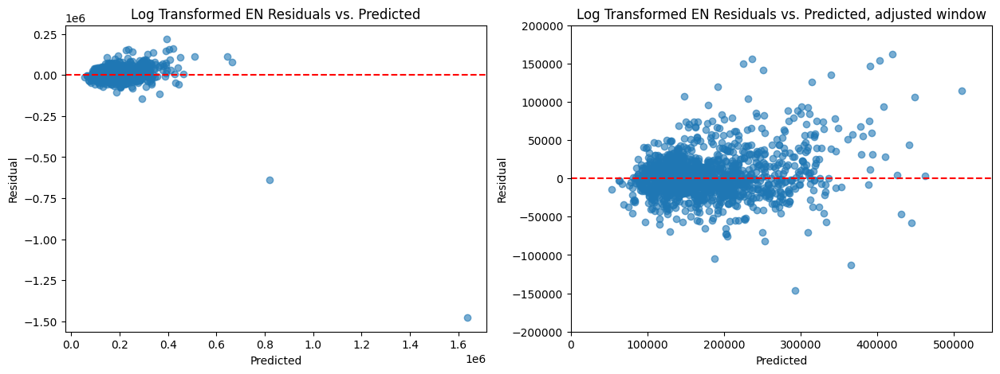

In [182]:
# review our residuals
y_pred = outer_log_en_pipeline.predict(X_en)
en_log_residuals = y_en - y_pred

# some outliers so cutting them out
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Residuals vs Predictions
axs[0].scatter(y_pred, en_log_residuals, alpha=0.6)
axs[0].axhline(0, color='red', linestyle='--')
axs[0].set_title('Log Transformed EN Residuals vs. Predicted')
axs[0].set_xlabel('Predicted')
axs[0].set_ylabel('Residual')

axs[1].scatter(y_pred, en_log_residuals, alpha=0.6)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Log Transformed EN Residuals vs. Predicted, adjusted window')
axs[1].set_xlabel('Predicted')
axs[1].set_ylabel('Residual')
axs[1].set_ylim(-200000, 200000)
axs[1].set_xlim(0, 550000)

In [183]:
# obtaining adjusted r2 and AIC for multi model comparison
p = np.sum(outer_log_en_pipeline.regressor_.named_steps['model'].coef_ != 0)
n = len(y_en)

adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
rss = np.sum((y_en - y_pred) ** 2)
aic = n * np.log(rss / n) + 2 * p

print(f"    Adjusted R²: {adj_r2:.4f}")
print(f"    AIC        : {aic:.2f}")

    Adjusted R²: 0.7698
    AIC        : 31674.70


In [184]:
# performing predictions to output to Kaggle
# pulling in the test dataset
X_test = test_df[eval_vars]
X_test.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TotalBsmtSF   1459 non-null   float64
 1   1stFlrSF      1459 non-null   int64  
 2   2ndFlrSF      1459 non-null   int64  
 3   FullBath      1459 non-null   int64  
 4   GarageArea    1459 non-null   float64
 5   OverallQual   1459 non-null   int64  
 6   YearRemodAdd  1459 non-null   int64  
 7   YearBuilt     1459 non-null   int64  
dtypes: float64(2), int64(6)
memory usage: 91.3 KB


In [185]:
# Impute missing values
imputer = SimpleImputer(strategy='median')
en_X_test_imputed = pd.DataFrame(
    imputer.fit_transform(test_df[eval_vars]),
    columns=eval_vars,
    index=test_df.index
)
en_X_test_imputed

,TotalBsmtSF,1stFlrSF,2ndFlrSF,FullBath,GarageArea,OverallQual,YearRemodAdd,YearBuilt
0,882.0,896.0,0.0,1.0,730.0,5.0,1961.0,1961.0
1,1329.0,1329.0,0.0,1.0,312.0,6.0,1958.0,1958.0
2,928.0,928.0,701.0,2.0,482.0,5.0,1998.0,1997.0
3,926.0,926.0,678.0,2.0,470.0,6.0,1998.0,1998.0
4,1280.0,1280.0,0.0,2.0,506.0,8.0,1992.0,1992.0
...,...,...,...,...,...,...,...,...
1454,546.0,546.0,546.0,1.0,0.0,4.0,1970.0,1970.0
1455,546.0,546.0,546.0,1.0,286.0,4.0,1970.0,1970.0
1456,1224.0,1224.0,0.0,1.0,576.0,5.0,1996.0,1960.0
1457,912.0,970.0,0.0,1.0,0.0,5.0,1992.0,1992.0


In [186]:
# now we can compute
y_pred_for_output = outer_log_en_pipeline.predict(en_X_test_imputed)
len(y_pred_for_output)

1459

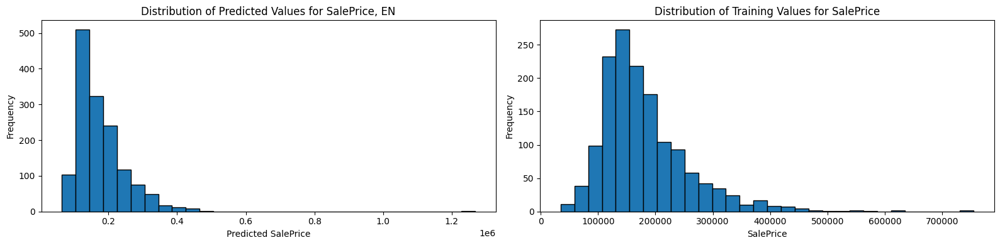

In [187]:
# visual analysos
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# hist of predicted values
axes[0].hist(y_pred_for_output, bins=30, edgecolor='k')
axes[0].set_title("Distribution of Predicted Values for SalePrice, EN")
axes[0].set_xlabel("Predicted SalePrice")
axes[0].set_ylabel("Frequency")

# hist of training values
axes[1].hist(train_df["SalePrice"], bins=30, edgecolor='k')
axes[1].set_title("Distribution of Training Values for SalePrice")
axes[1].set_xlabel("SalePrice")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()



Text(0, 0.5, 'SalePrice')

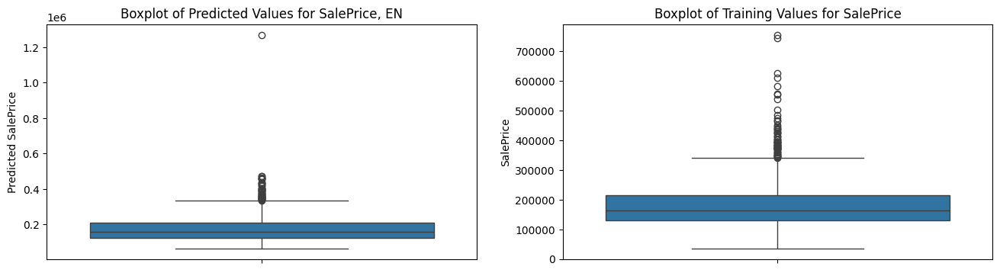

In [188]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# boxplot of predicted values
sns.boxplot(y=y_pred_for_output, ax=axes[0])
axes[0].set_title("Boxplot of Predicted Values for SalePrice, EN")
axes[0].set_ylabel("Predicted SalePrice")

# boxplot of training values
sns.boxplot(y=train_df["SalePrice"], ax=axes[1])
axes[1].set_title("Boxplot of Training Values for SalePrice")
axes[1].set_ylabel("SalePrice")

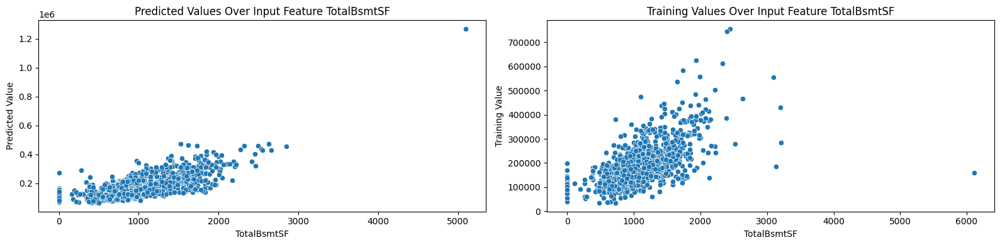

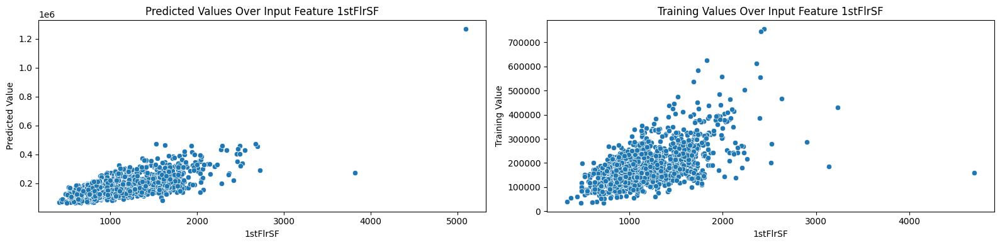

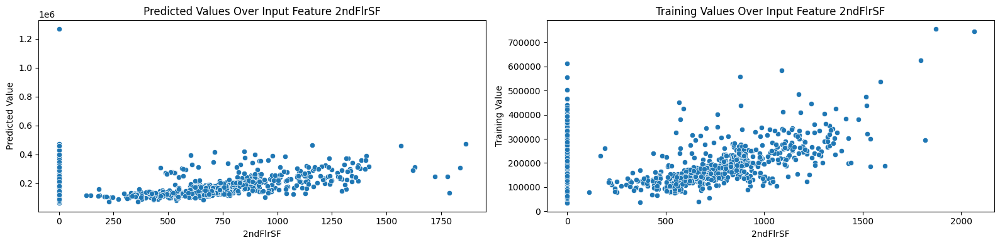

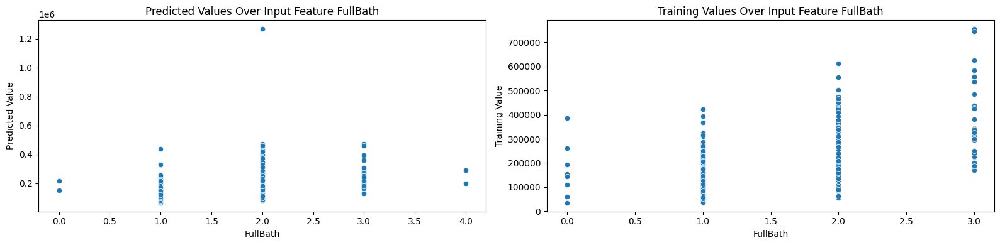

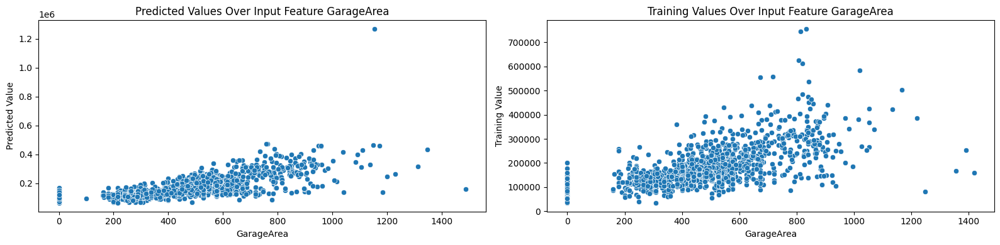

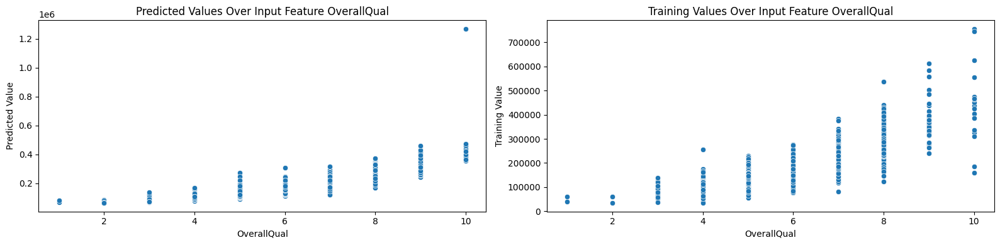

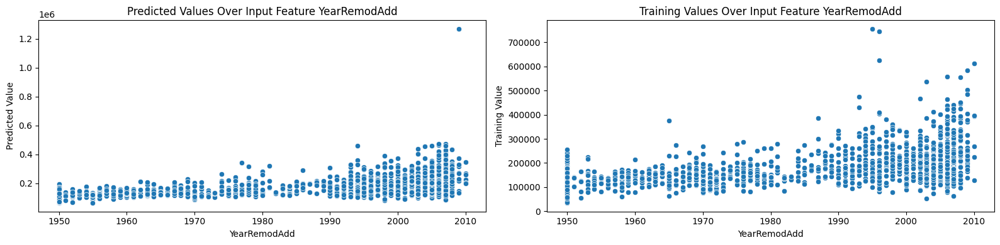

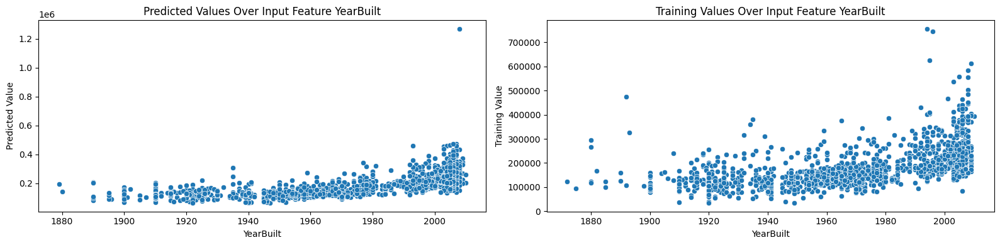

In [189]:
# feature wise analysis

for col in en_X_test_imputed.columns:
  fig, axes = plt.subplots(1, 2, figsize=(16, 4))

  sns.scatterplot(data=en_X_test_imputed, x=col, y=y_pred_for_output, ax=axes[0])
  axes[0].set_title(f"Predicted Values Over Input Feature {col}")
  axes[0].set_xlabel(col)
  axes[0].set_ylabel("Predicted Value")

  sns.scatterplot(data=train_df, x=col, y='SalePrice', ax=axes[1])
  axes[1].set_title(f"Training Values Over Input Feature {col}")
  axes[1].set_xlabel(col)
  axes[1].set_ylabel("Training Value")

  plt.tight_layout()
  plt.show()


In [190]:
# Create predictions DataFrame
en_predictions_df = pd.DataFrame({
    "Id": test_df['Id'],
    "SalePrice": y_pred_for_output
})

In [191]:
en_predictions_df

,Id,SalePrice
0,1461,125812.768844
1,1462,144590.815510
2,1463,162584.779256
3,1464,178034.740106
4,1465,208132.466065
...,...,...
1454,2915,98286.336908
1455,2916,105580.533580
1456,2917,147220.131097
1457,2918,121587.107773


In [192]:
# Export test predictions to drive
en_predictions_df.to_csv("/content/drive/My Drive/NU | MSDS 422 | Group 3/Assignments/Assignment 3: Housing Price Indicators/predictions_elasticnet.csv", index=False)